# FINAL PROJECT - Introduction To ML - Arbel Katzir, Omer Edri & Idan Kanat - 12.8.2024

# Imports

In [1]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn import preprocessing
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler, RobustScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import mean_squared_error, confusion_matrix, roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.linear_model import Lasso, LassoCV, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
import time
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import StratifiedKFold
from sklearn.exceptions import NotFittedError




In [2]:
start_time = time.time()

## Summary of Stages and Substages in the Project

### 1. Data Exploration
- **Load the Data**: Imported the dataset to begin the analysis.
- **Initial Inspection**: Basic inspection using `head()` to understand the data structure.
- **Exploratory Data Analysis (EDA)**: Visualized distributions of numerical and categorical features to identify patterns and anomalies.
- **Adjustments**: Adjusted certain column values for consistency.
- **Distribution Analysis**: Analyzed the distribution of features to understand their behavior.
- **Correlation Analysis**: Examined correlations among numerical, categorical, and null values in columns to detect relationships.
- **Relationship with Target**: Explored how features relate to the target variable.

### 2. Pre-processing
- **Handling Missing Values**: Imputed missing values using strategies like mode for categorical features and KNN imputation for numerical features.
- **Outlier Detection and Treatment**: Identified and removed outliers to enhance data quality.
- **One-Hot Encoding (OHE) for Categorical Variables**: Converted categorical variables into numerical format.
- **Normalization**: Applied scaling techniques to standardize the numerical features.
- **Feature Selection and Dimensionality Reduction**: Selected important features and reduced dimensionality for better model performance.

### 3. Running the Models
- **K-Fold Cross-Validation**: Used K-fold cross-validation to ensure the robustness of the models.
- **Model Training**: Trained various machine learning models using the processed data.

### 4. Model Evaluation
- **Confusion Matrix**: Used confusion matrix to evaluate the classification performance.
- **ROC Curves**: Plotted ROC curves to visualize the trade-off between true positive rate and false positive rate.
- **Model Selection**: Compared models based on evaluation metrics to select the best one.
- **Hyperparameter Tuning**: Tuned model hyperparameters to optimize performance.
- **Final Model Selection**: Selected the final model based on evaluation.

### 5. Making Predictions
- **Predictions on Test Data**: Made predictions using the final model on the test dataset.

## Explanation of Steps and Their Importance

- **Data Exploration**: Helps in understanding the data structure, distributions, and relationships, which is crucial for informed preprocessing and model building.
- **Pre-processing**: Improves data quality by handling missing values and outliers, transforming categorical variables, and scaling numerical features, ensuring the data is in a suitable format for modeling.
- **Running the Models**: Utilizes robust validation techniques and trains multiple models to identify the best-performing algorithms.
- **Model Evaluation**: Involves thorough evaluation using multiple metrics, ensuring the selected model performs well on unseen data.
- **Making Predictions**: Applies the final model to make predictions, providing actionable insights based on the trained machine learning models.

These steps are smart because they systematically prepare the data, ensure robust model training and evaluation, and result in reliable predictions.


# Part One: Data Exploration

### Load the data

In [3]:
# Loading the data:
df = pd.read_csv('train_telecom_marketing_data.csv')

**Dropping `Customer_ID`:**
Since intuitively, customer ID is practically meaningless to the prediction of the dependent variable (even if there are other uncorrelated & meaningless variables alongside it, in that case, we're convinced that customer ID is the most unnecessary of them to keep in our dataset, since keeping it may require more complex computations as well as more memory, while it's possible to simply not keep it without losing anything of value).

In [4]:
# Dropping 'customer_id':
df = df.drop(columns=['customer_id'])

In [5]:
# How many unique values does the 'day_of_week' column really have?
df['day_of_week'].unique()

array([15., 17., 28.,  2., nan, 31., 12., 30.,  8., 21., 29.,  4.,  7.,
       13.,  6., 18.,  9., 20., 14., 27., 23., 16., 24., 25., 19., 11.,
       26., 22.,  1.,  5.,  3., 10.])

**Transformation - Renaming `Day of Week` to `day_in_month`:** The column `day_of_week` is a column which contains natural number ranging from 1 to 31 as in days in month. Therefore we decided to change the name, since that's closer to the "true meaning" of the column values:

In [6]:
# Transforming 'day_of_week' - renaming it to the more informative 'day_in_month':
df.rename(columns={'day_of_week': 'day_in_month'}, inplace=True)

In [7]:
# Defining the numerical & categorical features, for future use:
numerical_features = [ 'customer_age', 'current_campaign_contacts', 'previous_campaign_contacts', 'B', 'C', 'D']
categorical_features = ['job_type', 'marital_status', 'education_level', 
                        'has_internet_service', 'has_device_payment_plan', 
                        'preferred_contact_method', 'Month', 'preferred_call_time', 'previous_campaign_outcome', 'A','day_in_month']

### Initial inspection

In [8]:
# First inspection of our dataframe:
df.head()

,customer_age,job_type,marital_status,education_level,has_internet_service,has_device_payment_plan,preferred_contact_method,day_in_month,Month,preferred_call_time,current_campaign_contacts,current_campaign_contacts.1,previous_campaign_contacts,previous_campaign_outcome,A,B,C,D,subscribed_to_new_plan
0,42.0,blue-collar,married,primary,yes,no,NaN,15.0,may,Evening,4.0,4.0,0.0,NaN,no,2519.0,82.213907,2.669578,no
1,32.0,admin.,married,secondary,yes,no,call,17.0,apr,Evening,4.0,4.0,0.0,NaN,NaN,923.0,87.685605,5.624491,no
2,53.0,blue-collar,married,primary,no,no,call,28.0,jul,Night,3.0,3.0,1.0,success,no,306.0,90.640048,1.264906,yes
3,32.0,technician,single,tertiary,yes,no,NaN,2.0,jun,Night,5.0,5.0,0.0,NaN,no,257.0,97.262825,3.387077,no
4,28.0,admin.,single,secondary,yes,no,call,NaN,may,morning,1.0,1.0,0.0,NaN,no,-36.0,100.326495,7.154399,no


In [9]:
# Describing the basic characteristics of the marginal distributions of each column in our dataframe:
df.describe()

,customer_age,day_in_month,current_campaign_contacts,current_campaign_contacts.1,previous_campaign_contacts,B,C,D
count,13300.000000,13190.000000,13449.000000,13445.000000,13446.000000,13280.000000,13299.000000,13291.000000
mean,40.947143,15.842911,2.754406,2.754481,0.599063,1317.681175,99.936119,4.999402
std,10.628621,8.330930,3.052970,3.053117,3.022705,2787.815205,9.990861,1.492469
min,18.000000,1.000000,1.000000,1.000000,0.000000,-8019.000000,58.284455,-0.818955
25%,33.000000,8.000000,1.000000,1.000000,0.000000,73.000000,93.185252,3.988167
50%,39.000000,16.000000,2.000000,2.000000,0.000000,441.000000,99.807706,4.987957
75%,48.000000,21.000000,3.000000,3.000000,0.000000,1407.250000,106.710183,6.011117
max,95.000000,31.000000,63.000000,63.000000,275.000000,59649.000000,137.279368,10.899899


Summary of Dataset Statistics

- **customer_age**: Ages range from 18 to 95 with a mean of approximately 41 and a standard deviation of about 10.6, showing a diverse age range among customers.
- **day_of_week**: Values range from 1 to 31 with a mean of approximately 15.8 and a standard deviation of 8.3, indicating varying days of customer interactions.
- **current_campaign_contacts**: Number of contacts ranges from 1 to 63 with a mean of about 2.75 and a standard deviation of 3.05, indicating most customers are contacted a few times.
- **previous_campaign_contacts**: Values range from 0 to 275 with a mean of 0.6 and a standard deviation of 3.02, showing that most customers had few or no previous contacts.
- **B**: Values range from -8,019 to 59,649 with a mean of 1,318 and a high standard deviation of 2,788, indicating high variability in this feature.
- **C**: Values range from 58.3 to 137.3 with a mean of approximately 99.9 and a standard deviation of about 10, showing moderate variability.
- **D**: Values range from -0.82 to 10.9 with a mean of 5 and a standard deviation of about 1.49, indicating moderate variability in this feature.

Overall, the dataset contains a mix of features with varying levels of variability, which will need to be handled appropriately during preprocessing and model training.


In [10]:
# Getting info about the data types of each column in our dataframe, as well as the amount of non null entries in each column:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13450 entries, 0 to 13449
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   customer_age                 13300 non-null  float64
 1   job_type                     13355 non-null  object 
 2   marital_status               13253 non-null  object 
 3   education_level              12868 non-null  object 
 4   has_internet_service         13215 non-null  object 
 5   has_device_payment_plan      13271 non-null  object 
 6   preferred_contact_method     9520 non-null   object 
 7   day_in_month                 13190 non-null  float64
 8   Month                        13275 non-null  object 
 9   preferred_call_time          13448 non-null  object 
 10  current_campaign_contacts    13449 non-null  float64
 11  current_campaign_contacts.1  13445 non-null  float64
 12  previous_campaign_contacts   13446 non-null  float64
 13  previous_campaig

There are several rows where current_campaign_contacts and current_campaign_contacts.1 do not match. These inconsistencies may indicate data entry errors or discrepancies that need to be resolved for accurate analysis.

Missing Values:
Some columns have missing values, particularly previous_campaign_outcome which has a significant amount of missing data (only 2,496 non-null entries out of 13,450).
preferred_contact_method also has a substantial number of missing values (9,520 non-null out of 13,450).

In [11]:
# How many unique values does each column in our dataframe really have?
df.nunique()

customer_age                      73
job_type                          11
marital_status                     3
education_level                    3
has_internet_service               2
has_device_payment_plan            3
preferred_contact_method           3
day_in_month                      31
Month                             12
preferred_call_time                7
current_campaign_contacts         39
current_campaign_contacts.1       39
previous_campaign_contacts        31
previous_campaign_outcome          3
A                                  2
B                               4206
C                              13299
D                              13291
subscribed_to_new_plan             2
dtype: int64

- **customer_age**: 73 unique age values, suggesting a diverse age range.
- **job_type**: 11 unique job types, indicating various employment backgrounds.
- **marital_status**: 3 unique statuses, likely single, married, and divorced.
- **education_level**: 3 unique levels, possibly primary, secondary, and tertiary.
- **has_internet_service**: 2 unique values, indicating internet subscription status.
- **has_device_payment_plan**: 3 unique values, likely yes, no, and not applicable.
- **preferred_contact_method**: 3 unique values, indicating contact preferences (call, email, SMS).
- **day_in_month**: 31 unique values, representing all day numbers a month can possibly have.
- **Month**: 12 unique values, representing all months of the year.
- **preferred_call_time**: 7 unique values, indicating specific preferred call times.
- **current_campaign_contacts**: 6 unique values, showing limited variability in campaign contacts.
- **previous_campaign_contacts**: 31 unique values, indicating quite a variety of possible values.
- **previous_campaign_outcome**: 3 unique values, most likely indicating success, failure, and "other".
- **A**: 2 unique values, indicating binary or categorical data.
- **B, C, D**: High uniqueness with 4,206, 13,299, and 13,291 values respectively, indicating high variability.
- **subscribed_to_new_plan**: 2 unique values, indicating a binary classification problem.

### Exploratory Data Analysis

#### Distribution of numerical Features

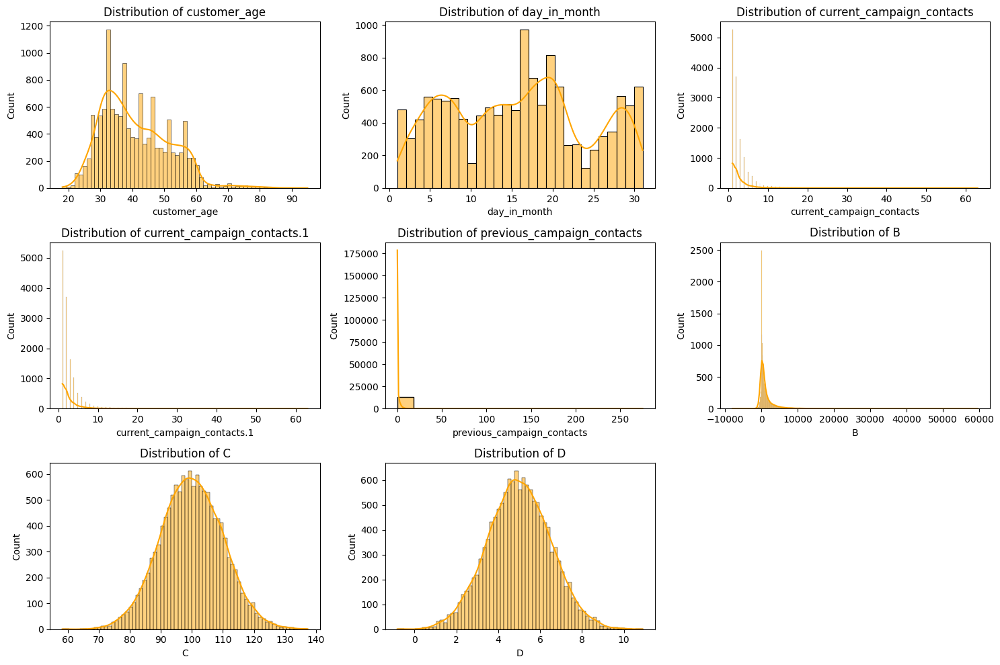

In [12]:
# Plotting the histograms / distributions of each of the numerical features:
plt.figure(figsize=(15, 10))
for i, feature in enumerate(df.select_dtypes(include=['float64', 'int64']).columns):
    plt.subplot(3, 3, i+1)
    sns.histplot(df[feature], kde=True, color='orange')
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

**Distribution Analysis of Numerical Features:**

The histograms above provide insights into the distribution of various numerical features in the dataset:

- **customer_age**: Positively skewed distribution with most customers aged between 30 and 50.
- **day_in_month**: Fairly uniform distribution, indicating customer interactions are spread throughout the month.
- **current_campaign_contacts** and **current_campaign_contacts.1**: Extreme tail to the right in both distributions. Positively skewed with most customers having fewer contacts, but some having significantly more.
- **previous_campaign_contacts**: Highly skewed to the right with most customers having no previous contacts.
- **B**: Highly skewed to the right with some extreme values, indicating the presence of outliers.
- **C** and **D**: Approximately normally distributed, with `C` having a mean around 100 and `D` around 5.

This distribution analysis highlights the need for handling skewness and outliers during data preprocessing to improve model performance.

#### Distribution of categorical Features

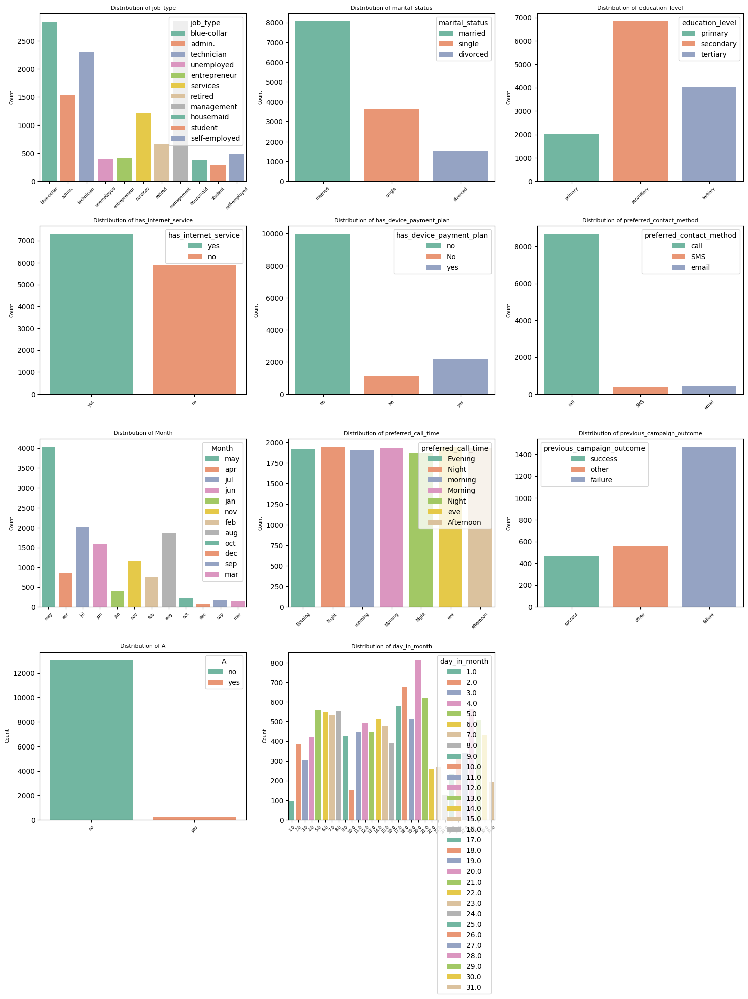

In [13]:
# Ensure all categorical features exist in the dataframe
existing_categorical_features = [feature for feature in categorical_features if feature in df.columns]

if existing_categorical_features:  # Proceed only if there are existing categorical features
    num_features = len(existing_categorical_features)
    num_cols = 3  # Number of columns
    num_rows = (num_features // num_cols) + (1 if num_features % num_cols != 0 else 0)  # Calculate rows needed
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 5))  # Adjust figsize as needed

    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    for idx, feature in enumerate(existing_categorical_features):
        sns.countplot(data=df, x=feature, ax=axes[idx], hue=feature, palette='Set2')
        axes[idx].set_title(f'Distribution of {feature}', fontsize=8)
        axes[idx].set_xlabel('')
        axes[idx].set_ylabel('Count', fontsize=7)
        for tick in axes[idx].get_xticklabels():
            tick.set_rotation(45)
            tick.set_fontsize(6)

    # Hide any remaining empty subplots
    for idx in range(len(existing_categorical_features), len(axes)):
        fig.delaxes(axes[idx])

    # Plotting the histograms / distributions of each of the categorical features:
    plt.tight_layout()
    plt.show()
else:
    print("No existing categorical features to plot.")


##### Summary of Plot Conclusions -

##### Job Type
- **Observation**: The majority of customers fall into the "blue-collar" job type, followed by "admin" and "technician".
- **Conclusion**: The distribution suggests a diverse customer base with a significant portion engaged in blue-collar jobs.

##### Marital Status
- **Observation**: Most customers are married, with a smaller number of single and divorced individuals.
- **Conclusion**: The company predominantly interacts with married individuals, potentially indicating a target demographic.

##### Education Level
- **Observation**: Secondary education is the most common among customers, followed by tertiary and primary education.
- **Conclusion**: Customers are generally well-educated, which might influence their decision-making and preferences for services.

##### Internet Service
- **Observation**: A majority of customers have an internet service subscription.
- **Conclusion**: Internet service is a prevalent feature among customers, indicating its importance in service offerings.

##### Device Payment Plan
- **Observation**: Most customers do not have a device payment plan.
- **Conclusion**: The lack of device payment plans could suggest an opportunity for promoting such plans to customers.

##### Preferred Contact Method
- **Observation**: The preferred contact method is predominantly "call", with "SMS" and "email" being less common.
- **Conclusion**: Phone calls are the most effective way to reach customers, guiding communication strategy.

##### Month
- **Observation**: The distribution of contacts across months shows peaks in May, July, and August.
- **Conclusion**: Certain months see higher customer interactions, possibly due to seasonal campaigns or customer behavior patterns.

##### Preferred Call Time
- **Observation**: Preferred call times are evenly distributed across "Evening", "Morning", and "Night".
- **Conclusion**: Flexibility in call times is necessary to accommodate customer preferences.

##### Previous Campaign Outcome
- **Observation**: Outcomes from previous campaigns are mostly "failure" with fewer "success" and "other" outcomes.
- **Conclusion**: The effectiveness of past campaigns has been limited, suggesting the need for strategy improvement.

##### Column A
- **Observation**: The distribution shows a dominant "no" with a small proportion of "yes".
- **Conclusion**: The binary feature A might have a specific, though less frequent, impact on the target variable.

##### Day in Month
- **Observation**: Interactions are spread throughout the month, with days in the approximate range of 17 to 21 showing extreme peaks.
- **Conclusion**: Customer interactions are consistent across different days of the month, indicating a certain strong day-based pattern, towards the beginning of the end of the month.


#### Distribution of target feature

C:\Users\yuval\AppData\Local\Temp\ipykernel_27416\796170858.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=feature, ax=axes[idx], palette='Set2')


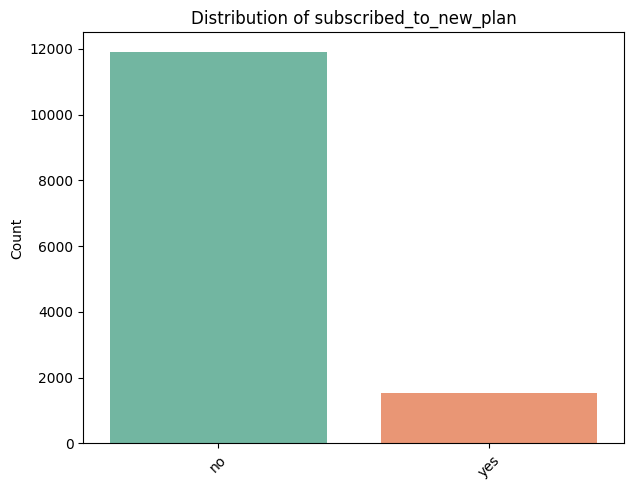

In [14]:
# List of specific columns to visualize - the target variable:
# Since the target variable is a special one among the categorical variables, we decided to visualize it separately:
specific_columns = ['subscribed_to_new_plan']

# Ensure the specific columns exist in the dataframe
existing_specific_columns = [col for col in specific_columns if col in df.columns]

if existing_specific_columns:  # Proceed only if there are existing columns
    num_columns = len(existing_specific_columns)
    num_cols = 2  # Number of columns for the subplots
    num_rows = (num_columns // num_cols) + (1 if num_columns % num_cols != 0 else 0)  # Calculate rows needed
    
    # Create subplots with proper dimensions
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, num_rows * 5))
    
    # Ensure axes is always iterable
    if num_rows == 1 and num_cols == 1:
        axes = [axes]
    elif num_rows == 1 or num_cols == 1:
        axes = list(axes)
    else:
        axes = axes.flatten()
    
    for idx, feature in enumerate(existing_specific_columns):
        if idx < len(axes):
            # Plot the marginal distribution without hue
            sns.countplot(data=df, x=feature, ax=axes[idx], palette='Set2')
            axes[idx].set_title(f'Distribution of {feature}', fontsize=12)
            axes[idx].set_xlabel('')
            axes[idx].set_ylabel('Count', fontsize=10)
            for tick in axes[idx].get_xticklabels():
                tick.set_rotation(45)
                tick.set_fontsize(10)
        else:
            # Hide any extra subplots if there are more axes than features
            fig.delaxes(axes[idx])
    
    # Hide any remaining empty subplots
    for idx in range(len(existing_specific_columns), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()
else:
    print("No specific columns to plot.")

##### Distribution of `subscribed_to_new_plan' 


##### Observation:
The bar plot displays the distribution of the `subscribed_to_new_plan` variable. It shows a significant imbalance in the data:
- A large majority of customers (approximately 12,000) did not subscribe to the new plan.
- A smaller proportion of customers (around 2,000) did subscribe to the new plan.

##### Conclusion:
- **Imbalance in the Target Variable**: The plot indicates that there is a significant class imbalance in the target variable. This is an important observation because it can affect the performance of machine learning models. Models trained on imbalanced data may become biased towards the majority class, leading to poor performance on the minority class.
- **Model Considerations**: To address this imbalance, techniques such as resampling (oversampling the minority class or undersampling the majority class), using different evaluation metrics (such as precision, recall, F1-score), or applying algorithms that are robust to class imbalance (such as balanced random forests or adaptive boosting) should be considered.
- **Strategic Insights**: From a business perspective, understanding the reasons behind the low subscription rate can help in formulating strategies to improve customer conversion rates for the new plan.

By acknowledging and addressing this imbalance, we can build more effective and fair predictive models.


##### Overall Insights:
- **Customer Characteristics**: Predominantly married, secondary education, blue-collar/admin jobs, prefer phone contact.
- **Campaign Performance**: Largely unsuccessful previous campaigns.
- **Subscription Patterns**: Low subscription to new plans.
- The visualizations highlight key demographic and behavioral traits of the customer base.
- Understanding these patterns helps in tailoring marketing strategies, improving customer engagement, and enhancing campaign effectiveness.
- Flexibility in contact methods and times, along with a focus on improving campaign outcomes, can significantly benefit customer outreach programs.

By analyzing these distributions, we can derive actionable insights to optimize marketing efforts and better meet customer needs.

**Trivial Value Conversions in certain columns:**
* **Device Payment Plan**: We decided that rows with the value "No" should be converted to "no" instead. Both values practically mean the same therefore keeping them "disunited" would hinder our ability to draw meaningful conclusions.
* **Preferred Call Time**: We decided that rows with the value "eve" or "evening" should be converted to "Evening" instead, as well as "morning" to "Morning" and "Night " to "Night". Both values practically mean the same therefore keeping them "disunited" would hinder our ability to draw meaningful conclusions.

#### Correcting 'preferred_call_time'

In [12]:
# Checking for unique values in preferred_call_time - in order to show the value-redundancy:
print(df["preferred_call_time"].unique())

['Evening' 'Night ' 'morning' 'Morning' 'Night' 'eve' 'Afternoon' nan]


The objective of this code is to correct inconsistencies in the values of the `preferred_call_time` and `has_device_payment_plan` columns to ensure uniformity and avoid redundant categories.

In [13]:
# Transform 'eve' to 'Evening' in the 'preferred_call_time' column
df['preferred_call_time'] = df['preferred_call_time'].replace('eve', 'Evening')
# Transform 'evening' to 'Evening' in the 'preferred_call_time' column
df['preferred_call_time'] = df['preferred_call_time'].replace('evening', 'Evening') # (otherwise we'd see "evening" & "Evening")
# Transform 'morning' to 'Morning' in the 'preferred_call_time' column
df['preferred_call_time'] = df['preferred_call_time'].replace('morning', 'Morning')
# Transform 'Night ' to 'Night' in the 'preferred_call_time' column
df['preferred_call_time'] = df['preferred_call_time'].replace('Night ', 'Night')
# Transform 'No' to 'no' in the 'has_device_payment_plan' column
df['has_device_payment_plan'] = df['has_device_payment_plan'].replace('No', 'no')

**Visualizing the Conversions:**

C:\Users\yuval\AppData\Local\Temp\ipykernel_27416\3190470335.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=feature, ax=axes[idx], palette='Set2')
C:\Users\yuval\AppData\Local\Temp\ipykernel_27416\3190470335.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=feature, ax=axes[idx], palette='Set2')


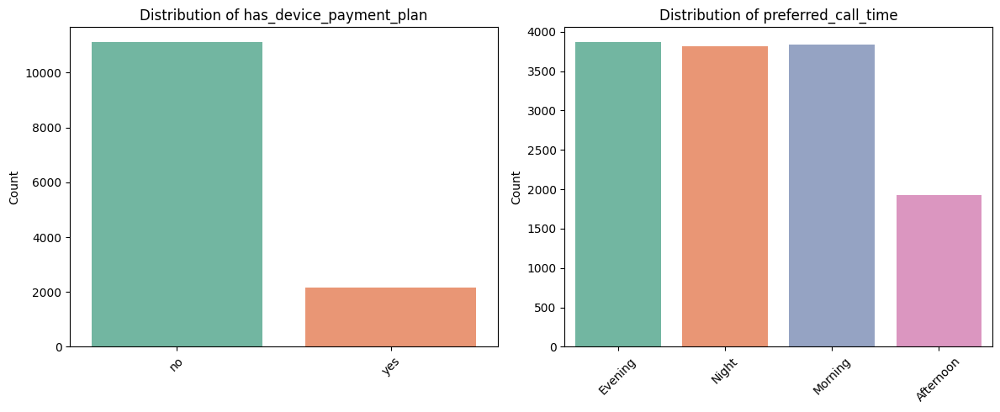

In [17]:
# List of specific columns to visualize
specific_columns = ['has_device_payment_plan', 'preferred_call_time']

# Ensure the specific columns exist in the dataframe
existing_specific_columns = [col for col in specific_columns if col in df.columns]

if existing_specific_columns:  # Proceed only if there are existing columns
    num_columns = len(existing_specific_columns)
    num_cols = 2  # Number of columns for the subplots
    num_rows = (num_columns // num_cols) + (1 if num_columns % num_cols != 0 else 0)  # Calculate rows needed
    
    # Create subplots with proper dimensions
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, num_rows * 5))
    
    # Ensure axes is always iterable
    if num_rows == 1 and num_cols == 1:
        axes = [axes]
    elif num_rows == 1 or num_cols == 1:
        axes = list(axes)
    else:
        axes = axes.flatten()
    
    for idx, feature in enumerate(existing_specific_columns):
        if idx < len(axes):
            # Plot the marginal distribution without hue
            sns.countplot(data=df, x=feature, ax=axes[idx], palette='Set2')
            axes[idx].set_title(f'Distribution of {feature}', fontsize=12)
            axes[idx].set_xlabel('')
            axes[idx].set_ylabel('Count', fontsize=10)
            for tick in axes[idx].get_xticklabels():
                tick.set_rotation(45)
                tick.set_fontsize(10)
        else:
            # Hide any extra subplots if there are more axes than features
            fig.delaxes(axes[idx])
    
    # Hide any remaining empty subplots
    for idx in range(len(existing_specific_columns), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()
else:
    print("No specific columns to plot.")

**Observations (Dataset with Upgraded Features):**
* **Device Payment Plan:** Predominantly "no", with a sizable "yes" minority.
* **Preferred Call Time:** The distribution among "Morning", "Evening" & "Night" times is uniform, with slightly less values for "Afternoon".

#### Correlation Analysis


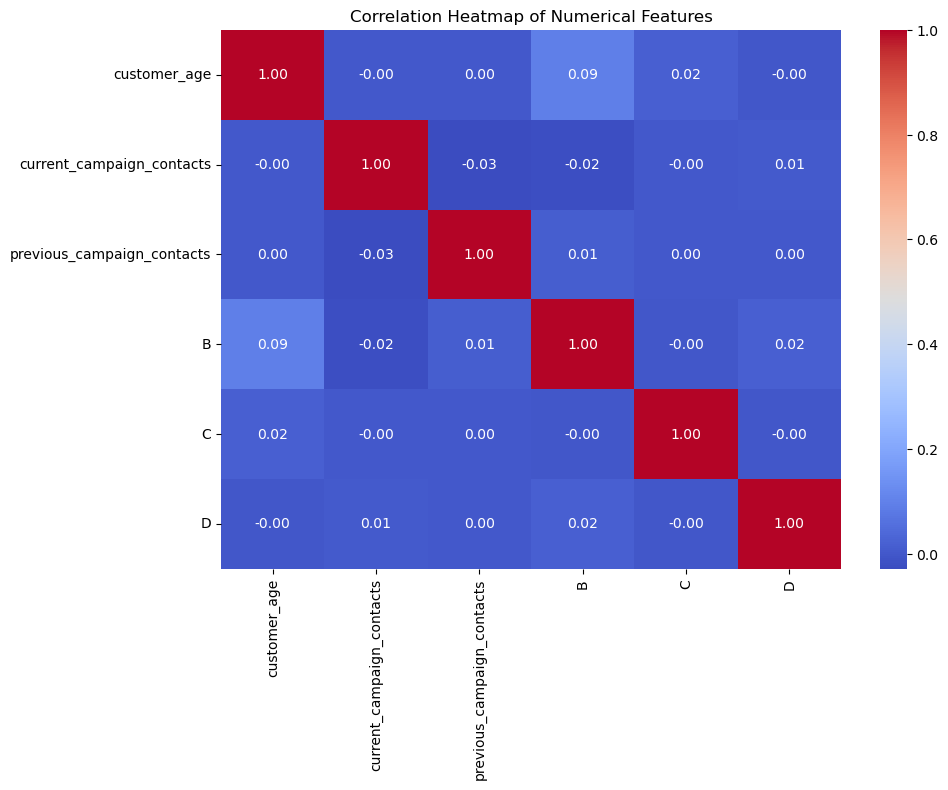

In [14]:
# Calculate correlations for numerical features only
correlation_matrix = df[numerical_features].corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

**Conclusion from the correlation matrix for numerical variables:**

All correlations appear incredibly low (close to 0 in absolute value), which means the numerical features are largely uncorrelated between one-another. However, none of the correlations are actually negative.

**Correlation Heatmap for Categorical Variables:**

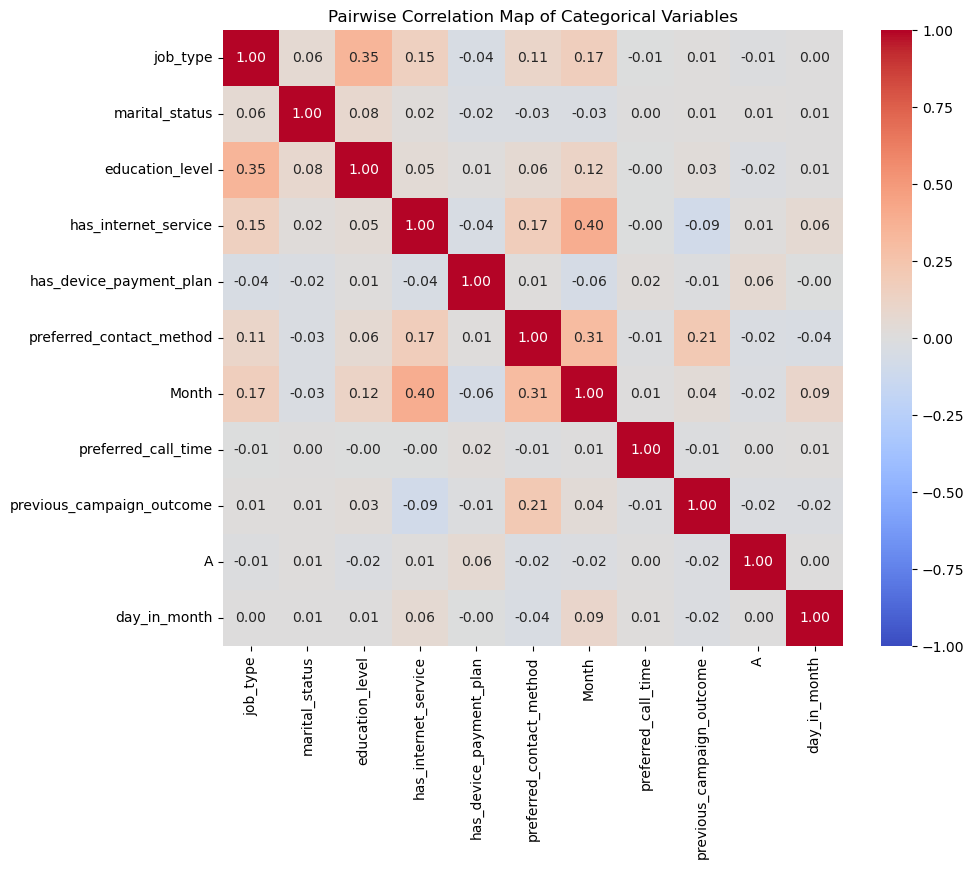

In [15]:
# Ensure the specified categorical features exist in the DataFrame
categorical_features = [col for col in categorical_features if col in df.columns]

# Factorize categorical variables to convert them into numerical values
cat_data = df[categorical_features].apply(lambda x: pd.factorize(x)[0])

# Compute the correlation matrix
correlation_matrix = cat_data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0)
plt.title('Pairwise Correlation Map of Categorical Variables')
plt.show()

**Conclusion from the correlation matrix for categorical variables:**

Most correlations between categorical features appear incredibly low (close to 0 in absolute value) which means most categorical features are largely uncorrelated between one-another. Furthermore, all correlations are non negative, indicating that none of the categorical variables have any negative correlation between one-another. But unlike the correlation matrix for numerical features, some of the categorical variables don't have an incredibly low correlation between one another either. For example - internet service & month, as well as preferred contact method & month and job type & education level. All of them have correlation values around 0.3-0.4, which isn't high at all, but not incredibly low in absolute value either (the correlations are all positive as well).

#### Relationship with Target

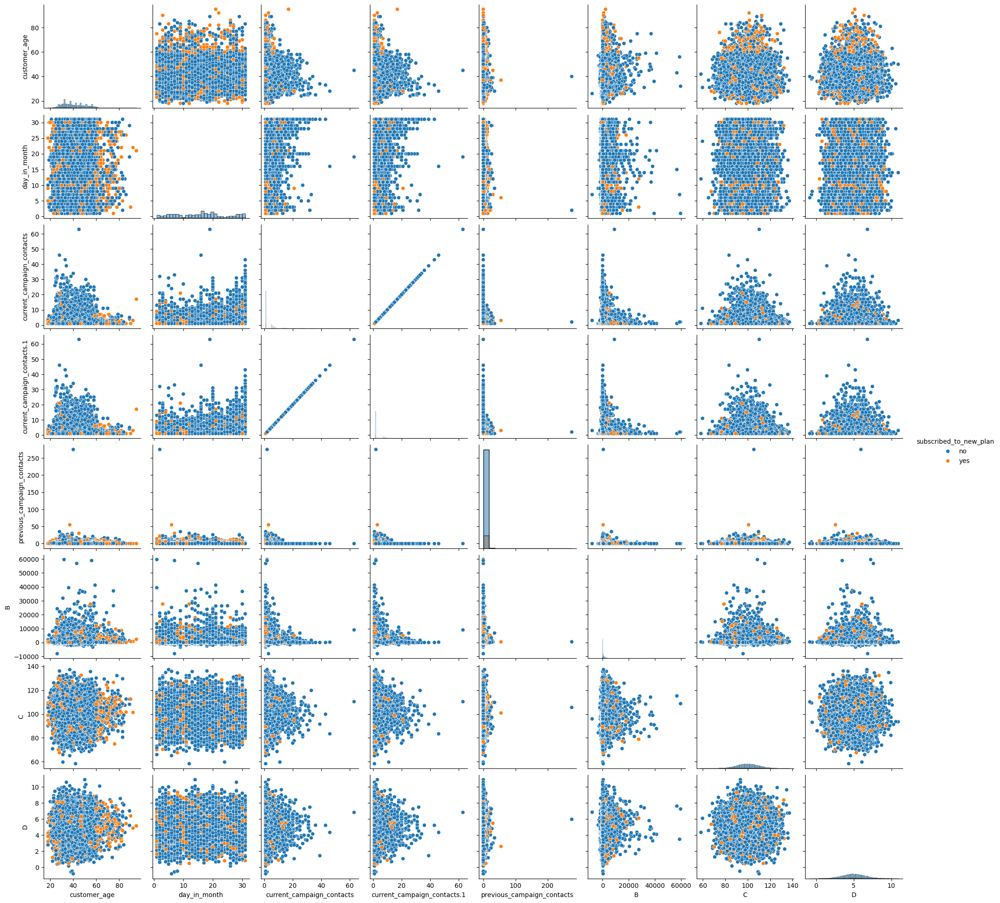

In [20]:
sns.pairplot(df, hue='subscribed_to_new_plan', diag_kind='hist')
plt.show()

**Pairplot Analysis:**

The pairplot visualizes the relationships between features and their correlation with the target variable (`subscribed_to_new_plan`):

- **customer_age**: Some concentration of subscriptions among middle-aged customers.
- **day_in_month**: No significant pattern observed with the target variable.
- **current_campaign_contacts**: Higher contacts in the current campaign seem to correlate with higher subscriptions.
- **previous_campaign_contacts**: Most customers have low previous contacts, with no clear pattern to the target variable.
- **B, C, D**: These features show high variability but no distinct pattern with subscriptions.


Overall, the pairplot helps identify features like `current_campaign_contacts` that may influence the subscription decision, while others show no clear relationship.

**Conditional Distribution of Subscription to New Plan (given the independent features):**

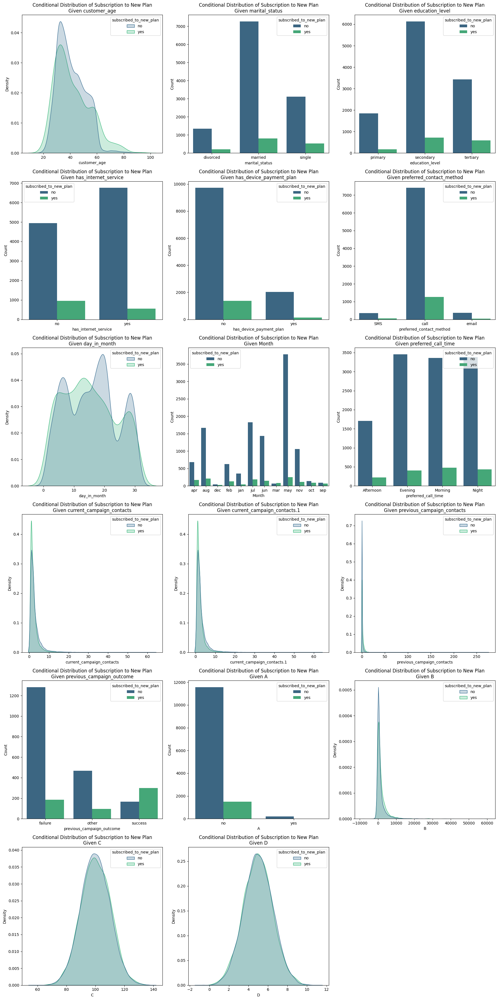

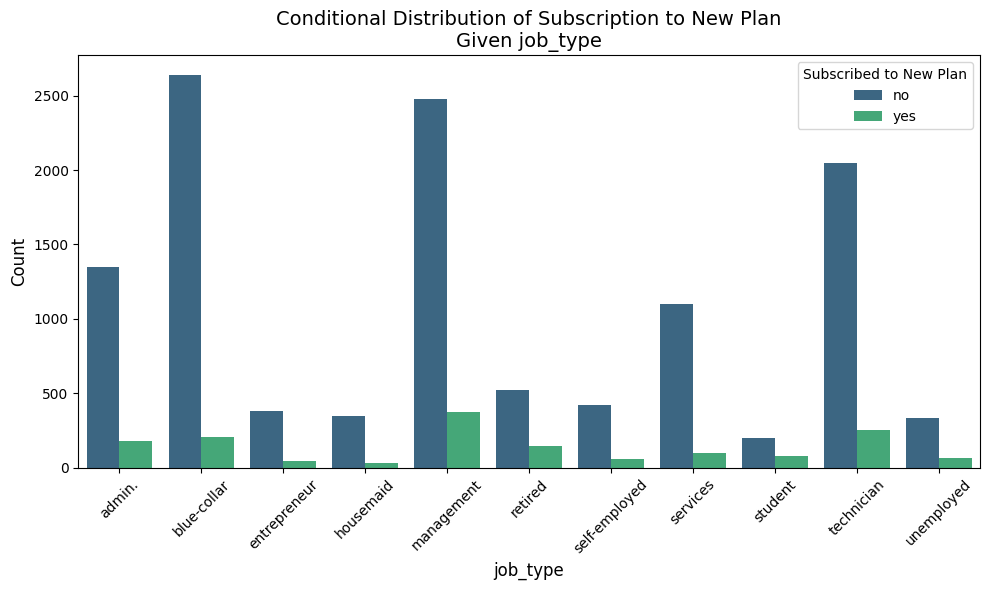

In [21]:
# List of features in the dataset (excluding the target variable)
all_features = df.columns.drop('subscribed_to_new_plan')
features_to_plot = all_features[all_features != 'job_type']
job_type_feature = 'job_type'

# Define the number of plots per row for the general features
plots_per_row = 3

# Calculate the number of rows needed for the general features
num_rows = len(features_to_plot) // plots_per_row + int(len(features_to_plot) % plots_per_row != 0)

# Create subplots for all features except "job_type"
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(18, num_rows * 6))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Loop through each feature (except "job_type") and create a plot
for idx, feature in enumerate(features_to_plot):
    ax = axes[idx]
    
    # Check if the feature is categorical or numerical
    if df[feature].dtype == 'object':
        # Group by feature and subscribed_to_new_plan, and count the occurrences
        groups = df.groupby([feature, 'subscribed_to_new_plan']).size().reset_index(name='count')
        
        # Create the bar plot for categorical features
        sns.barplot(x=feature, y='count', data=groups, hue='subscribed_to_new_plan', palette='viridis', ax=ax)
        ax.set_xlabel(feature)
    else:
        # Create a KDE plot for numerical features
        sns.kdeplot(data=df, x=feature, hue='subscribed_to_new_plan', common_norm=False, palette='viridis', fill=True, ax=ax)
        ax.set_xlabel(feature)
        
    # Adding title and labels
    ax.set_title(f'Conditional Distribution of Subscription to New Plan\nGiven {feature}')
    ax.set_ylabel('Density' if df[feature].dtype != 'object' else 'Count')

# Remove any unused subplots
for idx in range(len(features_to_plot), len(axes)):
    fig.delaxes(axes[idx])

# Adjust layout for all features except "job_type"
plt.tight_layout()
plt.show()

# Plot for "job_type" separately
if job_type_feature in df.columns:
    plt.figure(figsize=(10, 6))
    groups = df.groupby([job_type_feature, 'subscribed_to_new_plan']).size().reset_index(name='count')
    sns.barplot(x=job_type_feature, y='count', data=groups, hue='subscribed_to_new_plan', palette='viridis')
    plt.title(f'Conditional Distribution of Subscription to New Plan\nGiven {job_type_feature}', fontsize=14)
    plt.xlabel(job_type_feature, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45)
    plt.legend(title='Subscribed to New Plan', fontsize=10, loc='best')
    plt.tight_layout()
    plt.show()
else:
    print(f"{job_type_feature} is not in the DataFrame.")


**Conclusions from Observations:**
* **Marital Status, Preferred Call Time, Job Type, Device Payment Plan, A, C, D:** Conditional Distributions look largely the same (whether these are categorical variables - the conditional distributions look largely the same in all groups - the ratio between "yes" & "no" is largely preserved among all of them, or numerical variables, in which the conditional distributions seem to overlap).
* **B, Previous Campaign Contacts:** Right tail, "no" values have a larger peak at the peak of the conditional distributions.
* **Current Campaign Contacts:** Right tail, "yes" values have a larger peak at the peak of the conditional distributions.
* **Day in Month:** For both groups ("yes" & "no"), the conditional distributions have 3 peaks. the left & right peaks largely seem to generally overlap but not entirely. The middle peak seems different - that peak leans more to the left for "yes" values than for "no" values.
* **Age:** There seems to be a general overlap, however, for "yes" values there's a larger tail to the right than for "no" values.
* **Device Payment Plan:** We can see that in each group of Device Payment Plan (yes & no), the majority didn't subscribe to the new plan. However, in the "no" group, the gaps aren't quite as extreme as in the "yes" group.
* **Month:** We can see that in most months (except for March & December), the majority didn't subscribe to the new plan. However, in certain months (like May), the ratio between "yes" and "no" is much more extreme than in other months (in favor of "no" - much more "no" than "yes").
* **Edcuation Level:** We can see that no matter which education level people in the dataset got, the majority in each group didn't subscribe to the new plan. However, in the secondary education group, the ratio between "yes" & "no" is more extreme than the ratios in the other groups.
* **Internet Service:** We can see that whether people have / don't have internet service, the majority in each group didn't subscribe to the new plan. However, among people who don't have internet service, the ratio between "yes" & "no" is less extreme than the ratio among people who do have internet service.
* **Preferred Contact Method:** We can see that among all groups, the majority in each group didn't subscribe to the new plan. However, we have so little people who prefer SMS & email as a contact method, so it's a little difficult to determine the ratio between "yes" & "no" there.
* **Interesting conclusions - Previous Campaign Outcome:** We can see that unlike other features, in the "success" group, there are more people who subscribed to the new plan than those who didn't. Furthermore. the ratio between Yes & No in the "Other" group is different from that ratio in the "failure" group.

Overall, using conditional distributions, we wanted to check not only how does the subscription to new plan looks like generally, but rather, how is it distributed among different groups of different features. So then we could see the possible impact / correlation between the independent variables & dependent variable. For most features, all groups overwhelmingly didn't subscribe to the new plan. However, looking at the data from the previous campaign results, there's a notable change - the majority of those whose previous campaign succeeded on them, subscribed to the new plan!

# Part Two: Pre-processing

### Combine the `current_campaign_contacts` and `current_campaign_contacts.1`

In [14]:
df[(df["current_campaign_contacts"] != df["current_campaign_contacts.1"])] 

,customer_age,job_type,marital_status,education_level,has_internet_service,has_device_payment_plan,preferred_contact_method,day_in_month,Month,preferred_call_time,current_campaign_contacts,current_campaign_contacts.1,previous_campaign_contacts,previous_campaign_outcome,A,B,C,D,subscribed_to_new_plan
1432,46.0,services,married,NaN,yes,yes,call,15.0,NaN,Evening,NaN,3.0,0.0,NaN,no,311.0,101.607283,5.985898,no
3912,NaN,blue-collar,married,tertiary,yes,NaN,call,20.0,apr,Morning,2.0,NaN,0.0,NaN,no,1993.0,87.128798,4.853926,no
5872,34.0,management,married,NaN,no,no,call,22.0,jul,Evening,2.0,NaN,0.0,NaN,no,0.0,93.857895,6.578585,no
6888,40.0,unemployed,married,secondary,yes,no,NaN,5.0,jun,Night,7.0,NaN,0.0,NaN,NaN,1779.0,103.193589,5.015301,no
9355,30.0,blue-collar,single,secondary,yes,no,NaN,14.0,may,Afternoon,1.0,NaN,0.0,NaN,no,609.0,115.271806,NaN,no
10618,44.0,blue-collar,married,primary,yes,NaN,call,NaN,apr,Morning,1.0,NaN,1.0,failure,no,612.0,111.078527,NaN,no


Duplicate Columns: The columns `current_campaign_contacts` and `current_campaign_contacts.1` appear to contain duplicate information with some discrepancies.

In [15]:
def replace_null_values(df, primary_col, secondary_col):
    """
    Replaces NaN values in `primary_col` with non-NaN values from `secondary_col`
    where the two columns have differing values.

    Args:
    df (pd.DataFrame): The input DataFrame.
    primary_col (str): The name of the primary column (e.g., 'current_campaign_contacts').
    secondary_col (str): The name of the secondary column (e.g., 'current_campaign_contacts.1').

    Returns:
    pd.DataFrame: DataFrame with NaN values replaced in the primary column.
    """
    # Check where the values in the two columns are not equal
    condition = df[primary_col] != df[secondary_col]

    # Replace NaN values in the primary column with values from the secondary column
    df.loc[condition & df[primary_col].isnull(), primary_col] = df.loc[condition, secondary_col]
    
    return df

# Usage example
df = replace_null_values(df, "current_campaign_contacts", "current_campaign_contacts.1")

In [16]:
df[(df["current_campaign_contacts"] != df["current_campaign_contacts.1"])] 

,customer_age,job_type,marital_status,education_level,has_internet_service,has_device_payment_plan,preferred_contact_method,day_in_month,Month,preferred_call_time,current_campaign_contacts,current_campaign_contacts.1,previous_campaign_contacts,previous_campaign_outcome,A,B,C,D,subscribed_to_new_plan
3912,NaN,blue-collar,married,tertiary,yes,NaN,call,20.0,apr,Morning,2.0,NaN,0.0,NaN,no,1993.0,87.128798,4.853926,no
5872,34.0,management,married,NaN,no,no,call,22.0,jul,Evening,2.0,NaN,0.0,NaN,no,0.0,93.857895,6.578585,no
6888,40.0,unemployed,married,secondary,yes,no,NaN,5.0,jun,Night,7.0,NaN,0.0,NaN,NaN,1779.0,103.193589,5.015301,no
9355,30.0,blue-collar,single,secondary,yes,no,NaN,14.0,may,Afternoon,1.0,NaN,0.0,NaN,no,609.0,115.271806,NaN,no
10618,44.0,blue-collar,married,primary,yes,NaN,call,NaN,apr,Morning,1.0,NaN,1.0,failure,no,612.0,111.078527,NaN,no


In [17]:
# Combine the two columns
df.drop(columns=['current_campaign_contacts.1'], inplace=True)

### Handling Missing Values

#### Heatmap of Missing Values:

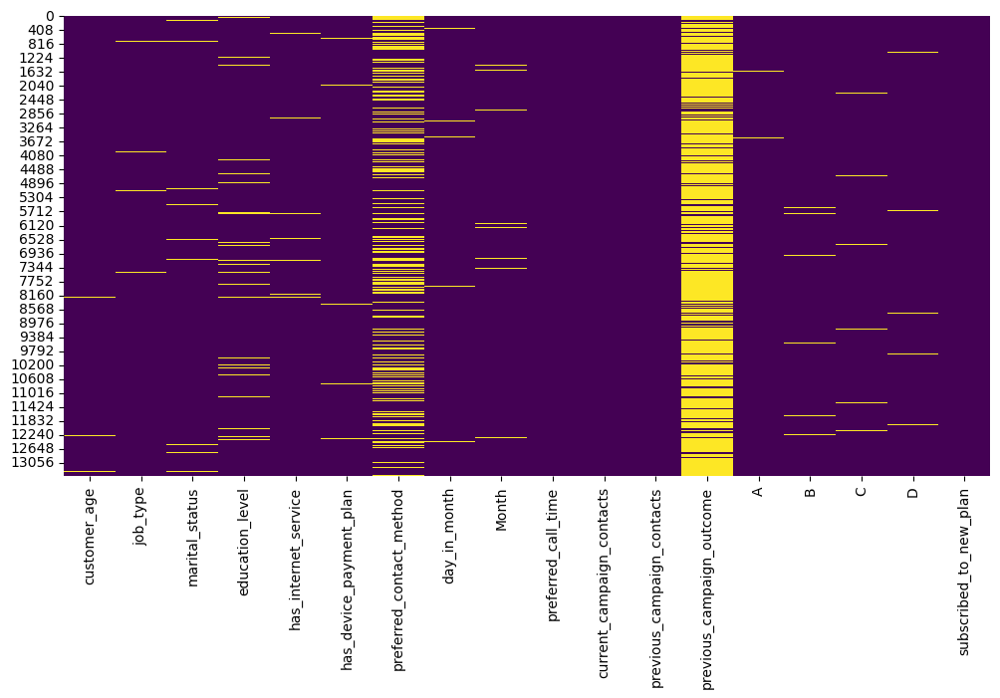

In [20]:
# Creating the heatmap for missing values:
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
# Plotting it:
plt.show()

We can see that columns such as previous_campaign_outcome has a majority of yellow rows (which means missing values) and preferred_contact_method has a sizable minority of yellow rows. We'll dive deeper into that in the preprocessing part.

#### Columns with Nulls

In [18]:
# Check for columns with null values
columns_with_nulls = df.columns[df.isnull().any()]
# Get a summary of columns with their corresponding number of null values
null_values_summary = df[columns_with_nulls].isnull().sum()
null_values_summary

customer_age                    150
job_type                         95
marital_status                  197
education_level                 582
has_internet_service            235
has_device_payment_plan         179
preferred_contact_method       3930
day_in_month                    260
Month                           175
preferred_call_time               2
previous_campaign_contacts        4
previous_campaign_outcome     10954
A                               155
B                               170
C                               151
D                               159
dtype: int64

Columns like previous_campaign_outcome, preferred_contact_method, and education_level have a significant number of missing values.

#### Dropping 'previous_campaign_outcome'

In [19]:
df['previous_campaign_outcome'].isnull().sum()/df.shape[0]*100

81.44237918215613

Approximately 81.45% of the values in the previous_campaign_outcome column are null.
This high percentage indicates that the majority of the entries in this column are missing, which can significantly impact the analysis and modeling process.
Given the high proportion of missing data we decided to exclude this column from the analysis to maintain data quality and model reliability.

In [20]:
# Dropping the `previous_campaign_outcome` column
df.drop(columns=['previous_campaign_outcome'], inplace=True)

# Verifying the column has been dropped
print(df.columns)


Index(['customer_age', 'job_type', 'marital_status', 'education_level',
       'has_internet_service', 'has_device_payment_plan',
       'preferred_contact_method', 'day_in_month', 'Month',
       'preferred_call_time', 'current_campaign_contacts',
       'previous_campaign_contacts', 'A', 'B', 'C', 'D',
       'subscribed_to_new_plan'],
      dtype='object')


**Setting the lists without 'previous_campaign_outcome':**

In [21]:
numerical_features = [ 'customer_age', 'current_campaign_contacts', 'previous_campaign_contacts', 'B', 'C', 'D']
categorical_features = ['job_type', 'marital_status', 'education_level', 
                        'has_internet_service', 'has_device_payment_plan', 
                        'preferred_contact_method', 'Month', 'preferred_call_time', 'A','day_in_month']

#### Distribution of the features (Normal):

In [22]:
flag = False
for feature in numerical_features:
    if stats.shapiro(df[feature])[1] > 0.05:  # If the distribution is normal
        print(feature)
        flag = True
if flag == False:
    print("There is no Normal distributed features")

customer_age
previous_campaign_contacts
B
C
D


C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


#### Imputing Nulls (Replacing with Mode for Categorical Variables): 

In [23]:
# Imputing missing values in categorical columns with the most frequent strategy
modes_dict = {}
for col in categorical_features:
    mode_value = df[col].mode()[0]
    df[col].fillna(mode_value, inplace=True)
    modes_dict[col] = mode_value

C:\Users\user\AppData\Local\Temp\ipykernel_7484\3114156981.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mode_value, inplace=True)


We chose swapping the nulls with the mode of each column because it's very simple, straightforward, and commonplace. It also maintains certain specific characteristics of the distribution. The mode of the new distribution is quite trivially maintained.

**Scaling before KNN-Imputing (Distance based model):**

Scaling the features is necessary here, since the KNN-Imputer is a distance based model and relies on scaled data.

In [24]:
# Initialize the scaler
scaler = RobustScaler()

# Apply the scaler to the numerical features
scaled_numerical_features = scaler.fit_transform(df[numerical_features])

In [25]:
# Create a copy of the dataframe and remove rows with missing values in numerical features
df1 = df.copy()
df1[numerical_features] = scaled_numerical_features
df1.dropna(subset=numerical_features, inplace=True)

In [26]:
# Function to find optimal k for KNN imputation
def find_optimal_k(df, numerical_cols):
    best_k = None
    lowest_mse = float('inf')
    
    # Drop rows with NaNs in the original data for fair comparison
    df_original_nonan = df.dropna(subset=numerical_cols).copy()

    for k in range(2, 11):  # Start from k=2 to avoid the trivial case of k=1
        imputer = KNNImputer(n_neighbors=k)
        
        # Apply KNN imputation on the dataset
        df_imputed = df.copy()
        df_imputed[numerical_cols] = imputer.fit_transform(df_imputed[numerical_cols])
        
        # Calculate MSE only on the non-NaN subset for fair comparison
        mse = mean_squared_error(df_original_nonan[numerical_cols], df_imputed.loc[df_original_nonan.index, numerical_cols])
        
        if mse < lowest_mse:
            lowest_mse = mse
            best_k = k
    
    return best_k

# Find optimal k for numerical columns
best_k = find_optimal_k(df1, numerical_features)
print(f"Optimal k for KNN imputation: {best_k}")

# Apply KNN imputation with optimal k to numerical columns
imputer = KNNImputer(n_neighbors=best_k)
imputed_numerical_features = imputer.fit_transform(scaled_numerical_features)

# Ensure no NaNs remain after imputation
if np.isnan(imputed_numerical_features).sum() > 0:
    print("There are still NaN values in the numerical columns after KNN imputation.")
else:
    print("No NaNs remaining in the numerical columns after KNN imputation.")

# Inverse transform to revert the scaling
reverted_numerical_features = scaler.inverse_transform(imputed_numerical_features)

# Replace the imputed and reverted numerical features back into the dataframe
df[numerical_features] = reverted_numerical_features

Optimal k for KNN imputation: 2
No NaNs remaining in the numerical columns after KNN imputation.


### Handling Outliers

#### Outlier Detection

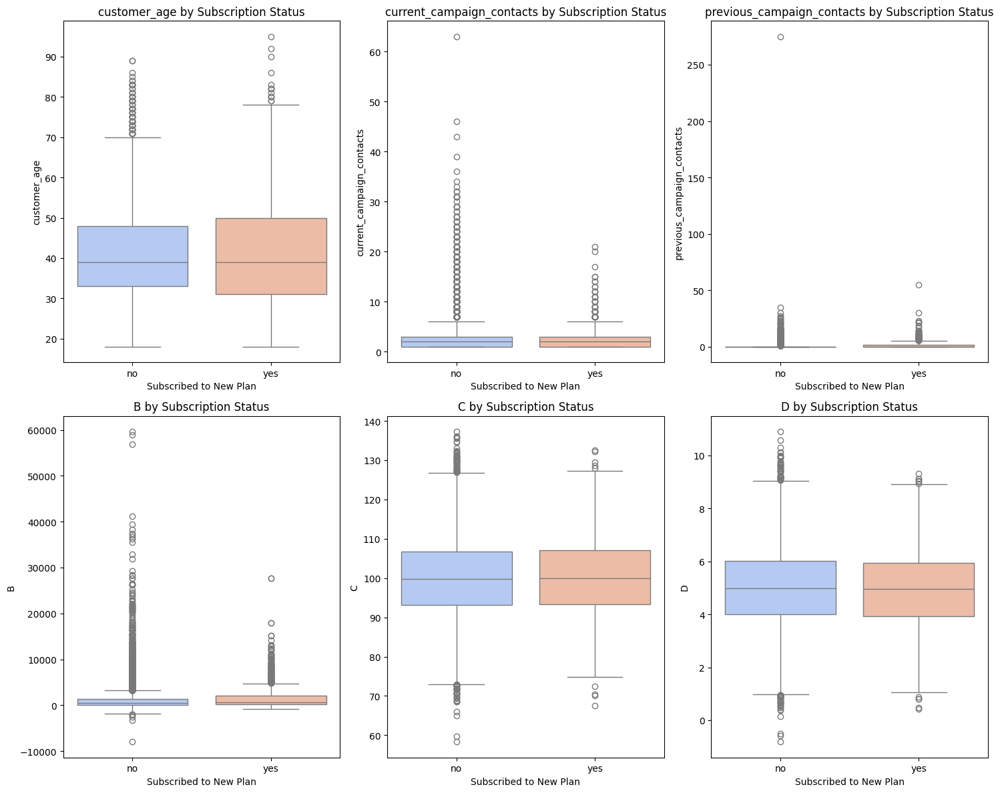

In [37]:
# Number of numerical features
num_features = len(numerical_features)

# Calculate number of rows and columns for the subplot grid
nrows = (num_features + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 12))

# Flatten axes for easy indexing
axes = axes.flatten()

for idx, feature in enumerate(numerical_features):
    sns.boxplot(data=df, x='subscribed_to_new_plan', y=feature, ax=axes[idx], hue='subscribed_to_new_plan', palette='coolwarm')
    axes[idx].set_title(f'{feature} by Subscription Status')
    axes[idx].set_xlabel('Subscribed to New Plan')
    axes[idx].set_ylabel(feature)

# Hide any empty subplots if the number of features is not a multiple of the number of columns
for idx in range(len(numerical_features), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()


Based on the boxplots of numerical features by subscription status, the following conclusions can be drawn for outlier removal:

- **Customer Age**:
  - Outliers are predominantly in the higher age range.
  - Removing extreme age outliers can help reduce noise in the data.

- **Current Campaign Contacts**:
  - Highly right-skewed with numerous outliers.
  - Removing extreme outliers can provide a more accurate representation of typical campaign contacts.

- **Previous Campaign Contacts**:
  - Highly right-skewed with many zero contacts and some significant outliers.
  - Removing extreme outliers will help in better understanding the impact of previous campaign contacts.

- **Feature B**:
  - Wide range with many extreme values.
  - Removing outliers can reduce variability and improve model performance.

- **Feature C**:
  - Some outliers, especially lower values.
  - Removing these outliers can help in better modeling.

- **Feature D**:
  - Somewhat normal distribution with slight skewness.
  - Outliers, particularly on the higher end, can be removed to improve data quality.


Removing outliers using the Interquartile Range (IQR) is a robust method that is less influenced by extreme values (there needs to be a change of at least 25% of the data in order to change the outlier detection in this algorithm) compared to other methods, such as the standard deviation method. This method is also non parametric - it's independent of the real parameters that define the distribution, as well as simple, applicable accross many domains, and straightforward.

Using the IQR method for outlier removal is an effective way to clean data by eliminating extreme values that could distort statistical analyses. and it's particularly useful in datasets with non-normal distributions and is less sensitive to outliers than other methods.

In [27]:
# Function to calculate IQR bounds
def calculate_iqr_bounds(df, feature):
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

# Function to calculate outliers using IQR bounds
def calculate_outliers(df, feature):
    lower_bound, upper_bound = calculate_iqr_bounds(df, feature)
    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]
    return outliers

In [28]:
# Dictionary to store outliers for each feature before removal
outliers_dict_before = {}

# Calculate outliers for each feature before removal
for feature in numerical_features:
    outliers_dict_before[feature] = calculate_outliers(df, feature)

# Combine all outliers into a single DataFrame before removal
combined_outliers_before = pd.concat(outliers_dict_before.values()).drop_duplicates().reset_index(drop=True)

# Display the combined outliers DataFrame before removal
print("Outliers before removal:")
print(combined_outliers_before)

Outliers before removal:
      customer_age       job_type marital_status education_level  \
0             75.0        retired       divorced         primary   
1             72.0        retired       divorced         primary   
2             76.0  self-employed        married       secondary   
3             78.0        retired        married         primary   
4             78.0        retired       divorced       secondary   
...            ...            ...            ...             ...   
4514          55.0        retired       divorced         primary   
4515          31.0    blue-collar        married       secondary   
4516          47.0     management        married         primary   
4517          35.0     technician        married       secondary   
4518          51.0     technician       divorced       secondary   

     has_internet_service has_device_payment_plan preferred_contact_method  \
0                     yes                      no                     call   
1 

#### Outlier Removal

In [29]:
# Function to remove outliers using IQR bounds
def remove_outliers(df, feature):
    lower_bound, upper_bound = calculate_iqr_bounds(df, feature)
    df_clean = df[(df[feature] >= lower_bound) & (df[feature] <= upper_bound)]
    return df_clean

In [30]:
# Remove outliers for each feature
for feature in numerical_features:
    df = remove_outliers(df, feature)

In [31]:
# Dictionary to store outliers for each feature after removal
outliers_dict_after = {}

# Recalculate and combine outliers to verify removal
for feature in numerical_features:
    outliers_dict_after[feature] = calculate_outliers(df, feature)

combined_outliers_after = pd.concat(outliers_dict_after.values()).drop_duplicates().reset_index(drop=True)

# Display the combined outliers DataFrame after removal
print("Outliers after removal:")
print(combined_outliers_after)

Outliers after removal:
     customer_age      job_type marital_status education_level  \
0            42.0   blue-collar        married         primary   
1            54.0  entrepreneur        married       secondary   
2            22.0       student         single       secondary   
3            32.0   blue-collar        married       secondary   
4            30.0  entrepreneur        married         primary   
..            ...           ...            ...             ...   
556          38.0    management        married        tertiary   
557          43.0    technician       divorced       secondary   
558          33.0    management        married        tertiary   
559          40.0      services        married       secondary   
560          55.0       retired       divorced       secondary   

    has_internet_service has_device_payment_plan preferred_contact_method  \
0                    yes                      no                     call   
1                     no     

**Visualizations After Removing Outliers:**

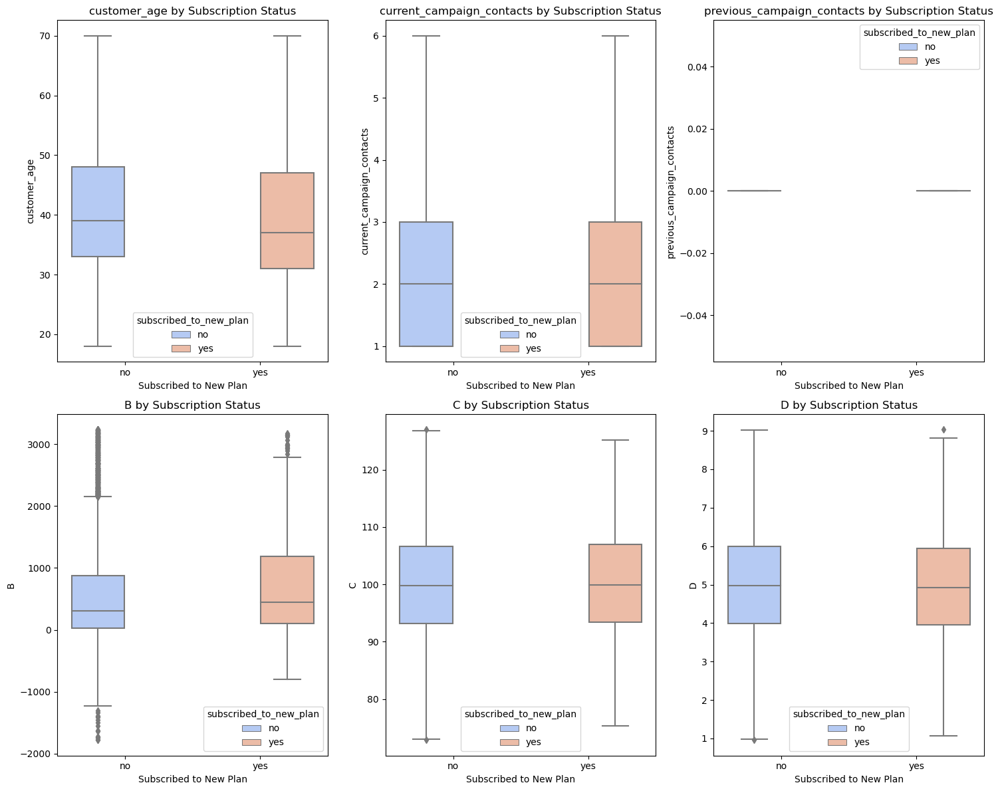

In [34]:
# Number of numerical features
num_features = len(numerical_features)

# Calculate number of rows and columns for the subplot grid
nrows = (num_features + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 12))

# Flatten axes for easy indexing
axes = axes.flatten()

for idx, feature in enumerate(numerical_features):
    sns.boxplot(data=df, x='subscribed_to_new_plan', y=feature, ax=axes[idx], hue='subscribed_to_new_plan', palette='coolwarm')
    axes[idx].set_title(f'{feature} by Subscription Status')
    axes[idx].set_xlabel('Subscribed to New Plan')
    axes[idx].set_ylabel(feature)

# Hide any empty subplots if the number of features is not a multiple of the number of columns
for idx in range(len(numerical_features), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()


Conclusions on Box Plot After Removing Outliers

The updated box plots provide a clearer view of the data distributions after outlier removal:

1. **Customer Age**:
   - Outliers in higher age ranges have been removed.
   - Distribution is now more compact with a clear range.
   - Slightly higher median age for subscribers remains.

2. **Current Campaign Contacts**:
   - Extreme values have been eliminated.
   - Distribution is now less skewed with a clearer range.
   - Subscribers tend to have fewer campaign contacts on average.

3. **Previous Campaign Contacts**:
   - Distribution is now highly concentrated around zero, indicating limited variation.
   - Majority of the data points show no previous campaign contacts.

4. **Feature B**:
   - Wide range with a more uniform distribution after removing extreme values.
   - The difference in medians is more pronounced, with subscribers having higher values.

5. **Feature C**:
   - Approximately normal distribution remains.
   - Outliers have been removed, resulting in a more compact range.
   - Higher median values for subscribers are more evident.

6. **Feature D**:
   - The distribution is now more normal with reduced skewness.
   - Outliers on the higher end have been removed, resulting in a clearer view of the range.
   - Slightly higher median values for subscribers.

**Key Points**:
- **Improved Data Quality**: Removal of outliers has resulted in cleaner and more reliable data distributions.
- **Enhanced Comparisons**: The differences between subscribers and non-subscribers are now more apparent and easier to analyze.
- **Reduced Skewness**: Several features, such as `current_campaign_contacts` and `B`, exhibit reduced skewness, leading to better modeling and analysis potential.
- **Concentrated Ranges**: Features like `previous_campaign_contacts` now have highly concentrated ranges, indicating clear patterns in the data.
- **Correlation with dependent variable:** accross all independent numerical variables, the disribution given a certain value of the dependent variable is very similar (apart from the B feature).

Overall, the removal of outliers has led to more meaningful and interpretable distributions across various features, enhancing the dataset's suitability for further analysis and modeling.

In [32]:
df.describe()

,customer_age,day_in_month,current_campaign_contacts,previous_campaign_contacts,B,C,D
count,8864.000000,8864.000000,8864.000000,8864.0,8864.000000,8864.000000,8864.000000
mean,40.352268,15.992893,2.193818,0.0,586.628384,99.906000,4.986233
std,9.864262,8.288018,1.345152,0.0,788.995497,9.751860,1.457083
min,18.000000,1.000000,1.000000,0.0,-1781.000000,72.837103,0.958843
25%,32.000000,8.000000,1.000000,0.0,33.000000,93.176577,3.983708
50%,39.000000,16.000000,2.000000,0.0,315.000000,99.738342,4.974008
75%,48.000000,22.000000,3.000000,0.0,901.250000,106.650594,5.988804
max,70.000000,31.000000,6.000000,0.0,3237.000000,127.005270,9.032443


- **Count**: The number of data points has decreased after outlier removal, indicating that a significant number of outliers were present initially.
- **Mean and Median**: The means and medians for most features are closer to zero after normalization and outlier removal, suggesting a more centralized distribution.
- **Standard Deviation**: The standard deviations have decreased, indicating reduced variability and a more compact data range.
- **Range**: The minimum and maximum values are now within a tighter range, reflecting the effective removal of extreme outliers.

Impact of Outlier Removal
- **Customer Age**: The distributions are now more symmetric and less skewed.
- **Campaign Contacts**: The range and variability of campaign contacts have been significantly reduced, leading to a more accurate representation of the typical number of contacts.
- **Features B, C, and D**: These features now have reduced variability and tighter ranges, enhancing the data quality for further analysis.

Overall, the removal of outliers has resulted in a cleaner dataset with more reliable statistical properties, improving the overall data quality for modeling and analysis.

#### Distribution of Numerical Features After Removing Outliers

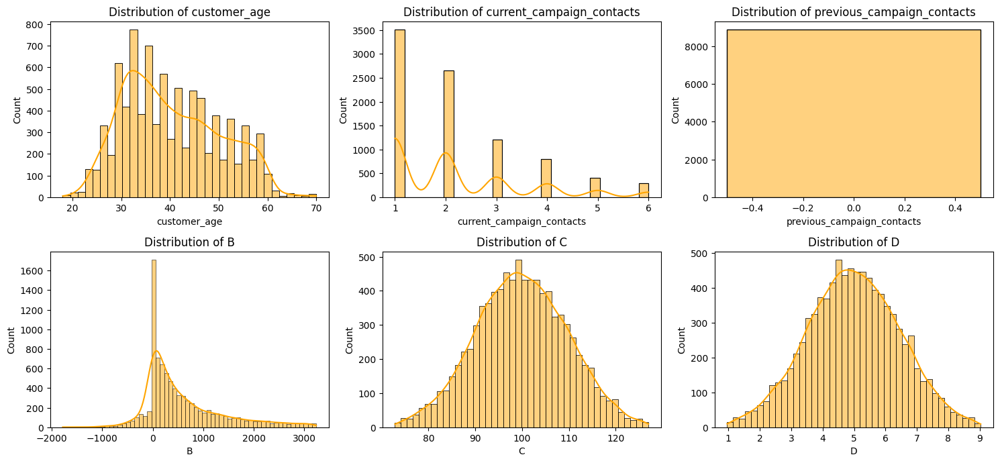

In [45]:
# Plot histograms for numerical features
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features):
    plt.subplot(3, 3, i+1)
    sns.histplot(df[feature], kde=True, color='orange')
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

0708
- Outlier removal has effectively reduced extreme values and long tails in several numerical features.
- Features like `previous_campaign_contacts` may have been over-corrected, leading to a uniform distribution, which should be revisited.
- The overall distribution of features like `customer_age`, `current_campaign_contacts`, and `B` have improved, making them more suitable for modeling.
- Features `C` and `D` maintained their normal distributions, indicating no adverse effects from outlier removal.

**Correlation Matrices - After Outlier Removal:**

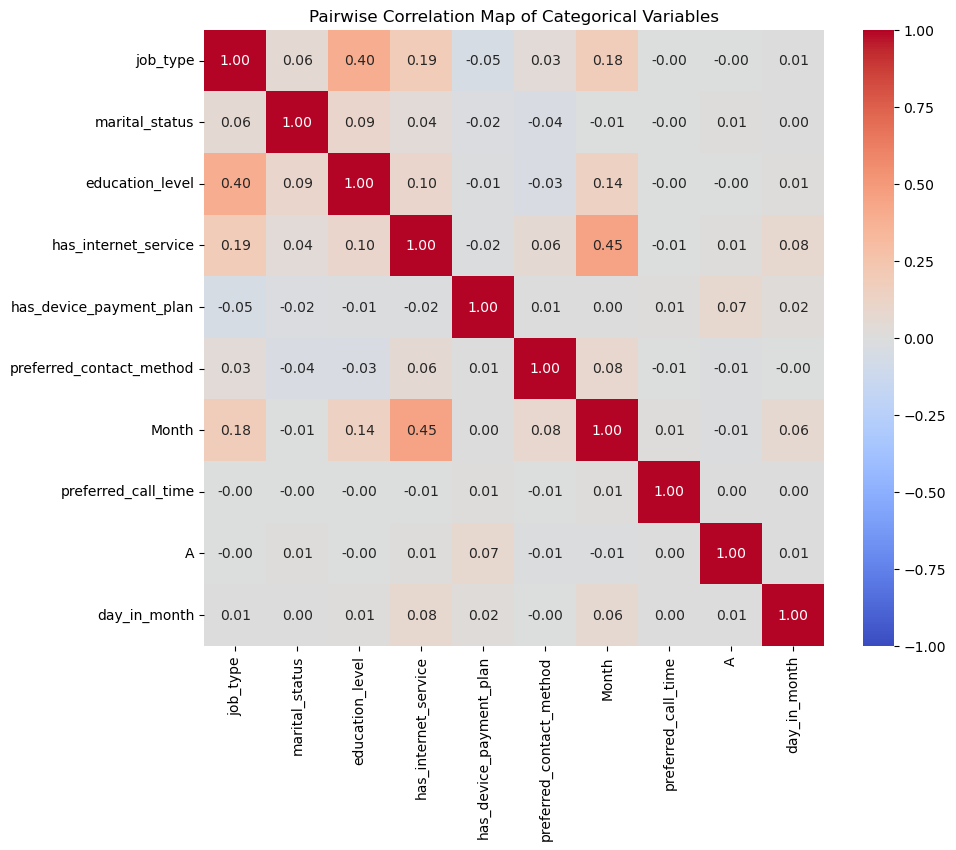

In [35]:
# Factorize categorical variables to convert them into numerical values
cat_data = df[categorical_features].apply(lambda x: pd.factorize(x)[0])

# Compute the correlation matrix
correlation_matrix = cat_data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0)
plt.title('Pairwise Correlation Map of Categorical Variables')
plt.show()

#### Distribution of Categorical Features After Removing Outliers

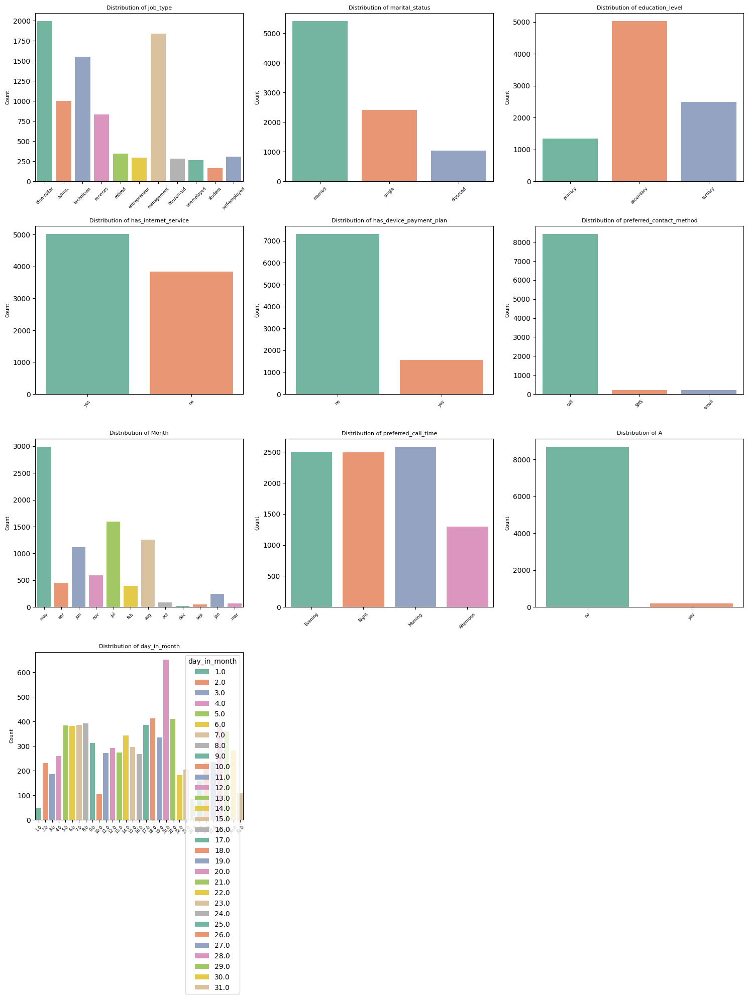

In [47]:
# Ensure all categorical features exist in the dataframe
existing_categorical_features = [feature for feature in categorical_features if feature in df.columns]

if existing_categorical_features:  # Proceed only if there are existing categorical features
    num_features = len(existing_categorical_features)
    num_cols = 3  # Number of columns
    num_rows = (num_features // num_cols) + (1 if num_features % num_cols != 0 else 0)  # Calculate rows needed
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 5))  # Adjust figsize as needed

    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    for idx, feature in enumerate(existing_categorical_features):
        sns.countplot(data=df, x=feature, ax=axes[idx], hue=feature, palette='Set2')
        axes[idx].set_title(f'Distribution of {feature}', fontsize=8)
        axes[idx].set_xlabel('')
        axes[idx].set_ylabel('Count', fontsize=7)
        for tick in axes[idx].get_xticklabels():
            tick.set_rotation(45)
            tick.set_fontsize(6)

    # Hide any remaining empty subplots
    for idx in range(len(existing_categorical_features), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()
else:
    print("No existing categorical features to plot.")


Categorical Features

**Before Outlier Removal:**
- **job_type**: Diverse with "blue-collar" being most common.
- **marital_status**: "Married" is the most common status.
- **education_level**: "Secondary" is most common.
- **has_internet_service**: Mostly "yes".
- **has_device_payment_plan**: Mostly "no".
- **preferred_contact_method**: Mostly "call".
- **Month**: "May" is the most common.
- **preferred_call_time**: Evenly distributed across all times. After transforming the column in part 1, afternoon was significantly less common than the rest which were evenly distributed.
- **previous_campaign_outcome**: "failure" is the most common.
- **subscribed_to_new_plan:** mostly "no".

**After Outlier Removal:**
- Distributions are similar to before outlier removal but with fewer extreme values. The fundamental patterns in the categorical data remain unchanged (except for previous_campaign_outcome, where now all its values are "failure" instead of many "failure" values and a minority of "success" values), indicating that the outlier removal primarily affected numerical data.

Conclusion:
Removing outliers has significantly affected the distribution of numerical features by reducing extreme values and skewness, leading to more centralized and normal distributions. This preprocessing step will help improve the robustness and accuracy of machine learning models by mitigating the influence of outliers.

C:\Users\user\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\user\anaconda3\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\user\anaconda3\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-

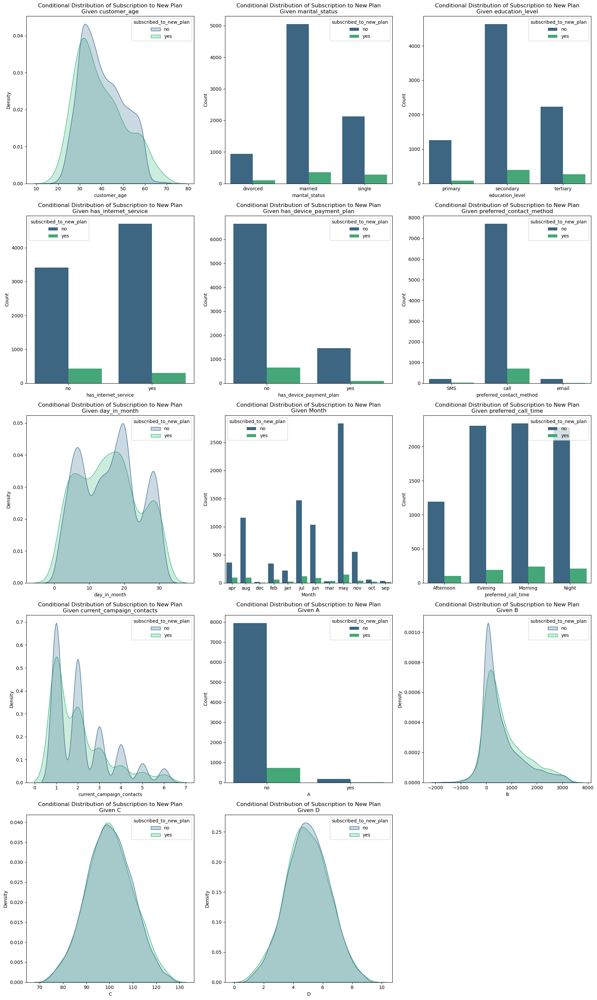

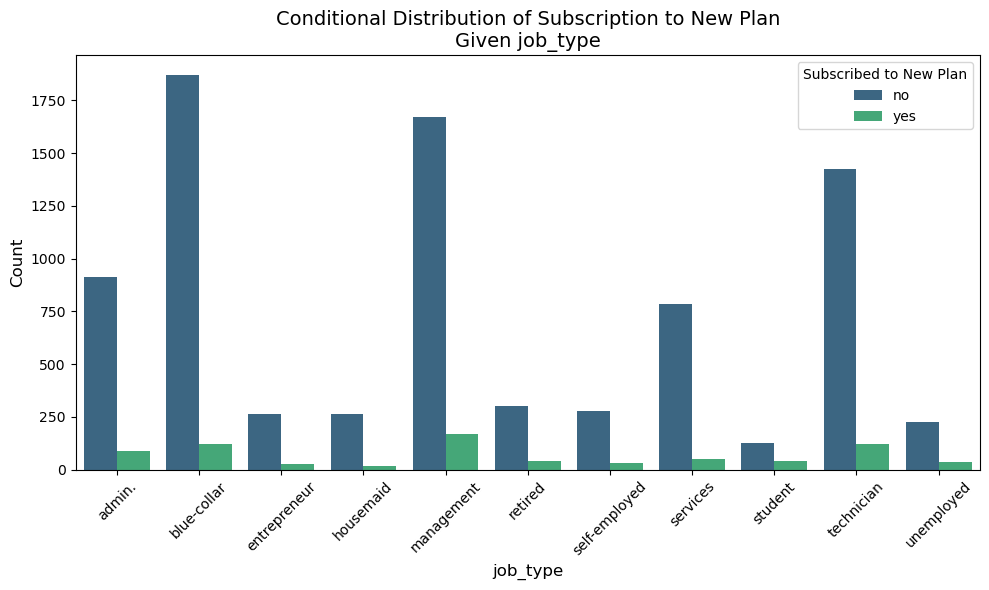

In [36]:
# List of features in the dataset (excluding the target variable)
all_features = df.columns.drop('subscribed_to_new_plan')
features_to_plot = all_features[all_features != 'job_type']
features_to_plot = features_to_plot[features_to_plot != 'previous_campaign_contacts']
job_type_feature = 'job_type'

# Define the number of plots per row for the general features
plots_per_row = 3

# Calculate the number of rows needed for the general features
num_rows = len(features_to_plot) // plots_per_row + int(len(features_to_plot) % plots_per_row != 0)

# Create subplots for all features except "job_type"
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(18, num_rows * 6))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Loop through each feature (except "job_type") and create a plot
for idx, feature in enumerate(features_to_plot):
    ax = axes[idx]
    
    # Check if the feature is categorical or numerical
    if df[feature].dtype == 'object':
        # Group by feature and subscribed_to_new_plan, and count the occurrences
        groups = df.groupby([feature, 'subscribed_to_new_plan']).size().reset_index(name='count')
        
        # Create the bar plot for categorical features
        sns.barplot(x=feature, y='count', data=groups, hue='subscribed_to_new_plan', palette='viridis', ax=ax)
        ax.set_xlabel(feature)
    else:
        # Create a KDE plot for numerical features
        sns.kdeplot(data=df, x=feature, hue='subscribed_to_new_plan', common_norm=False, palette='viridis', fill=True, ax=ax)
        ax.set_xlabel(feature)
        
    # Adding title and labels
    ax.set_title(f'Conditional Distribution of Subscription to New Plan\nGiven {feature}')
    ax.set_ylabel('Density' if df[feature].dtype != 'object' else 'Count')

# Remove any unused subplots
for idx in range(len(features_to_plot), len(axes)):
    fig.delaxes(axes[idx])

# Adjust layout for all features except "job_type"
plt.tight_layout()
plt.show()

# Plot for "job_type" separately
if job_type_feature in df.columns:
    plt.figure(figsize=(10, 6))
    groups = df.groupby([job_type_feature, 'subscribed_to_new_plan']).size().reset_index(name='count')
    sns.barplot(x=job_type_feature, y='count', data=groups, hue='subscribed_to_new_plan', palette='viridis')
    plt.title(f'Conditional Distribution of Subscription to New Plan\nGiven {job_type_feature}', fontsize=14)
    plt.xlabel(job_type_feature, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45)
    plt.legend(title='Subscribed to New Plan', fontsize=10, loc='best')
    plt.tight_layout()
    plt.show()
else:
    print(f"{job_type_feature} is not in the DataFrame.")


**Conditional Distributions - After Outlier Removal:**
- Distributions are similar to before outlier removal but with fewer extreme values. The fundamental patterns in the all data remain unchanged (a minority of "success" values in current_campaign_contacts - the distributions - "yes" & "no" seem to generally overlap, but compared to the same plot before removing outliers, there's a much less extreme right tail), indicating that the outlier removal primarily affected numerical data.

Conclusion:
Removing outliers has significantly affected the distribution of numerical features by reducing extreme values and skewness, leading to more centralized and normal distributions. This preprocessing step will help improve the robustness and accuracy of machine learning models by mitigating the influence of outliers.

**Correlation Matrices - After Outlier Removal:**

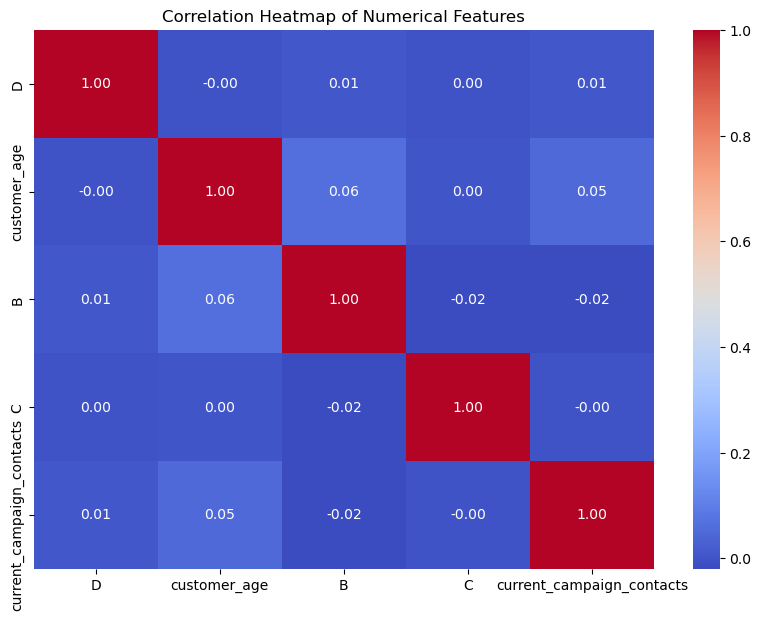

In [37]:
# Calculate correlations for numerical features only
num = list(set(numerical_features) - set(["previous_campaign_contacts"]))
correlation_matrix = df[num].corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

**Correlation Matrix of Numerical Features After Removing Outliers**

The correlation matrix visualizes the relationships between different numerical features after the removal of outliers.


- The correlation heatmap indicates that numerical features have minimal correlations with each other after removing outliers.
- Features like `C` and `D` operate independently, while `customer_age` and `B` show very weak relationships with other features.
- Understanding these low correlations is crucial for feature selection and engineering, ensuring that features contribute unique information to the model without redundancy.

**Summary:**
- The correlation matrix helps identify relationships between numerical features, guiding feature selection and engineering.
- Strong correlations (e.g., between `B` and `D`) indicate redundancy, suggesting that one of these features might be removed to reduce multicollinearity.
- Low correlations with `current_campaign_contacts` and `previous_campaign_contacts` suggest these features can provide unique information for the model.
- Understanding these correlations is crucial for optimizing the feature set and improving model performance.


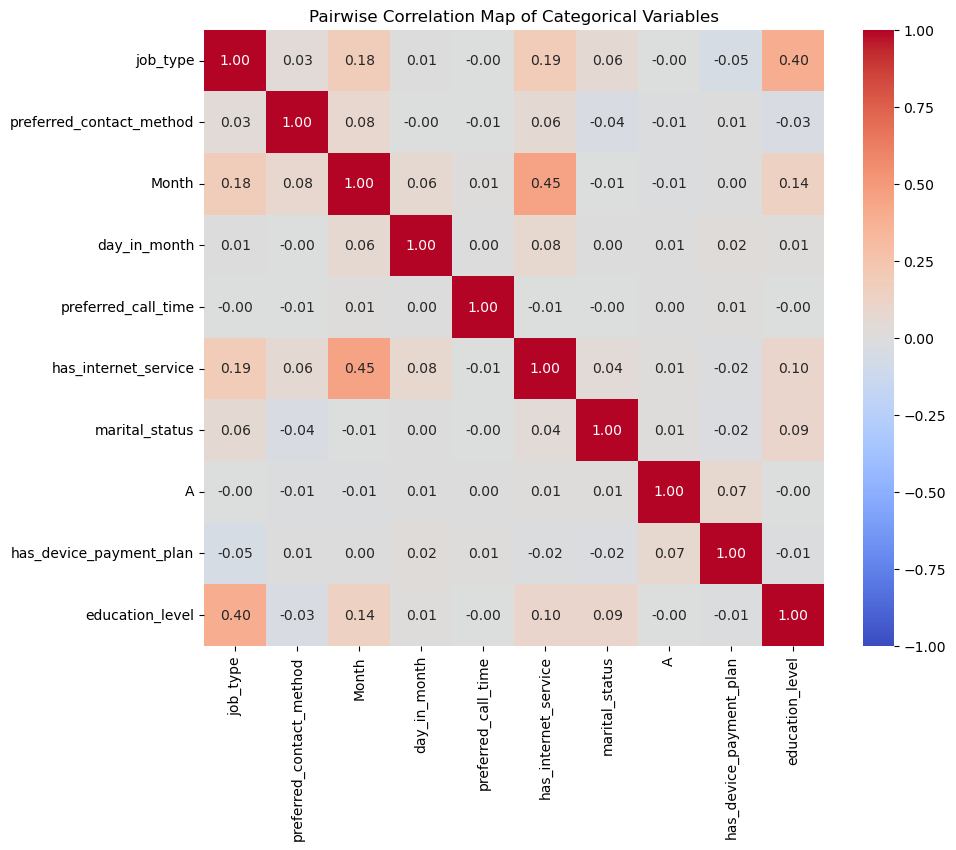

In [38]:
# Factorize categorical variables to convert them into numerical values
cat = list(set(categorical_features) - set(["previous_campaign_outcome"]))
cat_data = df[cat].apply(lambda x: pd.factorize(x)[0])

# Compute the correlation matrix
correlation_matrix = cat_data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0)
plt.title('Pairwise Correlation Map of Categorical Variables')
plt.show()

**Observations:**
Generally, it seems like most correlations between numerical variables haven't increased and came closer to 0 after outlier removal (they haven't increased in their absolute value). However, the opposite general trend occurs regarding the categorical variables - it seems like most correlations between them haven't decreased and went further away from 0 after outlier removal (they haven't decreased in their absolute value).

**Heatmap of Missing Values (sanity check - did we indeed succeed removing them?)**

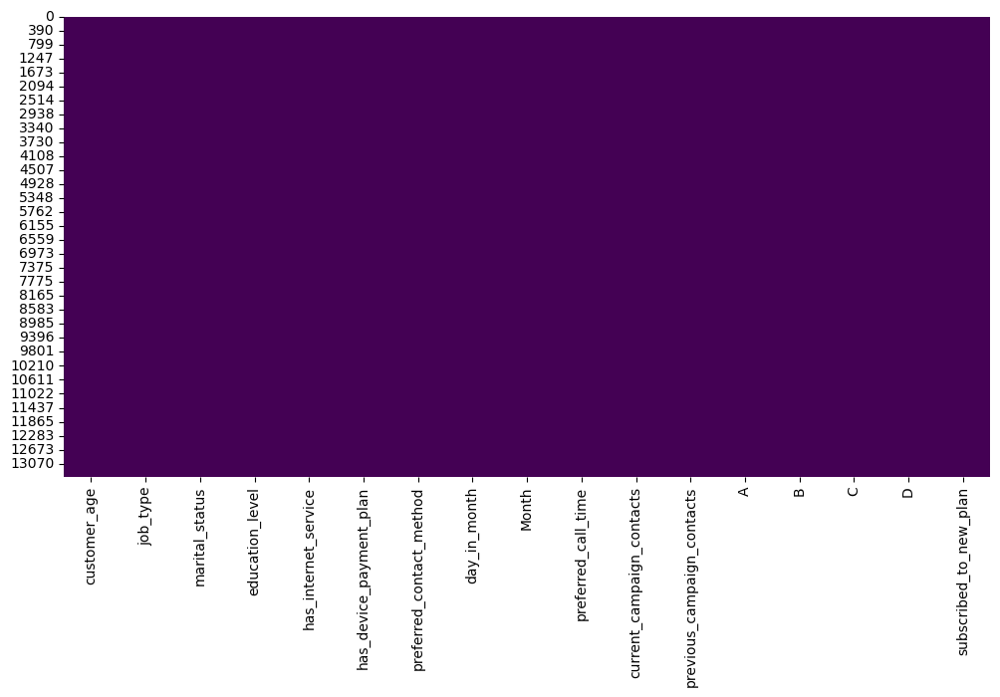

In [39]:
# Creating the heatmap for missing values:
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
# Plotting it:
plt.show()

There are no NaNs / nulls in the dataset - since the entire table is purple which means all rows and all values within them are non-null.

### Categorical Variables - OHE

In [33]:
# Perform One-Hot Encoding on the specified categorical features
df_encoded = pd.get_dummies(df, columns=categorical_features+['subscribed_to_new_plan'], drop_first=True)

# Display the first few rows of the encoded DataFrame
print(df_encoded.head())

# Update lists of numerical and categorical features after encoding
updated_numerical_features = df_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()
updated_categorical_features = df_encoded.select_dtypes(include=['uint8']).columns.tolist()

print("Updated Categorical Features:", updated_categorical_features)
print("Updated Numerical Features:", updated_numerical_features)

   customer_age  current_campaign_contacts  previous_campaign_contacts  \
0          42.0                        4.0                         0.0   
1          32.0                        4.0                         0.0   
3          32.0                        5.0                         0.0   
4          28.0                        1.0                         0.0   
6          44.0                        1.0                         0.0   

        B           C         D  job_type_blue-collar  job_type_entrepreneur  \
0  2519.0   82.213907  2.669578                  True                  False   
1   923.0   87.685605  5.624491                 False                  False   
3   257.0   97.262825  3.387077                 False                  False   
4   -36.0  100.326495  7.154399                 False                  False   
6   236.0   85.157185  2.825141                  True                  False   

   job_type_housemaid  job_type_management  ...  day_in_month_23.0  \
0   

In [34]:
df_encoded = df_encoded.rename(columns={'subscribed_to_new_plan_yes': 'subscribed_to_new_plan'})

In [35]:
df_encoded.head()

,customer_age,current_campaign_contacts,previous_campaign_contacts,B,C,D,job_type_blue-collar,job_type_entrepreneur,job_type_housemaid,job_type_management,...,day_in_month_23.0,day_in_month_24.0,day_in_month_25.0,day_in_month_26.0,day_in_month_27.0,day_in_month_28.0,day_in_month_29.0,day_in_month_30.0,day_in_month_31.0,subscribed_to_new_plan
0,42.0,4.0,0.0,2519.0,82.213907,2.669578,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,32.0,4.0,0.0,923.0,87.685605,5.624491,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,32.0,5.0,0.0,257.0,97.262825,3.387077,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,28.0,1.0,0.0,-36.0,100.326495,7.154399,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
6,44.0,1.0,0.0,236.0,85.157185,2.825141,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


**Correlation Matrix - After OHE:**

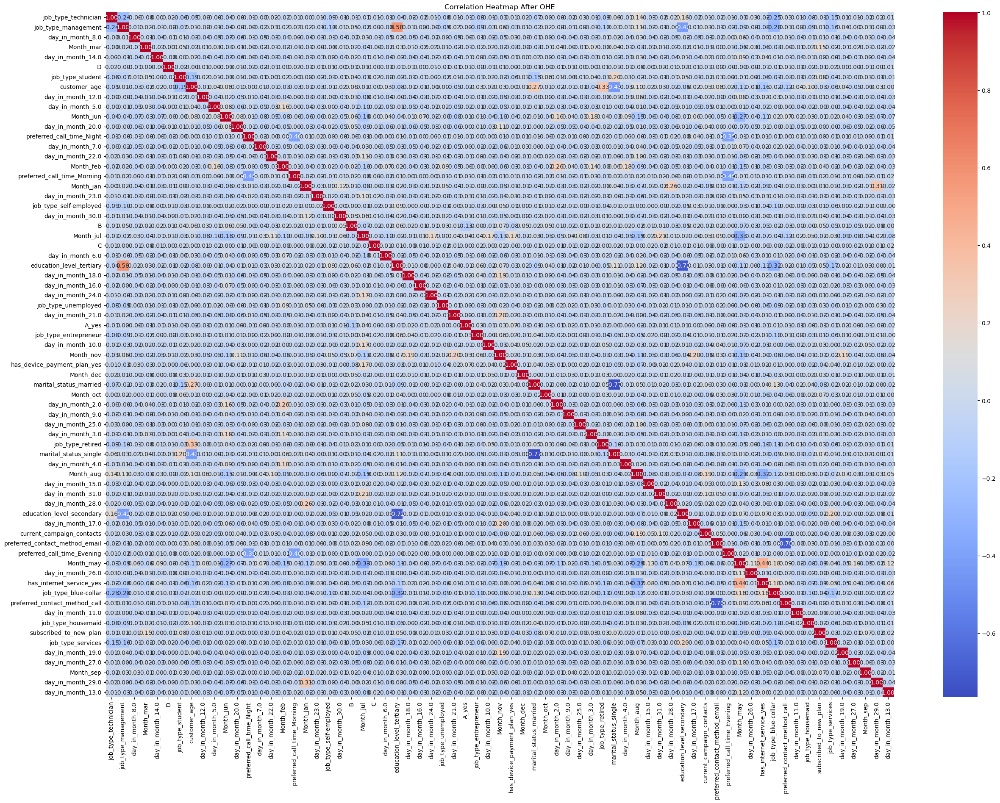

In [43]:
f = list(set(df_encoded.columns) - set(["previous_campaign_contacts"]))

correlation_matrix = df_encoded[f].corr()

# Plot the correlation heatmap
plt.figure(figsize=(30, 21))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap After OHE')
plt.show()

As we can see:
- Matrix dimensions are huge. Way bigger than its precedents. 
- Most values seem very close to  0 -> the new variables are mostly uncorrelated between one-another.
- This indicates that each feature contributes unique information, which is beneficial for building a robust machine learning model.
- However, there are some interesting correlations that can make sense thinking about them - for example: customer-age & job-type-retired (0.33), or the preferred call time categories (between one-another) - all correlations there are around 0.39-0.4. There are some higher correlations (but not above 0.6) like job-type-management & education-level-tertiary (0.58).
- The few observed correlations, both positive and negative, provide insights into specific relationships between features.
- Overall, the minimal multicollinearity enhances the dataset's suitability for modeling.

### Normalization

In the Preprocessing part (specifically while Imputing Nulls (Handling Missing Values)), it was shown that all numerical columns are not normaly distributed. However, in this phase, we can see it isn't really the case, and some of the features are indeed normally distributed.

We normalized the data in such way because we know for class that standardization works well on normally distributed features, and after trying other scalers for the non-normal features, we figured out that robust scaler works best on our data. It also doesn't change OHE features since it's a linear transformation upon those features. If X is the OHE feature, then new_X = X - 0.5

In [36]:
# Normalize the features based on their distribution
scaler = StandardScaler()
robust_scaler = RobustScaler()
normal_features = []

for feature in numerical_features:
    if stats.shapiro(df_encoded[feature])[1] > 0.05:  # If the distribution is normal
        normal_features.append(feature)
        df_encoded[feature] = scaler.fit_transform(df[[feature]])
    else:  # If the distribution is not normal
        df_encoded[feature] = robust_scaler.fit_transform(df[[feature]])

# Display the cleaned and processed DataFrame
df_encoded.head()

C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1813: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\us

,customer_age,current_campaign_contacts,previous_campaign_contacts,B,C,D,job_type_blue-collar,job_type_entrepreneur,job_type_housemaid,job_type_management,...,day_in_month_23.0,day_in_month_24.0,day_in_month_25.0,day_in_month_26.0,day_in_month_27.0,day_in_month_28.0,day_in_month_29.0,day_in_month_30.0,day_in_month_31.0,subscribed_to_new_plan
0,0.1875,1.0,0.0,2.538439,-1.300609,-1.149287,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,-0.4375,1.0,0.0,0.700259,-0.894517,0.324415,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,-0.4375,1.5,0.0,-0.066801,-0.183725,-0.791449,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,-0.6875,-0.5,0.0,-0.404261,0.043651,1.087425,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
6,0.3125,-0.5,0.0,-0.090988,-1.082168,-1.071703,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Feature Selection using LassoCV

**Why Choose Lasso for Feature Selection?**

1. **Automatic Feature Selection**:
   - Lasso automatically selects important features by shrinking some coefficients to zero, simplifying the model and focusing on the most relevant variables.

2. **Handling Multicollinearity**:
   - Lasso effectively manages multicollinearity by selecting one of the correlated features and discarding the others, ensuring a more robust model.

3. **Regularization**:
   - The regularization term in Lasso prevents overfitting, leading to a model that generalizes better to new data.

4. **Improved Interpretability**:
   - By reducing the number of features, Lasso enhances the interpretability of the model, making it easier to understand and explain.

5. **Optimal Performance**:
   - Lasso uses cross-validation to find the best level of regularization, ensuring that the final model achieves optimal performance.

In summary, Lasso is chosen for its ability to simplify the model, handle multicollinearity, prevent overfitting, and improve interpretability, minimize the problem's dimension (which can result in the curse of dimensionality - in which one of the implications is that distance is harder to calculate & interpret as the problem's dimension grows, and distance based models will take longer time to work - like KNN), leading to a robust and effective predictive model.

In [37]:
# Assuming 'subscribed_to_new_plan' is the target variable
target_column = 'subscribed_to_new_plan'

# Check if target column exists in the DataFrame
if target_column not in df_encoded.columns:
    print(f"Target column '{target_column}' not found in the DataFrame.")
else:
    # Encode the target variable to numeric (1/0)
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(df_encoded[target_column])

    # Define X (features)
    X = df_encoded.drop(target_column, axis=1)

    # Use LassoCV to find the best alpha
    lasso_cv = LassoCV(alphas=np.logspace(-4, 0, 50), cv=5)
    lasso_cv.fit(X, y)
    best_alpha = lasso_cv.alpha_

    print(f"Best alpha selected: {best_alpha}")

    # Initialize and fit the Lasso regression model with the best alpha
    lasso = Lasso(alpha=best_alpha)
    lasso.fit(X, y)

    # Get the selected features
    selected_features = [feature for feature, coef in zip(X.columns, lasso.coef_) if coef != 0]

    # Get the excluded features
    excluded_features = [feature for feature in X.columns if feature not in selected_features]

Best alpha selected: 0.0002559547922699536


In [38]:
print("Selected features:")
print(selected_features,"\n")

print("Excluded features:")
print(excluded_features,"\n")

# Create a new DataFrame with the selected features
X_selected = X[selected_features]

# Display the DataFrame with the selected features
print(X_selected.head())

Selected features:
['customer_age', 'current_campaign_contacts', 'B', 'C', 'D', 'job_type_blue-collar', 'job_type_entrepreneur', 'job_type_housemaid', 'job_type_management', 'job_type_retired', 'job_type_services', 'job_type_student', 'job_type_technician', 'job_type_unemployed', 'marital_status_married', 'marital_status_single', 'education_level_secondary', 'education_level_tertiary', 'has_internet_service_yes', 'has_device_payment_plan_yes', 'preferred_contact_method_call', 'preferred_contact_method_email', 'Month_aug', 'Month_feb', 'Month_jan', 'Month_jul', 'Month_jun', 'Month_mar', 'Month_may', 'Month_nov', 'Month_oct', 'Month_sep', 'preferred_call_time_Evening', 'preferred_call_time_Morning', 'preferred_call_time_Night', 'day_in_month_4.0', 'day_in_month_5.0', 'day_in_month_6.0', 'day_in_month_7.0', 'day_in_month_8.0', 'day_in_month_9.0', 'day_in_month_10.0', 'day_in_month_12.0', 'day_in_month_13.0', 'day_in_month_14.0', 'day_in_month_15.0', 'day_in_month_16.0', 'day_in_month_17.0

# Part Three: Running the Models

### Split the data into training and testing sets

In [39]:
# Assuming X and y are your features and target variable respectively
# Split the original training dataset into a new training set and a validation set
X_train_new, X_val, y_train_new, y_val = train_test_split(X_selected, y, test_size=0.25, random_state=42)  # 75% for training, 25% for validation

# Print the shapes to verify
print(f"New Training Set Shape: {X_train_new.shape}, {y_train_new.shape}")
print(f"Validation Set Shape: {X_val.shape}, {y_val.shape}")

New Training Set Shape: (6648, 55), (6648,)
Validation Set Shape: (2216, 55), (2216,)


### Evaluation Metrics

In [40]:
def evaluate_model(y_test, y_pred, y_prob):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)
    return accuracy, precision, recall, f1, roc_auc

**Models - Simple (Logistic Regression & KNN) & Advanced (SVM, Random Forest, Decision Tree & Multi Layer Perceptron - MLP):**

In [41]:
# Define models:
models = {
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'MLP': MLPClassifier(max_iter=1000)
}

### K Fold Cross Validation:

We followed a general rule of thumb (from the internet), in which K = 10 - since it's considered the most common (bc of bias-variance considerations which we haven't seen formal proofs of when we looked on the internet). However, we can say that a too large K (like in LOOCV) may result in lower bias since the model learns on a large variety of training datasets, but each dataset doesn't include many datapoints, which may result in higher variance. A K too small may result in lower variance, since the number of datapoints in each dataset is very large, which means, if we'll train the model again & again & again, the results will tend to change less over time. However, throughout the training process, the models won't be able to always best capture the true relationship between the independent variables & dependent variable, which may result in higher bias.
For each plot, we split the training data to a new, smaller set of training data, and a validation set.
For each fold, this piece of code includes:
* Each model's relevant metrics (specific to a certain fold) - AUC, accuracy, precision, recall, F1-score (which are also within a designated metrics dataframe), confusion matrix.
* ROC curves of all models, specific to that fold.

Fold 1
Model: Logistic Regression
Metrics for Logistic Regression - Fold 1:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: SVM
Metrics for SVM - Fold 1:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 1:
  AUC: 0.68
  Accuracy: 0.92
  Precision: 0.40
  Recall: 0.04
  F1 Score: 0.07


Model: Random Forest
Metrics for Random Forest - Fold 1:
  AUC: 0.74
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Decision Tree
Metrics for Decision Tree - Fold 1:
  AUC: 0.52
  Accuracy: 0.84
  Precision: 0.10
  Recall: 0.14
  F1 Score: 0.11


Model: MLP
Metrics for MLP - Fold 1:
  AUC: 0.63
  Accuracy: 0.89
  Precision: 0.17
  Recall: 0.14
  F1 Score: 0.16






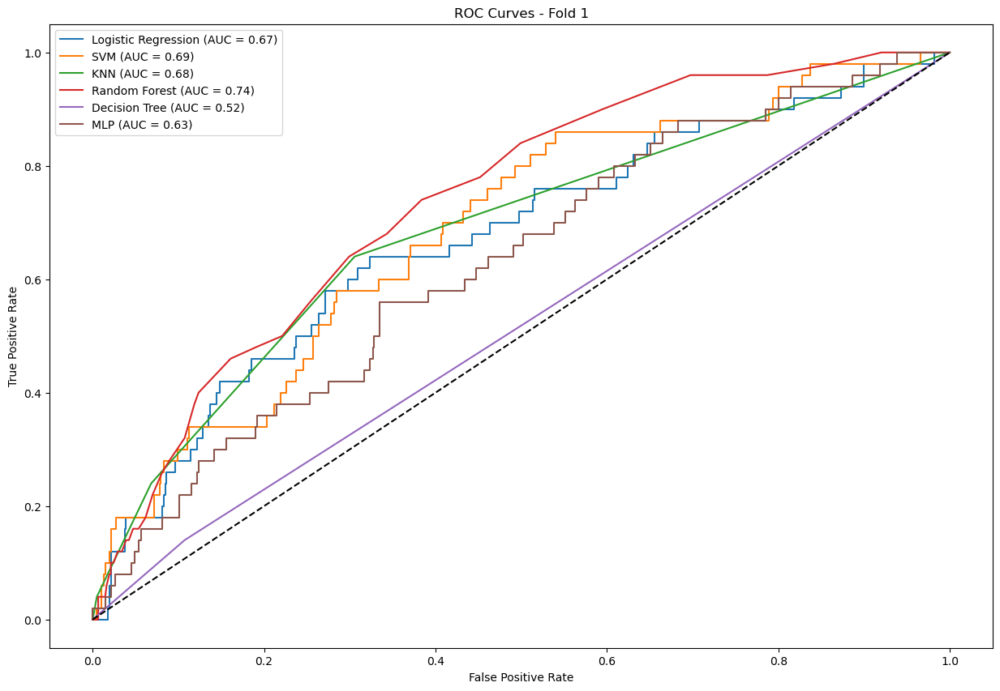

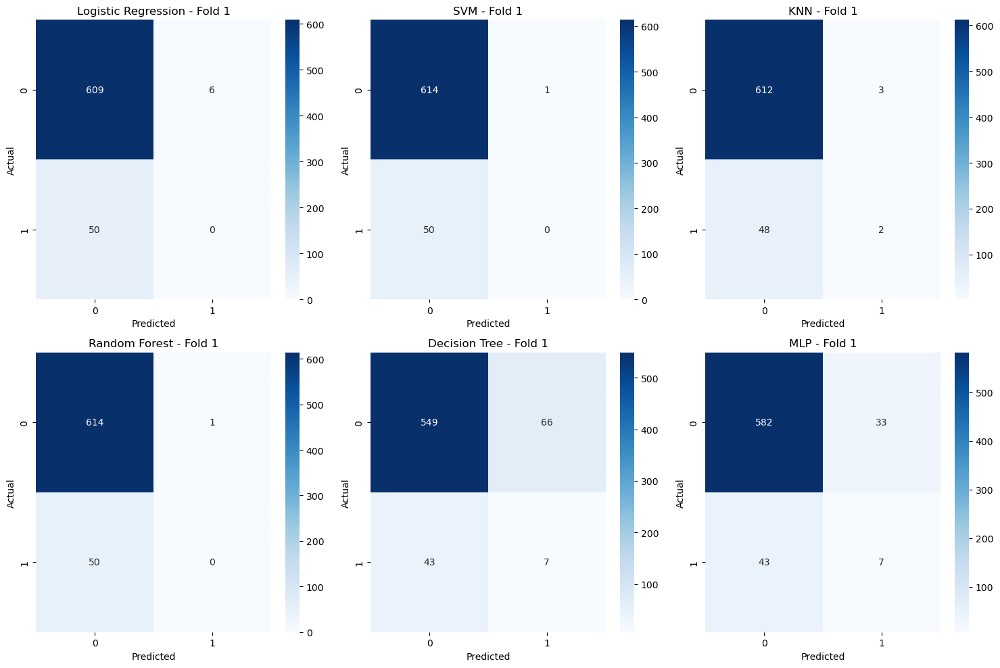

Fold 2
Model: Logistic Regression
Metrics for Logistic Regression - Fold 2:
  AUC: 0.71
  Accuracy: 0.92
  Precision: 0.67
  Recall: 0.07
  F1 Score: 0.12




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 2:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 2:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.25
  Recall: 0.02
  F1 Score: 0.03


Model: Random Forest
Metrics for Random Forest - Fold 2:
  AUC: 0.70
  Accuracy: 0.91
  Precision: 0.50
  Recall: 0.05
  F1 Score: 0.09


Model: Decision Tree
Metrics for Decision Tree - Fold 2:
  AUC: 0.61
  Accuracy: 0.86
  Precision: 0.26
  Recall: 0.31
  F1 Score: 0.28


Model: MLP
Metrics for MLP - Fold 2:
  AUC: 0.69
  Accuracy: 0.89
  Precision: 0.32
  Recall: 0.22
  F1 Score: 0.26






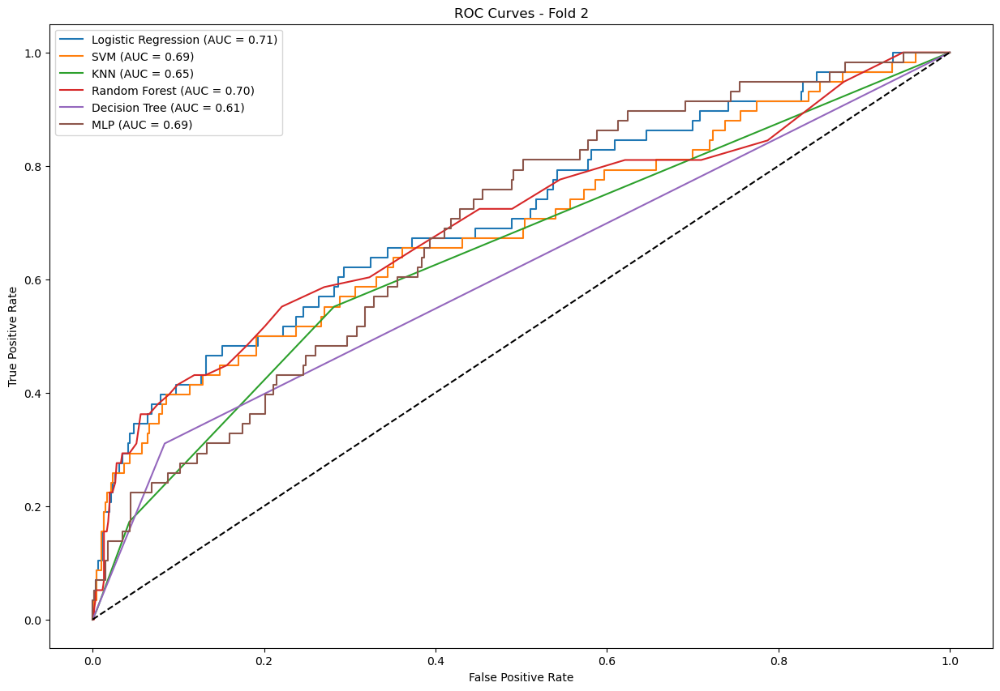

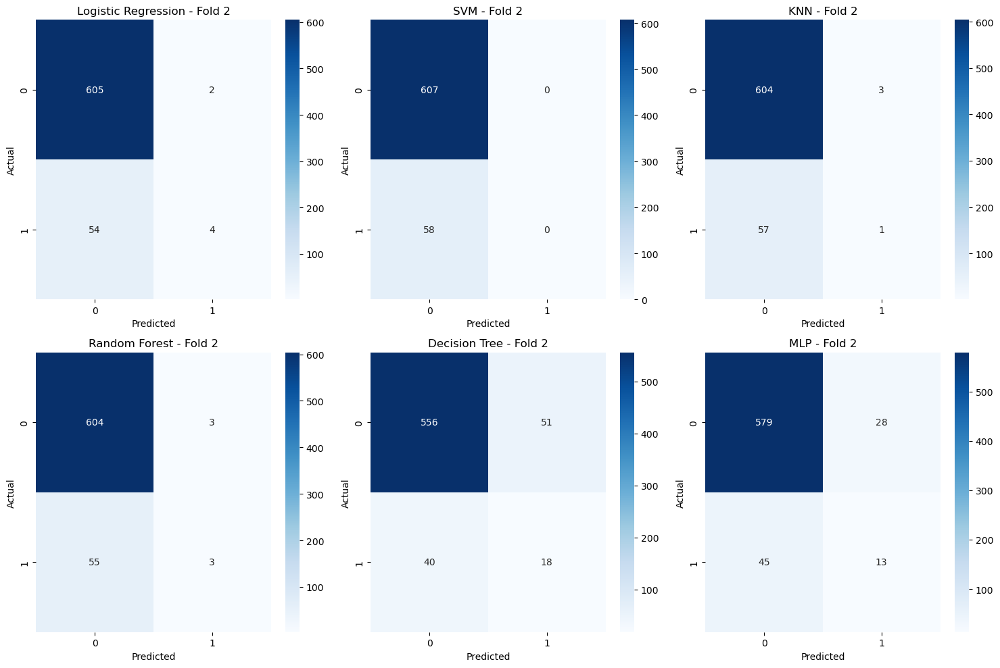

Fold 3
Model: Logistic Regression
Metrics for Logistic Regression - Fold 3:
  AUC: 0.67
  Accuracy: 0.93
  Precision: 0.17
  Recall: 0.02
  F1 Score: 0.04




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 3:
  AUC: 0.59
  Accuracy: 0.94
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 3:
  AUC: 0.55
  Accuracy: 0.93
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Random Forest
Metrics for Random Forest - Fold 3:
  AUC: 0.64
  Accuracy: 0.93
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.04


Model: Decision Tree
Metrics for Decision Tree - Fold 3:
  AUC: 0.52
  Accuracy: 0.87
  Precision: 0.09
  Recall: 0.12
  F1 Score: 0.10


Model: MLP
Metrics for MLP - Fold 3:
  AUC: 0.54
  Accuracy: 0.90
  Precision: 0.14
  Recall: 0.12
  F1 Score: 0.13






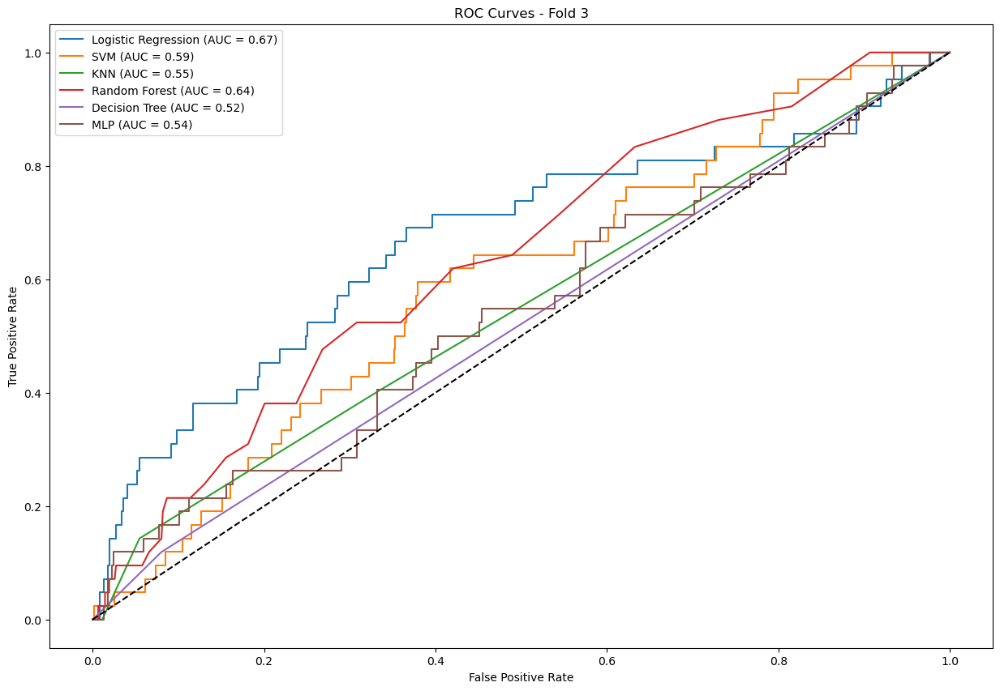

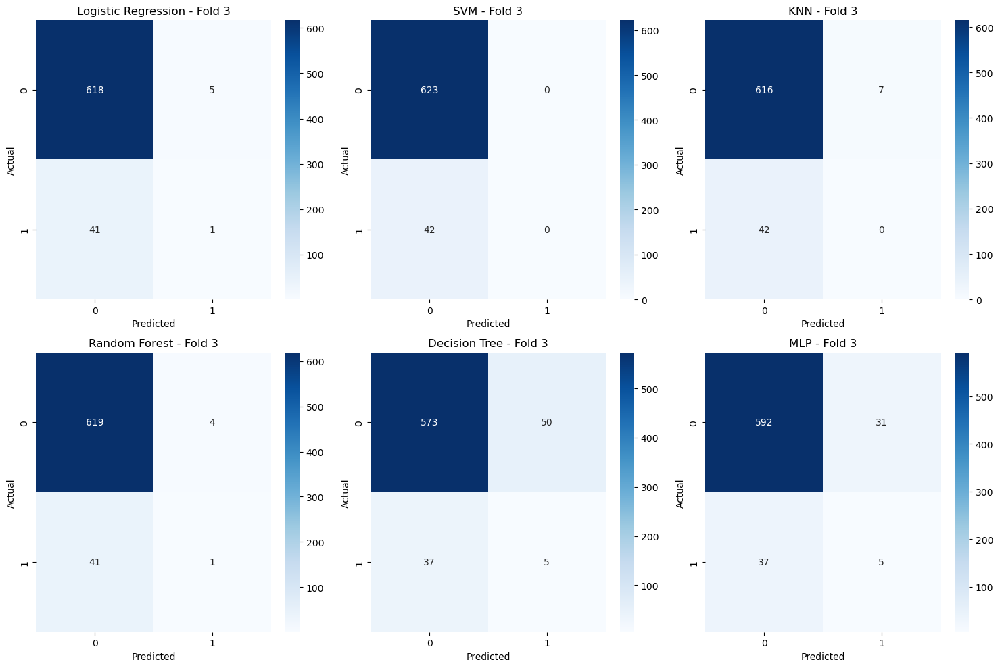

Fold 4
Model: Logistic Regression
Metrics for Logistic Regression - Fold 4:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 0.33
  Recall: 0.02
  F1 Score: 0.03




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 4:
  AUC: 0.64
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 4:
  AUC: 0.62
  Accuracy: 0.91
  Precision: 0.40
  Recall: 0.03
  F1 Score: 0.06




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: Random Forest
Metrics for Random Forest - Fold 4:
  AUC: 0.67
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Decision Tree
Metrics for Decision Tree - Fold 4:
  AUC: 0.54
  Accuracy: 0.86
  Precision: 0.17
  Recall: 0.15
  F1 Score: 0.16


Model: MLP
Metrics for MLP - Fold 4:
  AUC: 0.59
  Accuracy: 0.88
  Precision: 0.17
  Recall: 0.10
  F1 Score: 0.13






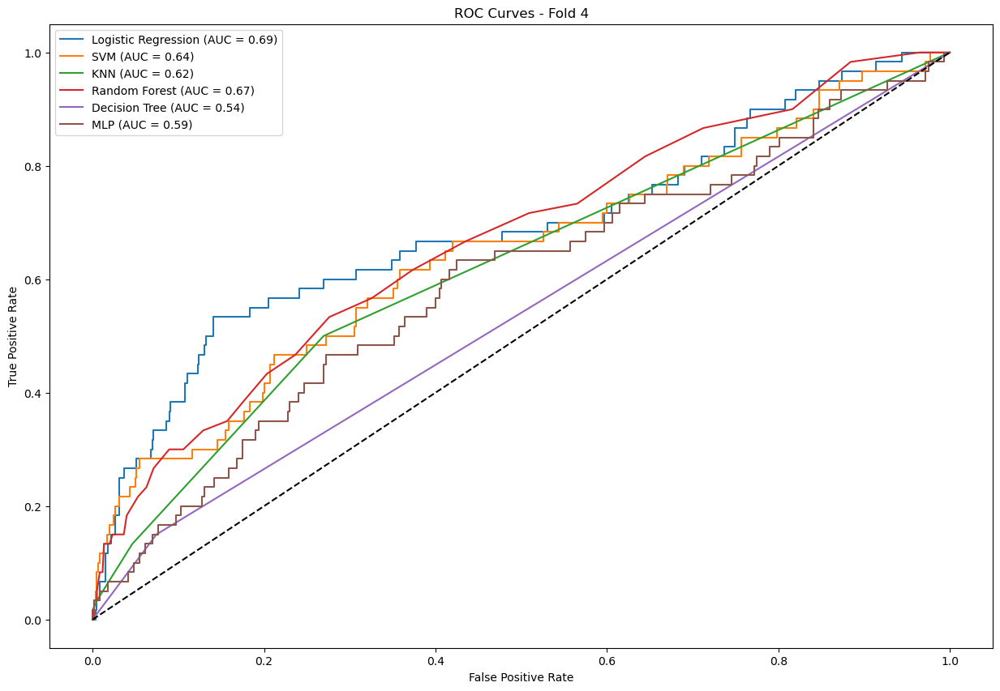

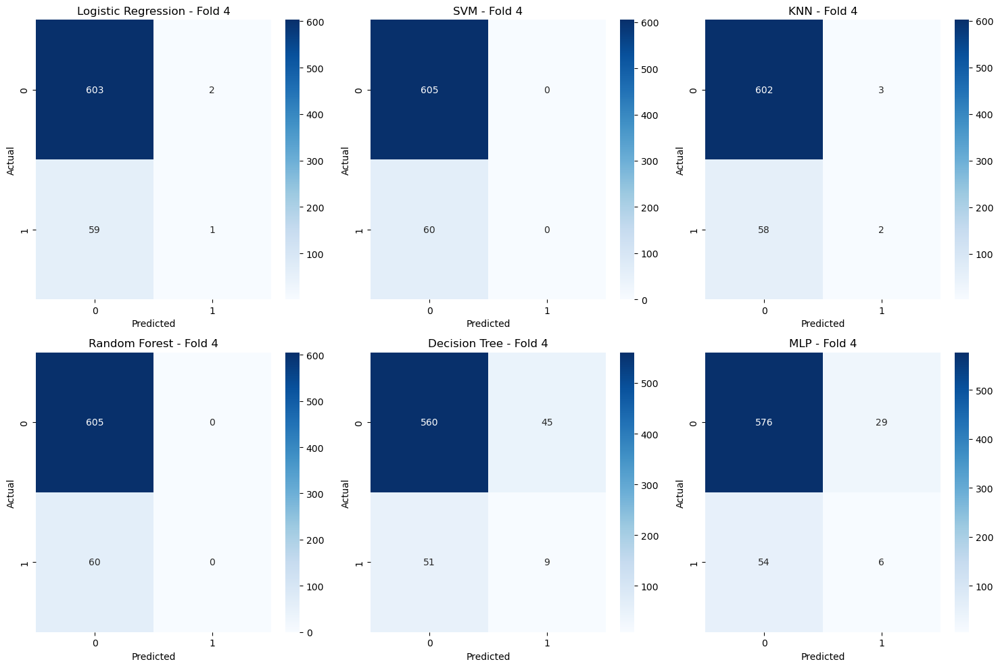

Fold 5
Model: Logistic Regression
Metrics for Logistic Regression - Fold 5:
  AUC: 0.72
  Accuracy: 0.91
  Precision: 0.80
  Recall: 0.07
  F1 Score: 0.12




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 5:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 5:
  AUC: 0.58
  Accuracy: 0.91
  Precision: 0.50
  Recall: 0.03
  F1 Score: 0.06


Model: Random Forest
Metrics for Random Forest - Fold 5:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 0.75
  Recall: 0.05
  F1 Score: 0.09


Model: Decision Tree
Metrics for Decision Tree - Fold 5:
  AUC: 0.57
  Accuracy: 0.85
  Precision: 0.20
  Recall: 0.23
  F1 Score: 0.21


Model: MLP
Metrics for MLP - Fold 5:
  AUC: 0.61
  Accuracy: 0.88
  Precision: 0.24
  Recall: 0.16
  F1 Score: 0.20






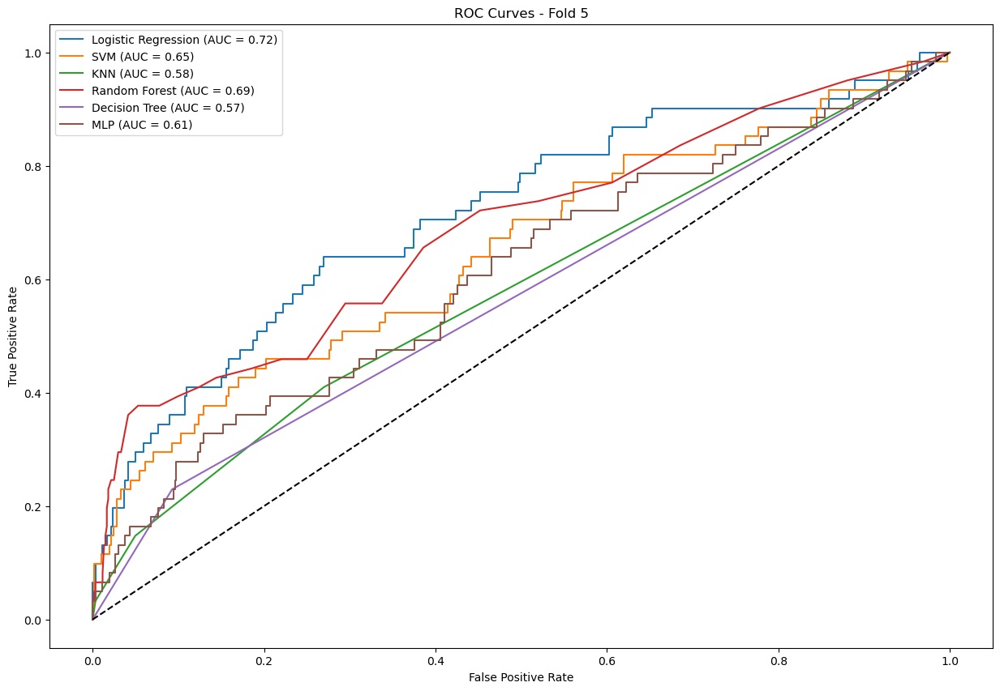

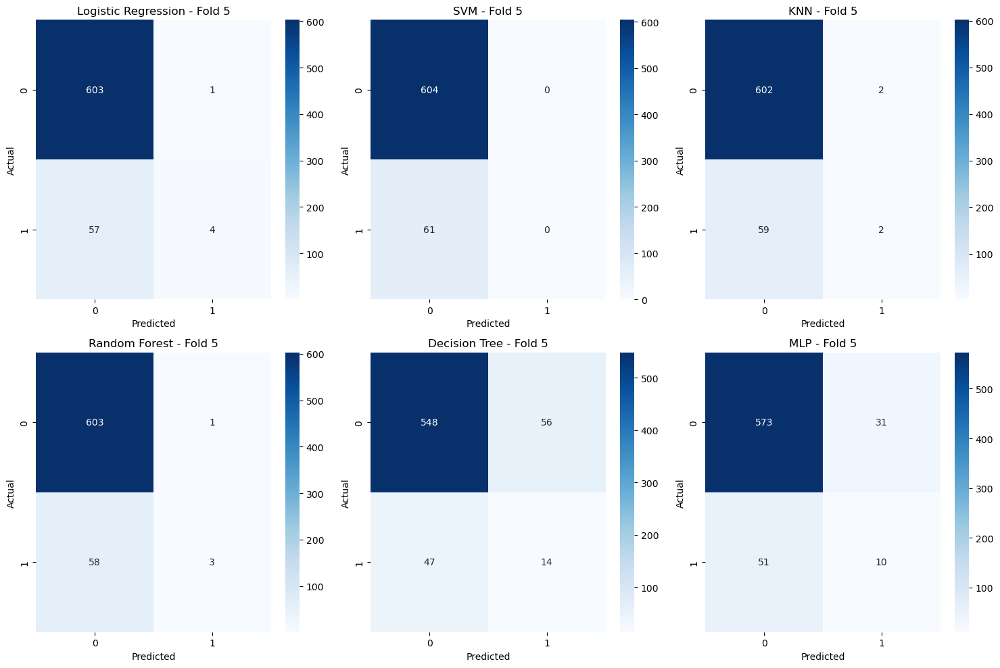

Fold 6
Model: Logistic Regression
Metrics for Logistic Regression - Fold 6:
  AUC: 0.72
  Accuracy: 0.93
  Precision: 0.64
  Recall: 0.13
  F1 Score: 0.22




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 6:
  AUC: 0.62
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 6:
  AUC: 0.55
  Accuracy: 0.92
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.04


Model: Random Forest
Metrics for Random Forest - Fold 6:
  AUC: 0.66
  Accuracy: 0.92
  Precision: 0.33
  Recall: 0.04
  F1 Score: 0.07


Model: Decision Tree
Metrics for Decision Tree - Fold 6:
  AUC: 0.58
  Accuracy: 0.85
  Precision: 0.18
  Recall: 0.25
  F1 Score: 0.21


Model: MLP
Metrics for MLP - Fold 6:
  AUC: 0.57
  Accuracy: 0.88
  Precision: 0.08
  Recall: 0.06
  F1 Score: 0.07






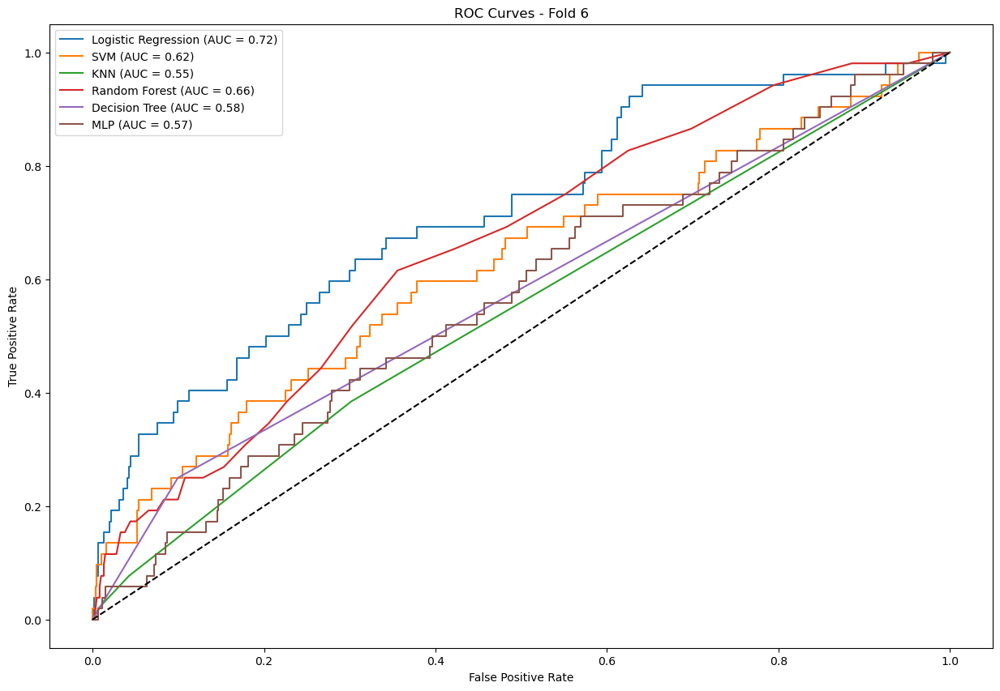

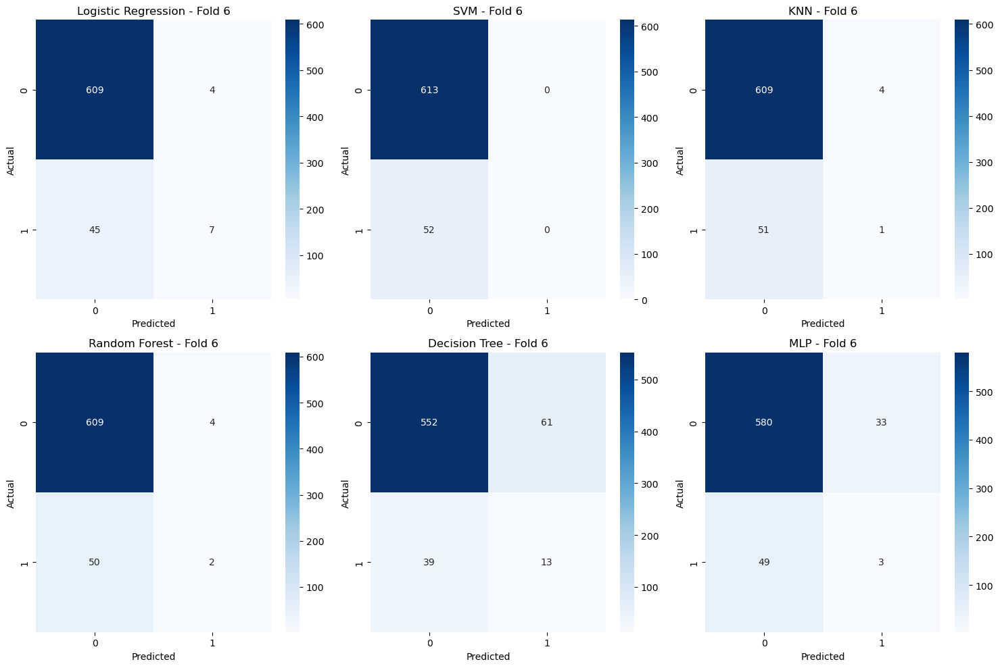

Fold 7
Model: Logistic Regression
Metrics for Logistic Regression - Fold 7:
  AUC: 0.71
  Accuracy: 0.91
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.03




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 7:
  AUC: 0.68
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 7:
  AUC: 0.56
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Random Forest
Metrics for Random Forest - Fold 7:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 1.00
  Recall: 0.04
  F1 Score: 0.07


Model: Decision Tree
Metrics for Decision Tree - Fold 7:
  AUC: 0.51
  Accuracy: 0.85
  Precision: 0.12
  Recall: 0.11
  F1 Score: 0.11


Model: MLP
Metrics for MLP - Fold 7:
  AUC: 0.68
  Accuracy: 0.87
  Precision: 0.24
  Recall: 0.23
  F1 Score: 0.23






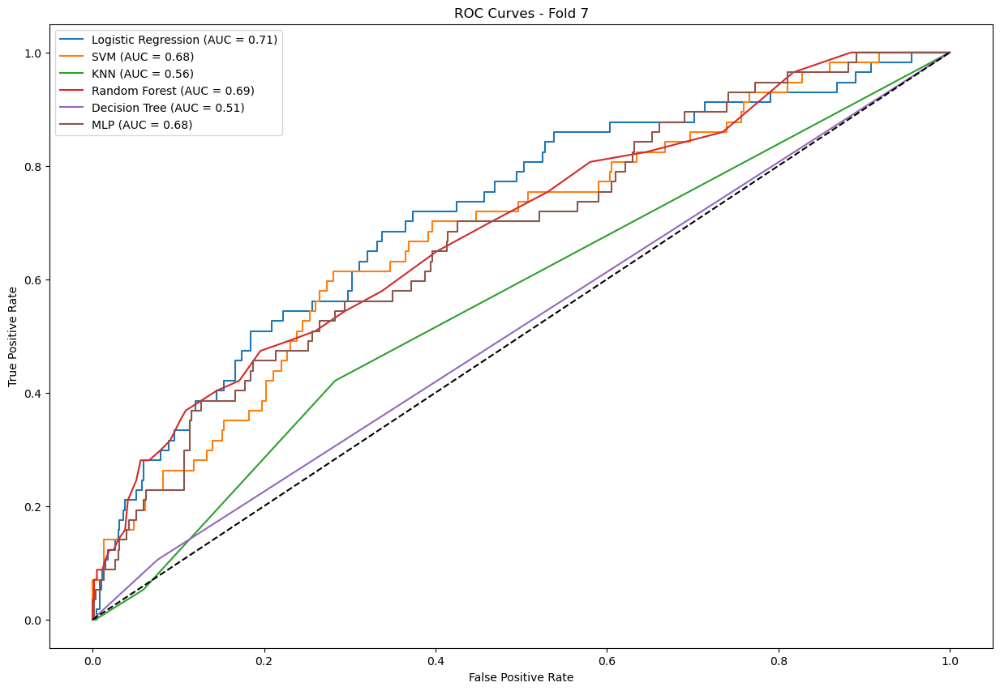

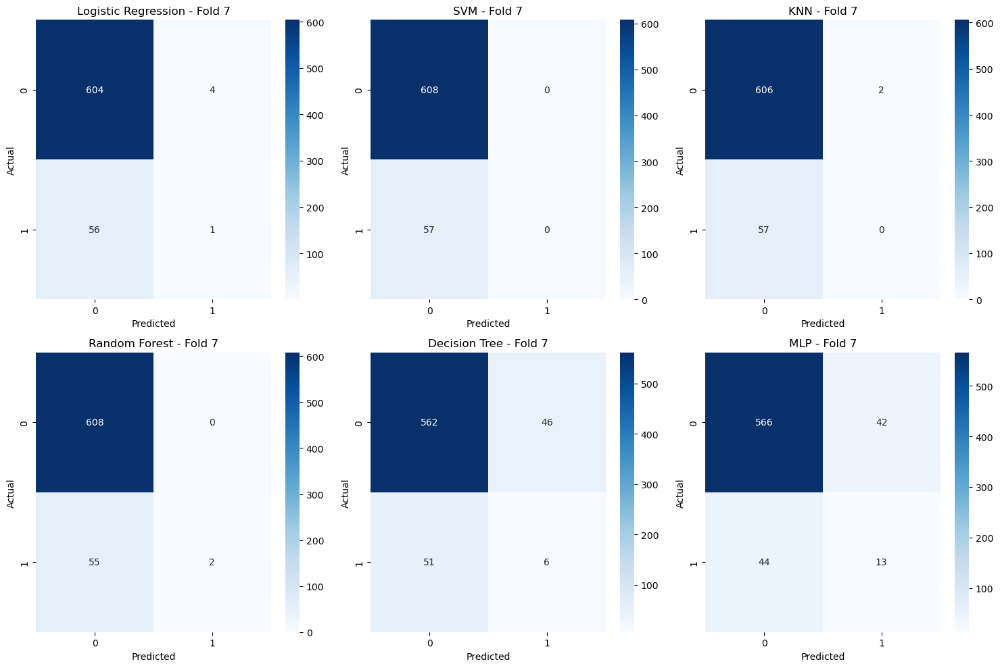

Fold 8
Model: Logistic Regression
Metrics for Logistic Regression - Fold 8:
  AUC: 0.66
  Accuracy: 0.92
  Precision: 0.67
  Recall: 0.04
  F1 Score: 0.07




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 8:
  AUC: 0.63
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 8:
  AUC: 0.58
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Random Forest
Metrics for Random Forest - Fold 8:
  AUC: 0.65
  Accuracy: 0.92
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.04


Model: Decision Tree
Metrics for Decision Tree - Fold 8:
  AUC: 0.57
  Accuracy: 0.87
  Precision: 0.19
  Recall: 0.22
  F1 Score: 0.20


Model: MLP
Metrics for MLP - Fold 8:
  AUC: 0.61
  Accuracy: 0.88
  Precision: 0.20
  Recall: 0.18
  F1 Score: 0.19






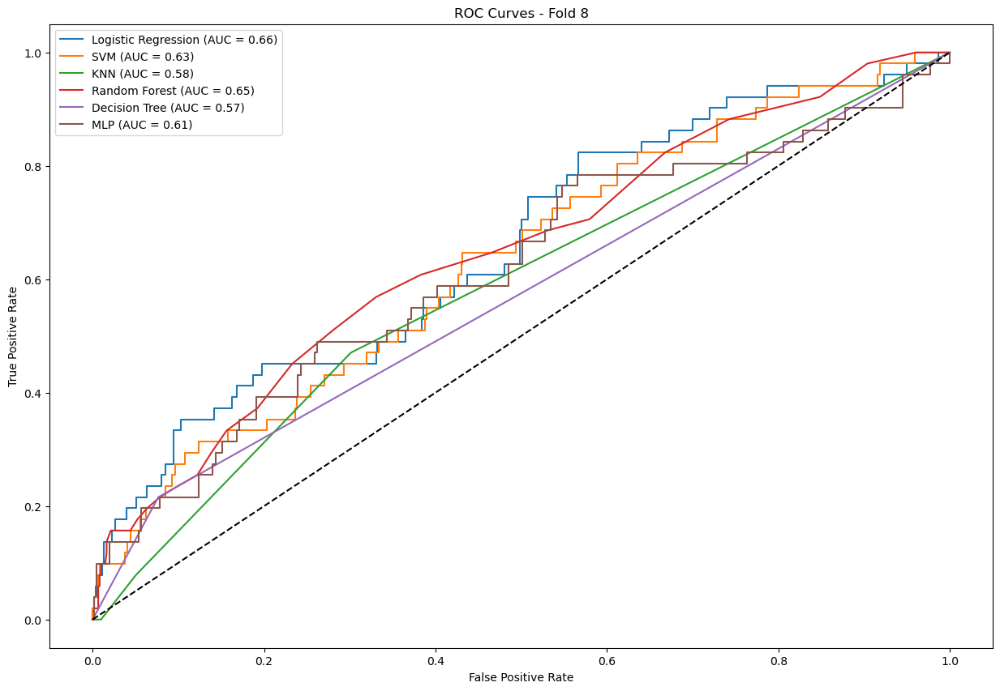

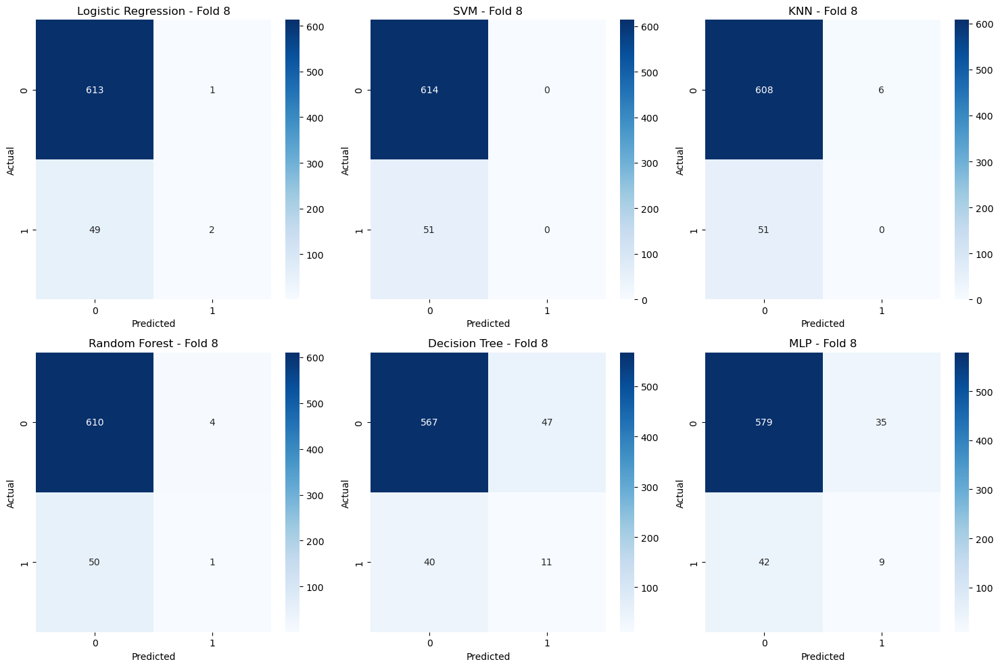

Fold 9
Model: Logistic Regression
Metrics for Logistic Regression - Fold 9:
  AUC: 0.71
  Accuracy: 0.91
  Precision: 1.00
  Recall: 0.05
  F1 Score: 0.09




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 9:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 9:
  AUC: 0.61
  Accuracy: 0.91
  Precision: 0.60
  Recall: 0.05
  F1 Score: 0.09


Model: Random Forest
Metrics for Random Forest - Fold 9:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 1.00
  Recall: 0.05
  F1 Score: 0.09


Model: Decision Tree
Metrics for Decision Tree - Fold 9:
  AUC: 0.55
  Accuracy: 0.84
  Precision: 0.18
  Recall: 0.19
  F1 Score: 0.19


Model: MLP
Metrics for MLP - Fold 9:
  AUC: 0.64
  Accuracy: 0.89
  Precision: 0.26
  Recall: 0.10
  F1 Score: 0.14






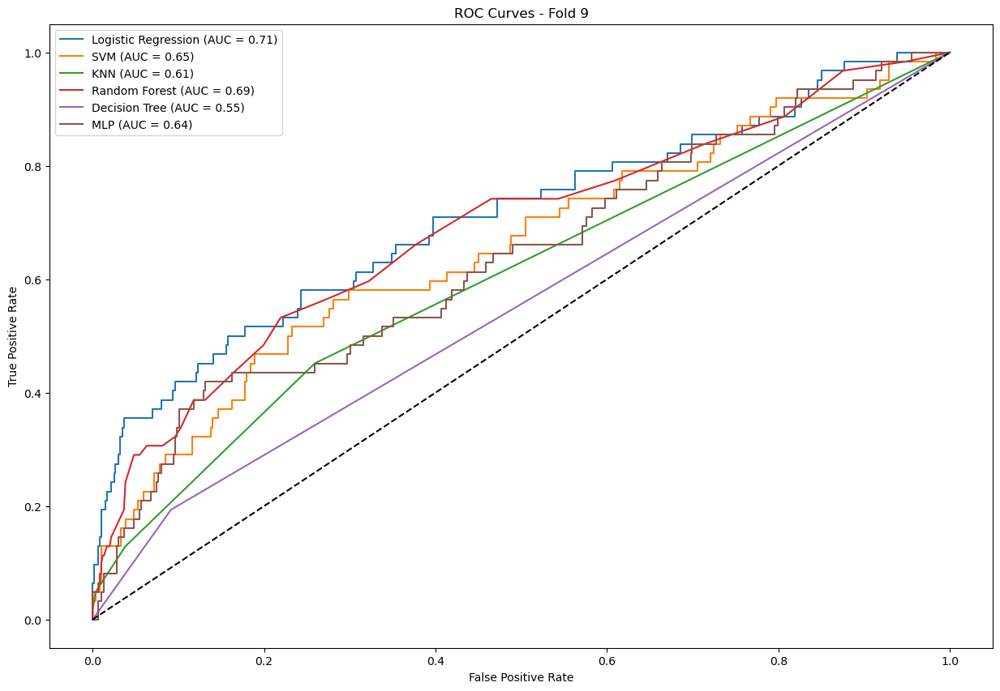

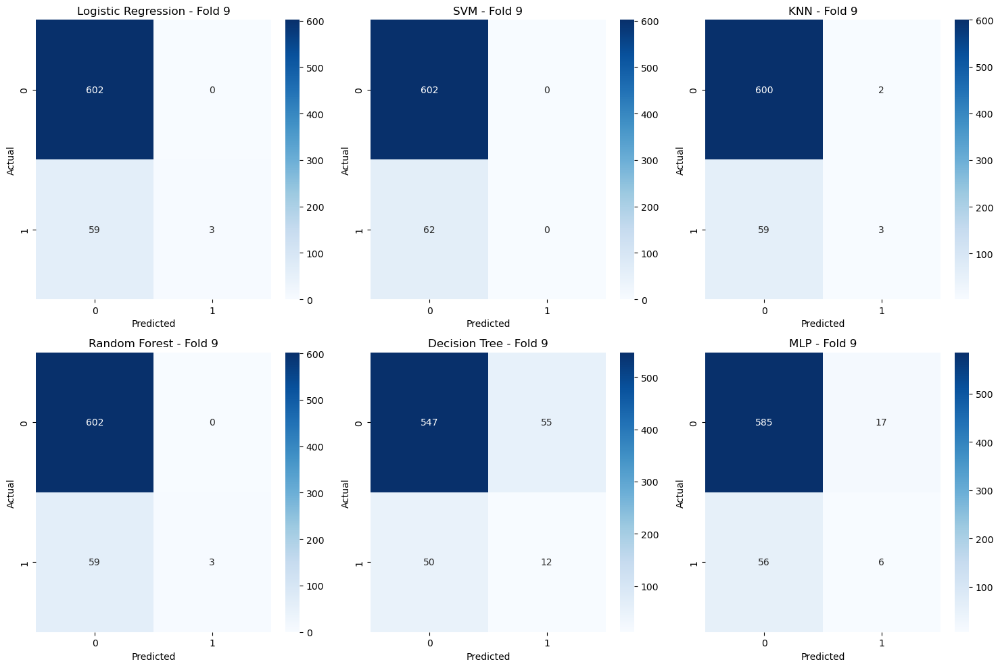

Fold 10
Model: Logistic Regression
Metrics for Logistic Regression - Fold 10:
  AUC: 0.70
  Accuracy: 0.90
  Precision: 0.33
  Recall: 0.03
  F1 Score: 0.06


Model: SVM
Metrics for SVM - Fold 10:
  AUC: 0.64
  Accuracy: 0.90
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 10:
  AUC: 0.57
  Accuracy: 0.90
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Random Forest
Metrics for Random Forest - Fold 10:
  AUC: 0.68
  Accuracy: 0.90
  Precision: 0.33
  Recall: 0.02
  F1 Score: 0.03


Model: Decision Tree
Metrics for Decision Tree - Fold 10:
  AUC: 0.50
  Accuracy: 0.82
  Precision: 0.09
  Recall: 0.10
  F1 Score: 0.09


Model: MLP
Metrics for MLP - Fold 10:
  AUC: 0.63
  Accuracy: 0.86
  Precision: 0.20
  Recall: 0.14
  F1 Score: 0.17






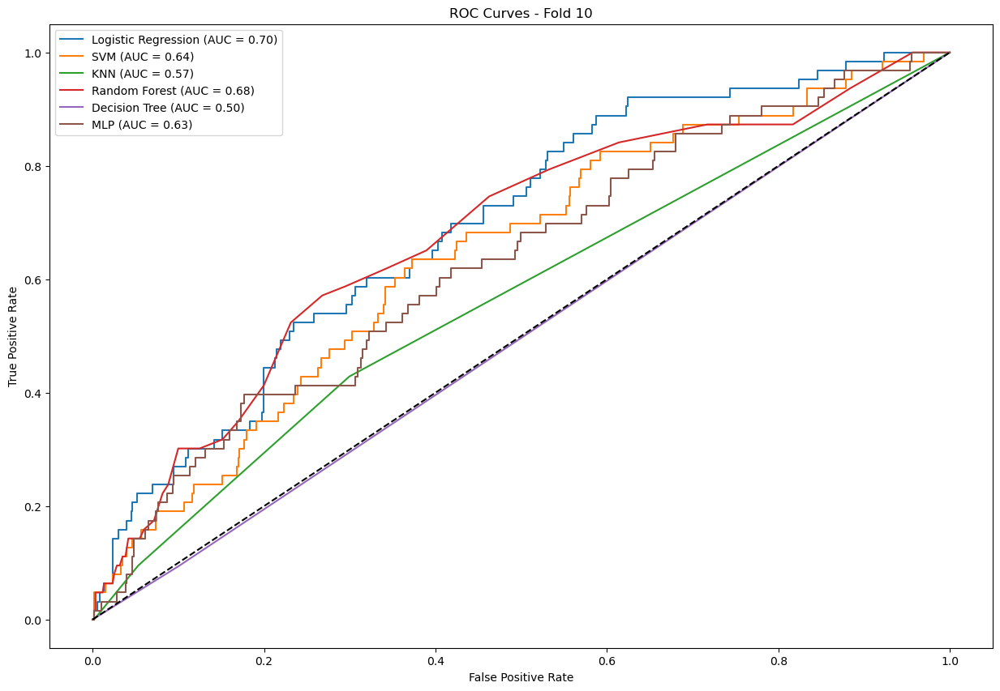

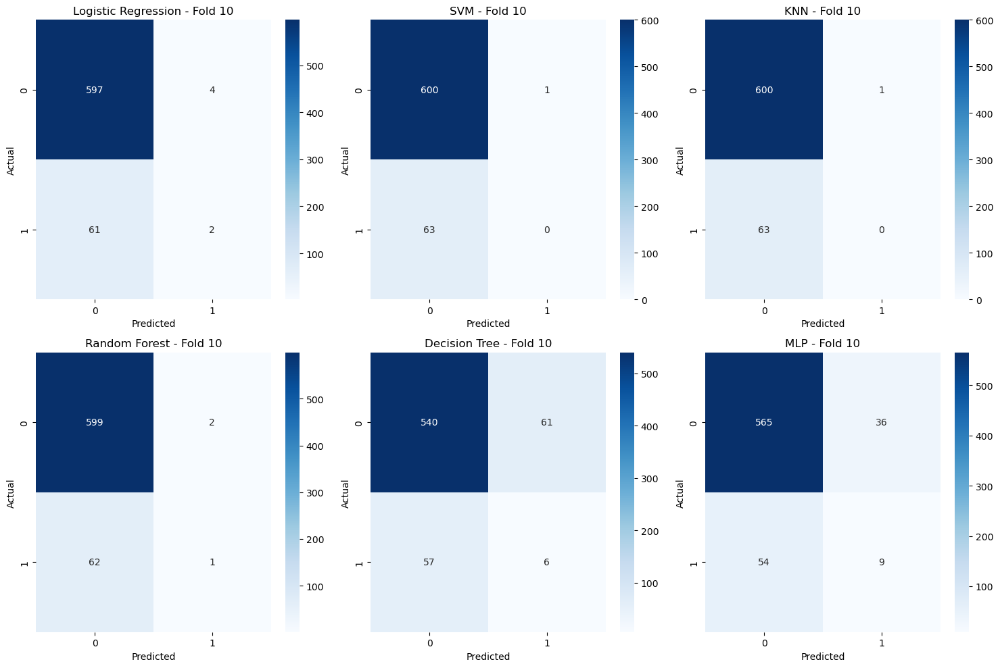

In [42]:
# Assuming X_train_new and y_train_new are your data
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize tuples to store metrics, ROC curves, and confusion matrices
metrics = {(name, fold): {'roc_auc': None, 'accuracy': None, 'precision': None, 'recall': None, 'f1': None} 
           for name in models.keys() for fold in range(1, kf.get_n_splits() + 1)}

roc_curves = {(name, fold): {'fpr': None, 'tpr': None, 'roc_auc': None} 
              for name in models.keys() for fold in range(1, kf.get_n_splits() + 1)}

conf_matrices = {(name, fold): None for name in models.keys() for fold in range(1, kf.get_n_splits() + 1)}

# Perform k-fold cross-validation - iterating over the each fold & iterate over each model for a certain fold:
for fold, (train_index, val_index) in enumerate(kf.split(X_train_new, y_train_new), 1):
    print(f"Fold {fold}")
    X_train_fold, X_val_fold = X_train_new.iloc[train_index], X_train_new.iloc[val_index]
    y_train_fold, y_val_fold = y_train_new[train_index], y_train_new[val_index]

    plt.figure(figsize=(15, 10))
    
    for name, model in models.items():
        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)
        y_prob = model.predict_proba(X_val_fold)[:, 1]

        # Calculate metrics
        roc_auc = roc_auc_score(y_val_fold, y_prob)
        accuracy = accuracy_score(y_val_fold, y_pred)
        precision = precision_score(y_val_fold, y_pred)
        recall = recall_score(y_val_fold, y_pred)
        f1 = f1_score(y_val_fold, y_pred)

        # Store metrics
        metrics[(name, fold)] = {'roc_auc': roc_auc, 'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1}

        # Calculate ROC curve
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob)
        roc_curves[(name, fold)] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

        # Calculate and store confusion matrix
        conf_matrices[(name, fold)] = confusion_matrix(y_val_fold, y_pred)

        # Print metrics for each model and fold:
        print(f"Model: {name}")
        print(f"Metrics for {name} - Fold {fold}:")
        print(f"  AUC: {roc_auc:.2f}")
        print(f"  Accuracy: {accuracy:.2f}")
        print(f"  Precision: {precision:.2f}")
        print(f"  Recall: {recall:.2f}")
        print(f"  F1 Score: {f1:.2f}")
        print('\n')

        # Plot ROC curve
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    print('\n')

    # Finalize ROC curve plot
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves - Fold {fold}')
    plt.legend(loc='best')
    plt.show()

    # Plot confusion matrices
    num_models = len(models)
    num_cols = int(np.ceil(num_models / 2))
    fig, axes = plt.subplots(nrows=2, ncols=num_cols, figsize=(15, 10))
    axes = axes.flatten()

    for i, name in enumerate(models.keys()):
        matrix = conf_matrices[(name, fold)]
        if matrix is not None:
            sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', ax=axes[i])
            axes[i].set_title(f'{name} - Fold {fold}')
            axes[i].set_xlabel('Predicted')
            axes[i].set_ylabel('Actual')
    
    plt.tight_layout()
    plt.show()

In the following piece of code (unlike the previous one), we're iterating first over the folds, and then over the models. 
Here you can see:
* Each fold's relevant metrics (specific to a certain model) - AUC, accuracy, precision, recall, F1-score (which are also within a designated metrics dataframe), confusion matrix.
* ROC curves of all folds, specific to that model.

Model Logistic Regression
Fold: 1
Metrics for Logistic Regression - Fold 1:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 2
Metrics for Logistic Regression - Fold 2:
  AUC: 0.71
  Accuracy: 0.92
  Precision: 0.67
  Recall: 0.07
  F1 Score: 0.12


Fold: 3
Metrics for Logistic Regression - Fold 3:
  AUC: 0.67
  Accuracy: 0.93
  Precision: 0.17
  Recall: 0.02
  F1 Score: 0.04


Fold: 4
Metrics for Logistic Regression - Fold 4:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 0.33
  Recall: 0.02
  F1 Score: 0.03


Fold: 5
Metrics for Logistic Regression - Fold 5:
  AUC: 0.72
  Accuracy: 0.91
  Precision: 0.80
  Recall: 0.07
  F1 Score: 0.12


Fold: 6
Metrics for Logistic Regression - Fold 6:
  AUC: 0.72
  Accuracy: 0.93
  Precision: 0.64
  Recall: 0.13
  F1 Score: 0.22


Fold: 7
Metrics for Logistic Regression - Fold 7:
  AUC: 0.71
  Accuracy: 0.91
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.03


Fold: 8
Metrics for Logistic Regression - Fold 8:
  AUC: 

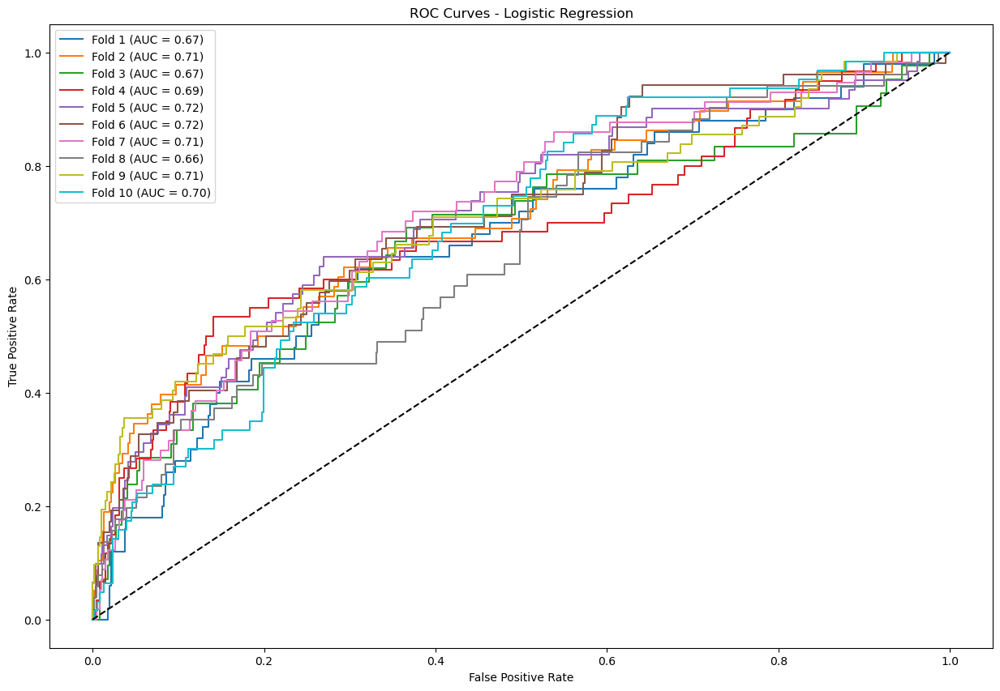

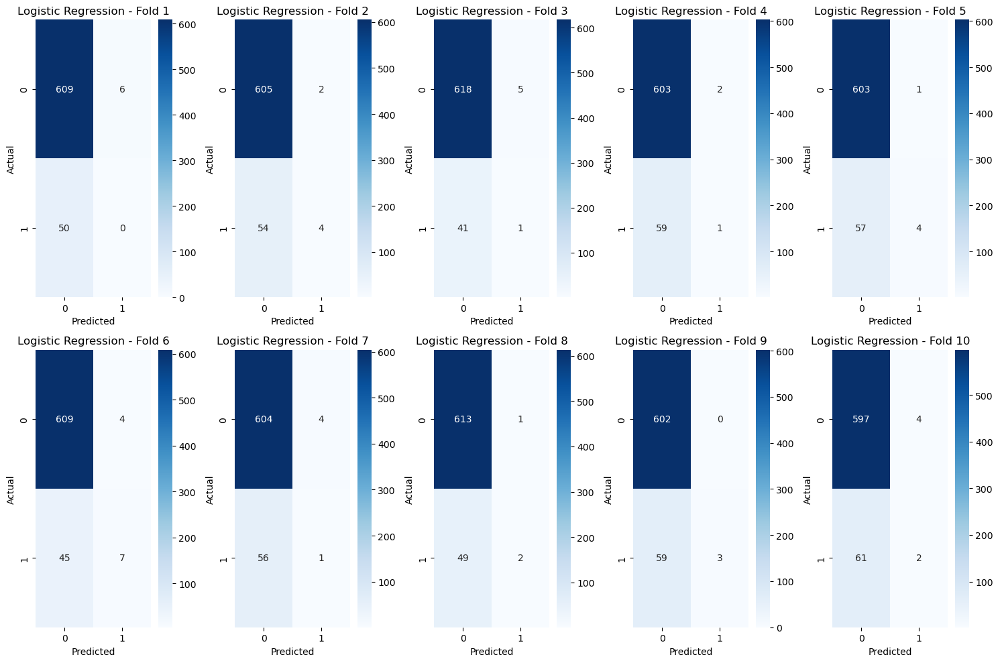

Model SVM
Fold: 1
Metrics for SVM - Fold 1:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 2
Metrics for SVM - Fold 2:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 3
Metrics for SVM - Fold 3:
  AUC: 0.59
  Accuracy: 0.94
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 4
Metrics for SVM - Fold 4:
  AUC: 0.64
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 5
Metrics for SVM - Fold 5:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 6
Metrics for SVM - Fold 6:
  AUC: 0.62
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 7
Metrics for SVM - Fold 7:
  AUC: 0.68
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 8
Metrics for SVM - Fold 8:
  AUC: 0.63
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold: 9
Metrics for SVM - Fold 9:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 10
Metrics for SVM - Fold 10:
  AUC: 0.64
  Accuracy: 0.90
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00






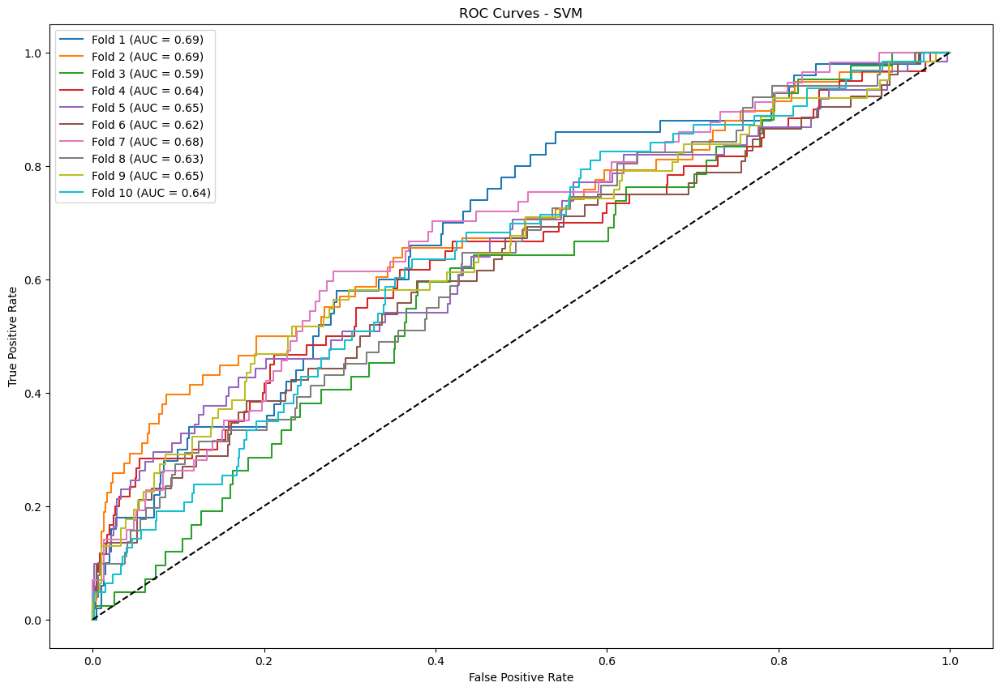

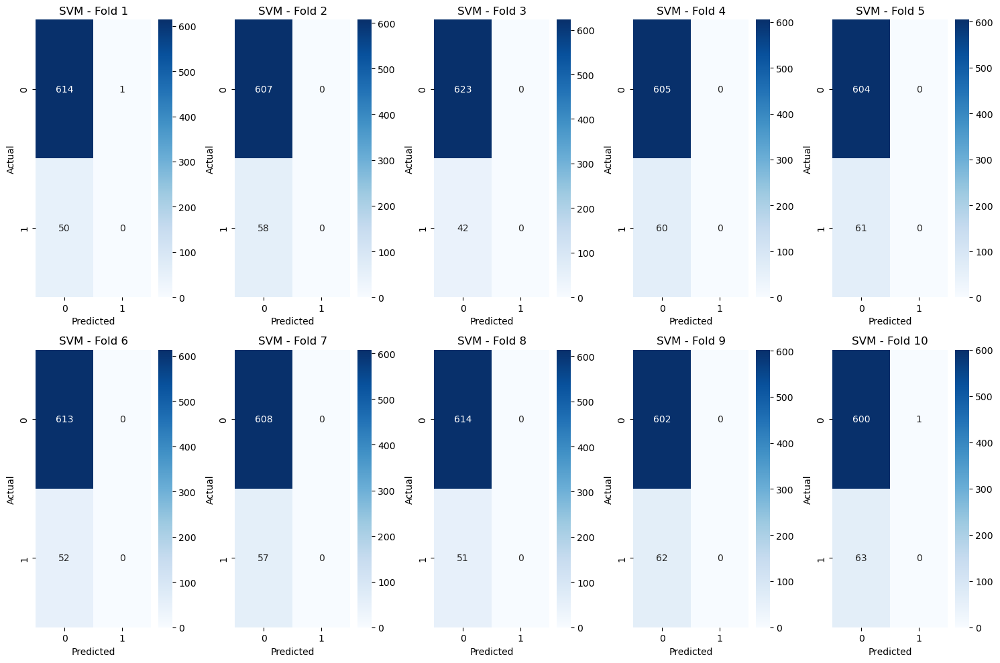

Model KNN
Fold: 1
Metrics for KNN - Fold 1:
  AUC: 0.68
  Accuracy: 0.92
  Precision: 0.40
  Recall: 0.04
  F1 Score: 0.07


Fold: 2
Metrics for KNN - Fold 2:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.25
  Recall: 0.02
  F1 Score: 0.03


Fold: 3
Metrics for KNN - Fold 3:
  AUC: 0.55
  Accuracy: 0.93
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 4
Metrics for KNN - Fold 4:
  AUC: 0.62
  Accuracy: 0.91
  Precision: 0.40
  Recall: 0.03
  F1 Score: 0.06


Fold: 5
Metrics for KNN - Fold 5:
  AUC: 0.58
  Accuracy: 0.91
  Precision: 0.50
  Recall: 0.03
  F1 Score: 0.06


Fold: 6
Metrics for KNN - Fold 6:
  AUC: 0.55
  Accuracy: 0.92
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.04


Fold: 7
Metrics for KNN - Fold 7:
  AUC: 0.56
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 8
Metrics for KNN - Fold 8:
  AUC: 0.58
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 9
Metrics for KNN - Fold 9:
  AUC: 0.61
  Accuracy: 0.91
  Preci

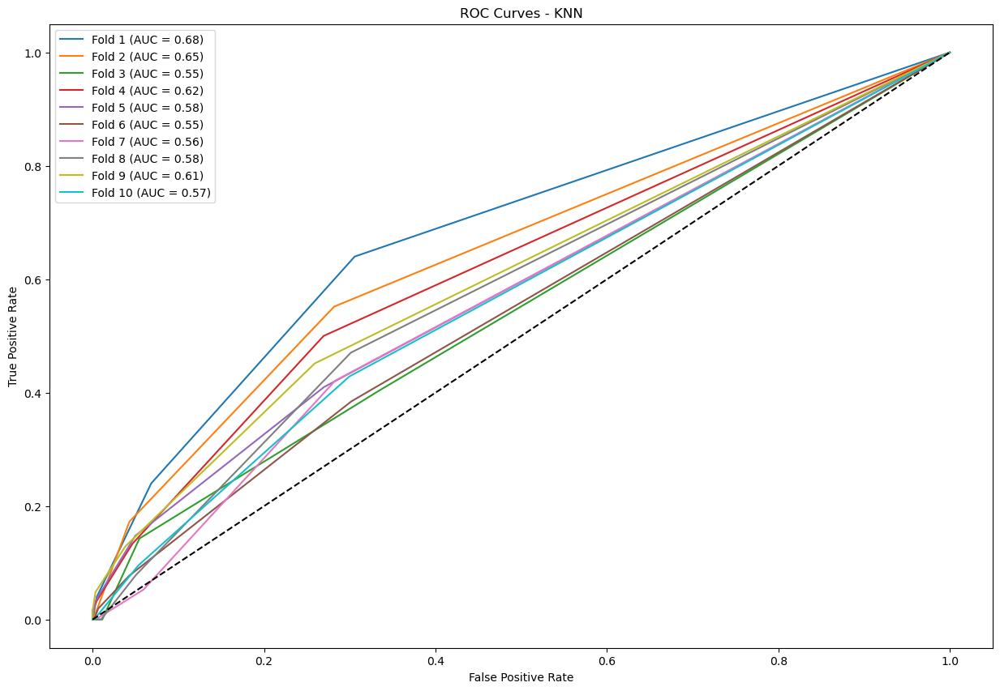

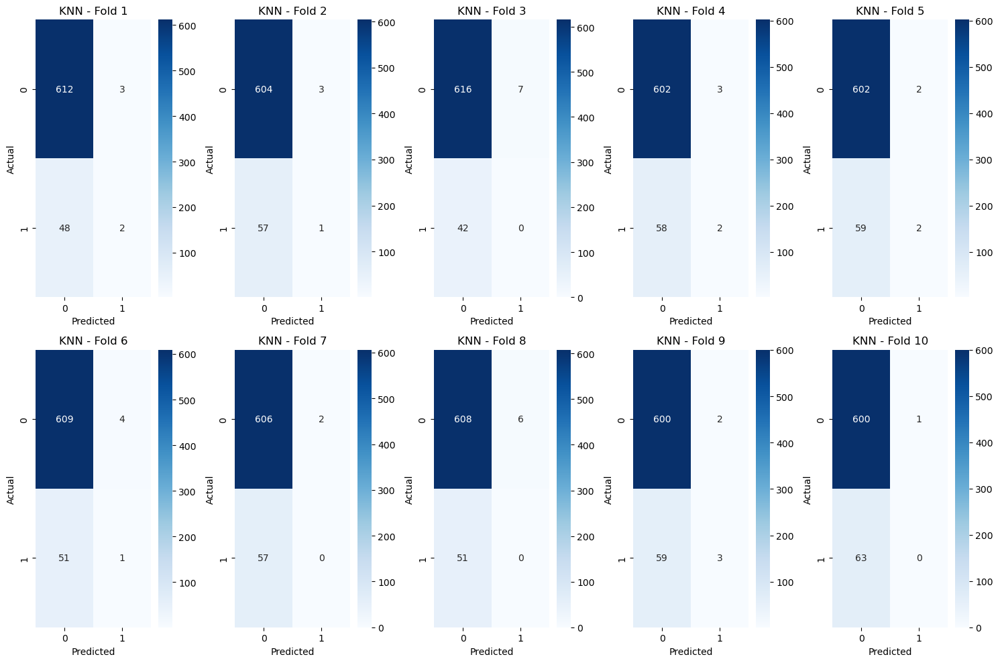

Model Random Forest
Fold: 1
Metrics for Random Forest - Fold 1:
  AUC: 0.72
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 2
Metrics for Random Forest - Fold 2:
  AUC: 0.71
  Accuracy: 0.91
  Precision: 0.50
  Recall: 0.03
  F1 Score: 0.06


Fold: 3
Metrics for Random Forest - Fold 3:
  AUC: 0.66
  Accuracy: 0.93
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Fold: 4
Metrics for Random Forest - Fold 4:
  AUC: 0.67
  Accuracy: 0.91
  Precision: 1.00
  Recall: 0.02
  F1 Score: 0.03


Fold: 5
Metrics for Random Forest - Fold 5:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.67
  Recall: 0.03
  F1 Score: 0.06


Fold: 6
Metrics for Random Forest - Fold 6:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.33
  Recall: 0.02
  F1 Score: 0.04


Fold: 7
Metrics for Random Forest - Fold 7:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 0.67
  Recall: 0.04
  F1 Score: 0.07


Fold: 8
Metrics for Random Forest - Fold 8:
  AUC: 0.66
  Accuracy: 0.92
  Precision: 0.33
  Recall: 0.02

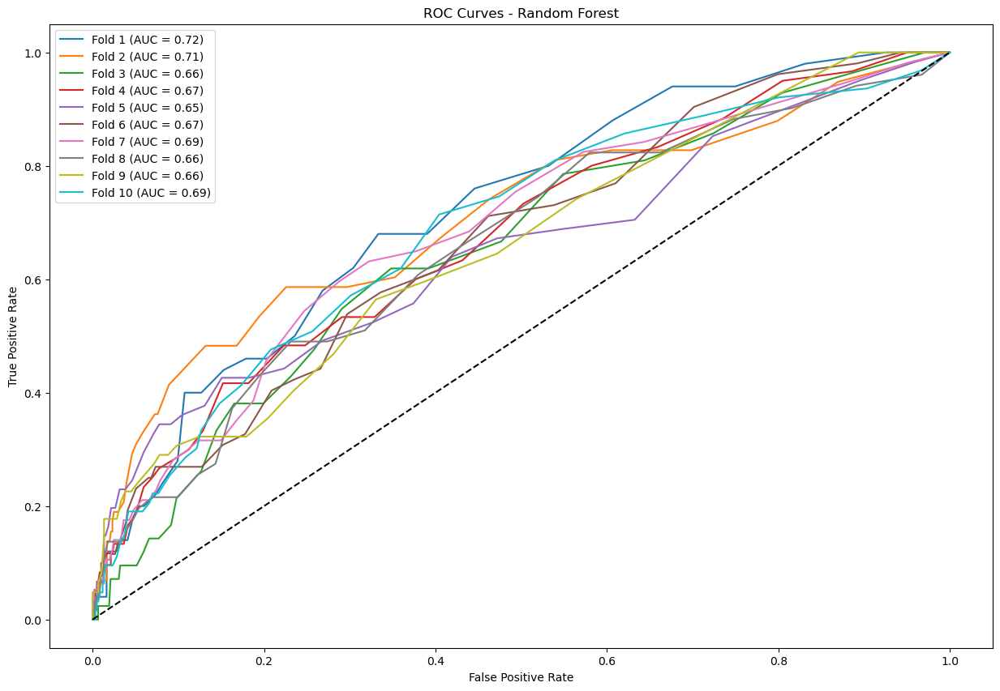

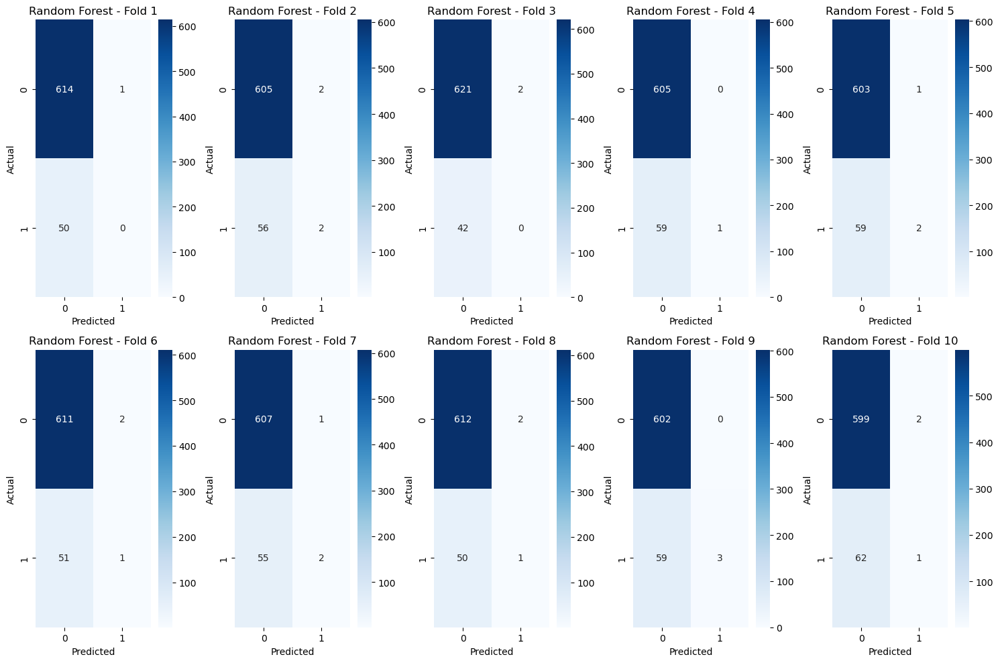

Model Decision Tree
Fold: 1
Metrics for Decision Tree - Fold 1:
  AUC: 0.51
  Accuracy: 0.84
  Precision: 0.08
  Recall: 0.12
  F1 Score: 0.10


Fold: 2
Metrics for Decision Tree - Fold 2:
  AUC: 0.60
  Accuracy: 0.85
  Precision: 0.22
  Recall: 0.29
  F1 Score: 0.25


Fold: 3
Metrics for Decision Tree - Fold 3:
  AUC: 0.53
  Accuracy: 0.87
  Precision: 0.10
  Recall: 0.14
  F1 Score: 0.12


Fold: 4
Metrics for Decision Tree - Fold 4:
  AUC: 0.52
  Accuracy: 0.83
  Precision: 0.12
  Recall: 0.13
  F1 Score: 0.13


Fold: 5
Metrics for Decision Tree - Fold 5:
  AUC: 0.55
  Accuracy: 0.84
  Precision: 0.18
  Recall: 0.20
  F1 Score: 0.19


Fold: 6
Metrics for Decision Tree - Fold 6:
  AUC: 0.56
  Accuracy: 0.86
  Precision: 0.17
  Recall: 0.21
  F1 Score: 0.19


Fold: 7
Metrics for Decision Tree - Fold 7:
  AUC: 0.52
  Accuracy: 0.85
  Precision: 0.12
  Recall: 0.12
  F1 Score: 0.12


Fold: 8
Metrics for Decision Tree - Fold 8:
  AUC: 0.54
  Accuracy: 0.87
  Precision: 0.15
  Recall: 0.16

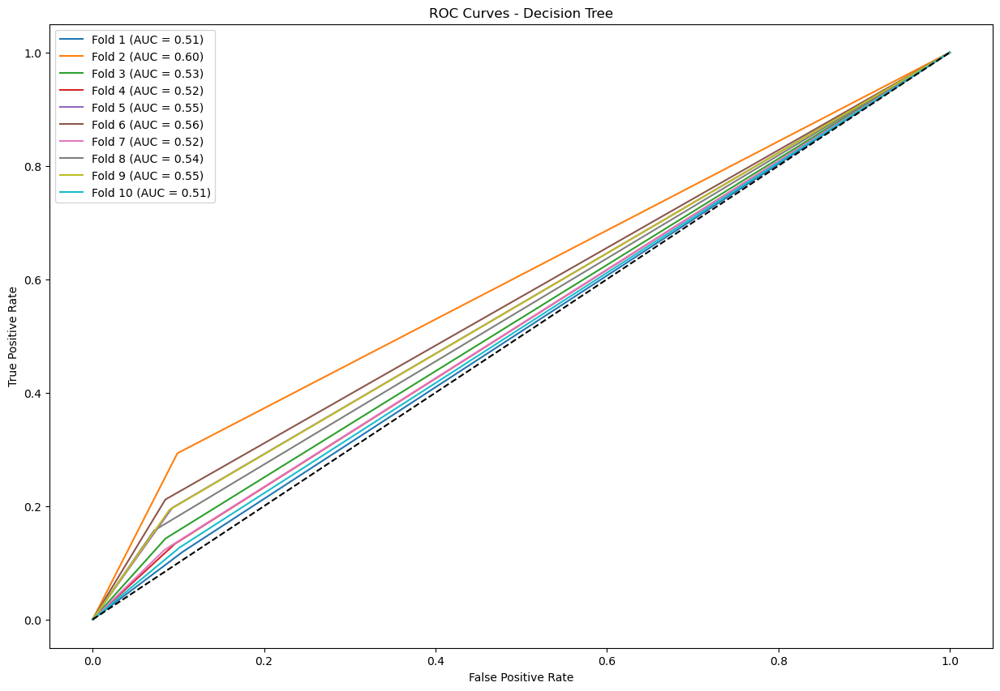

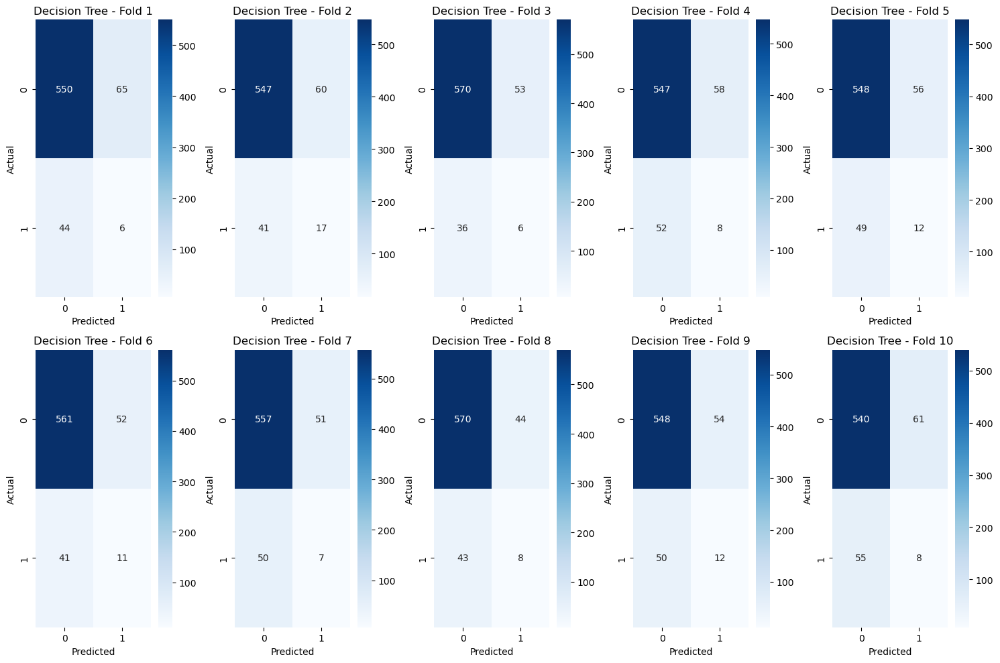

Model MLP
Fold: 1
Metrics for MLP - Fold 1:
  AUC: 0.65
  Accuracy: 0.88
  Precision: 0.20
  Recall: 0.20
  F1 Score: 0.20


Fold: 2
Metrics for MLP - Fold 2:
  AUC: 0.67
  Accuracy: 0.87
  Precision: 0.20
  Recall: 0.16
  F1 Score: 0.17


Fold: 3
Metrics for MLP - Fold 3:
  AUC: 0.59
  Accuracy: 0.89
  Precision: 0.11
  Recall: 0.10
  F1 Score: 0.10


Fold: 4
Metrics for MLP - Fold 4:
  AUC: 0.60
  Accuracy: 0.88
  Precision: 0.23
  Recall: 0.15
  F1 Score: 0.18


Fold: 5
Metrics for MLP - Fold 5:
  AUC: 0.61
  Accuracy: 0.88
  Precision: 0.26
  Recall: 0.18
  F1 Score: 0.21


Fold: 6
Metrics for MLP - Fold 6:
  AUC: 0.55
  Accuracy: 0.88
  Precision: 0.10
  Recall: 0.08
  F1 Score: 0.09


Fold: 7
Metrics for MLP - Fold 7:
  AUC: 0.65
  Accuracy: 0.87
  Precision: 0.21
  Recall: 0.18
  F1 Score: 0.19


Fold: 8
Metrics for MLP - Fold 8:
  AUC: 0.59
  Accuracy: 0.90
  Precision: 0.26
  Recall: 0.20
  F1 Score: 0.22


Fold: 9
Metrics for MLP - Fold 9:
  AUC: 0.64
  Accuracy: 0.88
  Preci

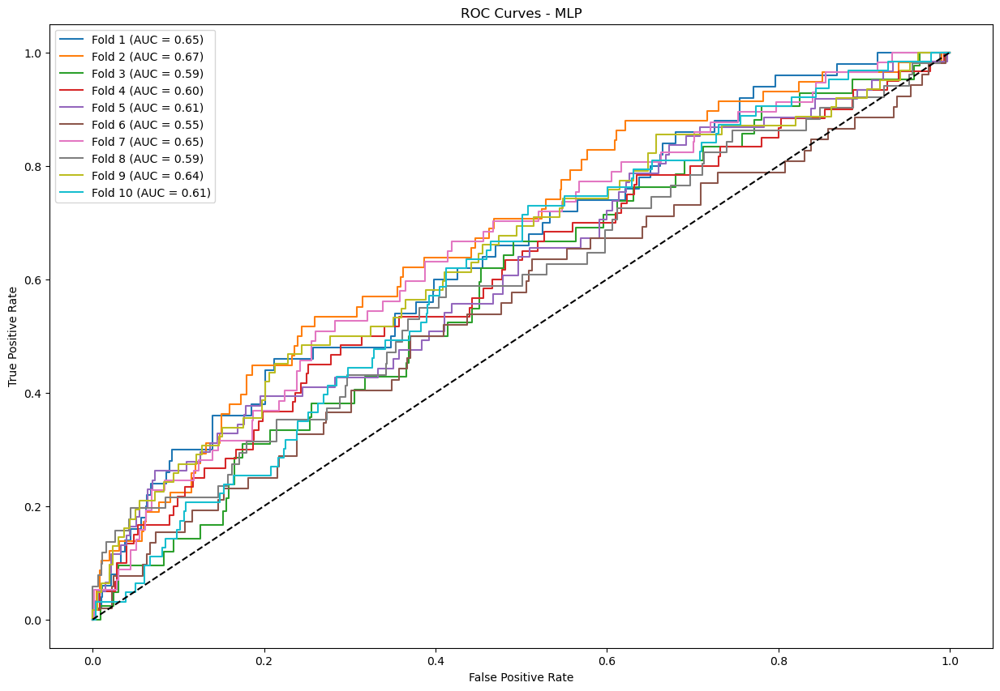

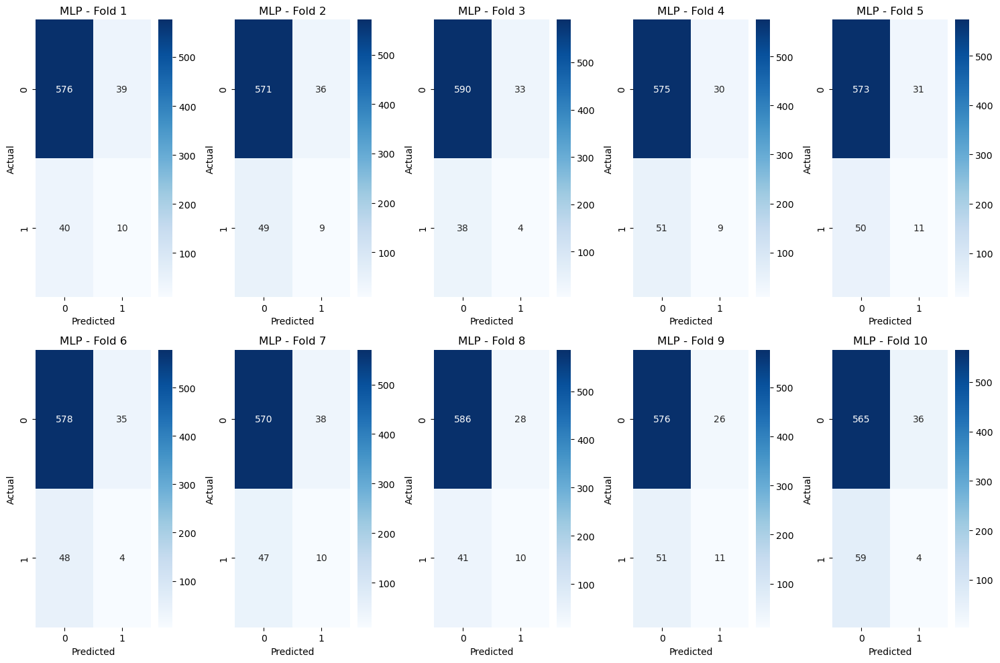

In [43]:
# Assuming X_train_new and y_train_new are your data
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize tuples to store metrics, ROC curves, and confusion matrices
metrics = {(name, fold): {'roc_auc': None, 'accuracy': None, 'precision': None, 'recall': None, 'f1': None} 
           for name in models.keys() for fold in range(1, kf.get_n_splits() + 1)}

roc_curves = {(name, fold): {'fpr': None, 'tpr': None, 'roc_auc': None} 
              for name in models.keys() for fold in range(1, kf.get_n_splits() + 1)}

conf_matrices = {(name, fold): None for name in models.keys() for fold in range(1, kf.get_n_splits() + 1)}

# Perform k-fold cross-validation - now iterating over the each model & iterate over each fold for a certain model:
for name, model in models.items():
    print(f"Model {name}")

    plt.figure(figsize=(15, 10))
    
    for fold, (train_index, val_index) in enumerate(kf.split(X_train_new, y_train_new), 1):
        X_train_fold, X_val_fold = X_train_new.iloc[train_index], X_train_new.iloc[val_index]
        y_train_fold, y_val_fold = y_train_new[train_index], y_train_new[val_index]
        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)
        y_prob = model.predict_proba(X_val_fold)[:, 1]

        # Calculate metrics
        roc_auc = roc_auc_score(y_val_fold, y_prob)
        accuracy = accuracy_score(y_val_fold, y_pred)
        precision = precision_score(y_val_fold, y_pred)
        recall = recall_score(y_val_fold, y_pred)
        f1 = f1_score(y_val_fold, y_pred)

        # Store metrics
        metrics[(name, fold)] = {'roc_auc': roc_auc, 'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1}

        # Calculate ROC curve
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob)
        roc_curves[(name, fold)] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

        # Calculate and store confusion matrix
        conf_matrices[(name, fold)] = confusion_matrix(y_val_fold, y_pred)

        # Print metrics for each model and fold:
        print(f"Fold: {fold}")
        print(f"Metrics for {name} - Fold {fold}:")
        print(f"  AUC: {roc_auc:.2f}")
        print(f"  Accuracy: {accuracy:.2f}")
        print(f"  Precision: {precision:.2f}")
        print(f"  Recall: {recall:.2f}")
        print(f"  F1 Score: {f1:.2f}")
        print('\n')

        # Plot ROC curve
        plt.plot(fpr, tpr, label=f'Fold {fold} (AUC = {roc_auc:.2f})')
    print('\n')

    # Finalize ROC curve plot
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves - {name}')
    plt.legend(loc='best')
    plt.show()

    # Plot confusion matrices for each fold
    num_folds = kf.get_n_splits()
    num_cols = int(np.ceil(num_folds / 2))
    fig, axes = plt.subplots(nrows=2, ncols=num_cols, figsize=(15, 10))
    axes = axes.flatten()

    for i, fold in enumerate(range(1, num_folds + 1)):
        matrix = conf_matrices[(name, fold)]
        if matrix is not None:
            sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', ax=axes[i])
            axes[i].set_title(f'{name} - Fold {fold}')
            axes[i].set_xlabel('Predicted')
            axes[i].set_ylabel('Actual')

    plt.tight_layout()
    plt.show()

### Stratified K Fold Cross Validation:

The following piece of code will include the same outputs as before (the K-Fold Cross Validation code), but on stratified K-Fold Cross Validation instead (with the same K = 10).

Fold 1
Model: Logistic Regression
Metrics for Logistic Regression - Fold 1:
  AUC: 0.70
  Accuracy: 0.92
  Precision: 0.67
  Recall: 0.04
  F1 Score: 0.07




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 1:
  AUC: 0.62
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 1:
  AUC: 0.55
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Random Forest
Metrics for Random Forest - Fold 1:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.40
  Recall: 0.04
  F1 Score: 0.07


Model: Decision Tree
Metrics for Decision Tree - Fold 1:
  AUC: 0.51
  Accuracy: 0.85
  Precision: 0.10
  Recall: 0.09
  F1 Score: 0.09


Model: MLP
Metrics for MLP - Fold 1:
  AUC: 0.62
  Accuracy: 0.88
  Precision: 0.16
  Recall: 0.11
  F1 Score: 0.13






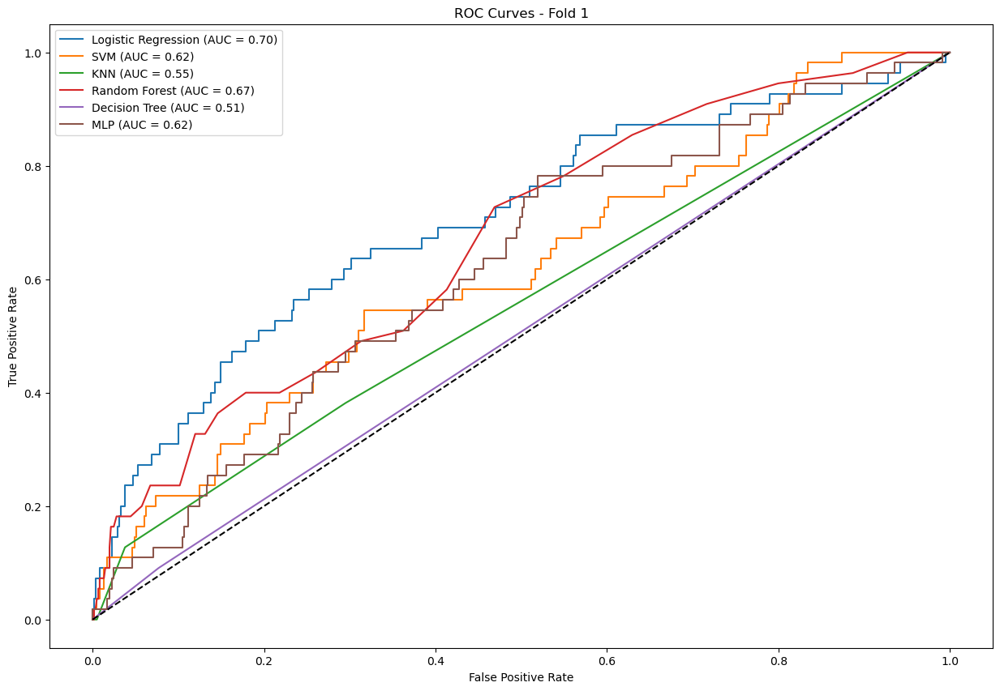

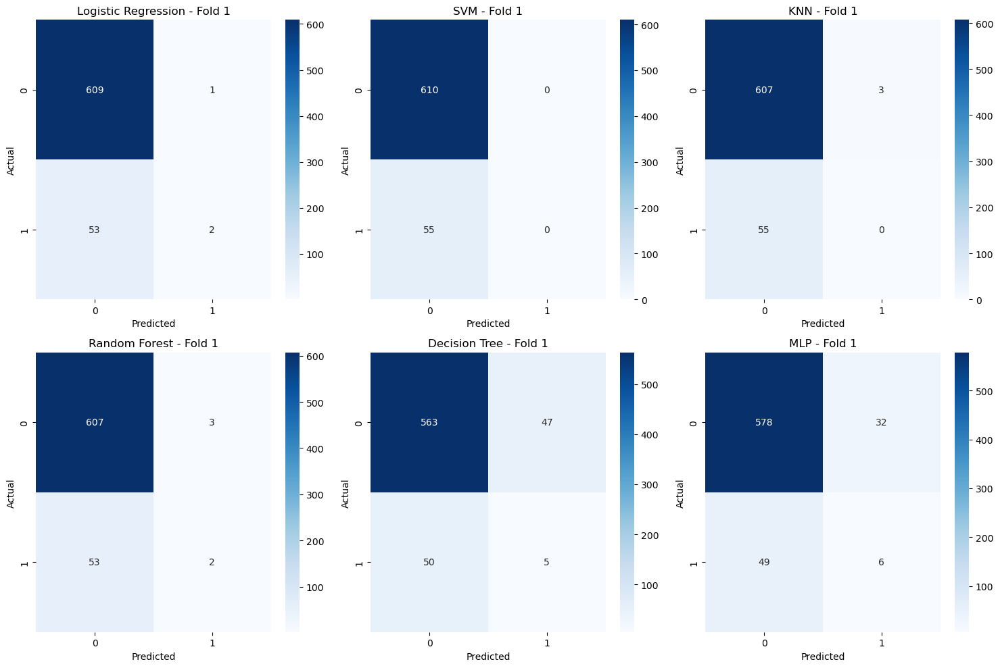

Fold 2
Model: Logistic Regression
Metrics for Logistic Regression - Fold 2:
  AUC: 0.62
  Accuracy: 0.92
  Precision: 1.00
  Recall: 0.02
  F1 Score: 0.04




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 2:
  AUC: 0.54
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 2:
  AUC: 0.54
  Accuracy: 0.92
  Precision: 1.00
  Recall: 0.02
  F1 Score: 0.04


Model: Random Forest
Metrics for Random Forest - Fold 2:
  AUC: 0.56
  Accuracy: 0.92
  Precision: 1.00
  Recall: 0.02
  F1 Score: 0.04


Model: Decision Tree
Metrics for Decision Tree - Fold 2:
  AUC: 0.50
  Accuracy: 0.85
  Precision: 0.08
  Recall: 0.07
  F1 Score: 0.07


Model: MLP
Metrics for MLP - Fold 2:
  AUC: 0.57
  Accuracy: 0.89
  Precision: 0.18
  Recall: 0.11
  F1 Score: 0.14






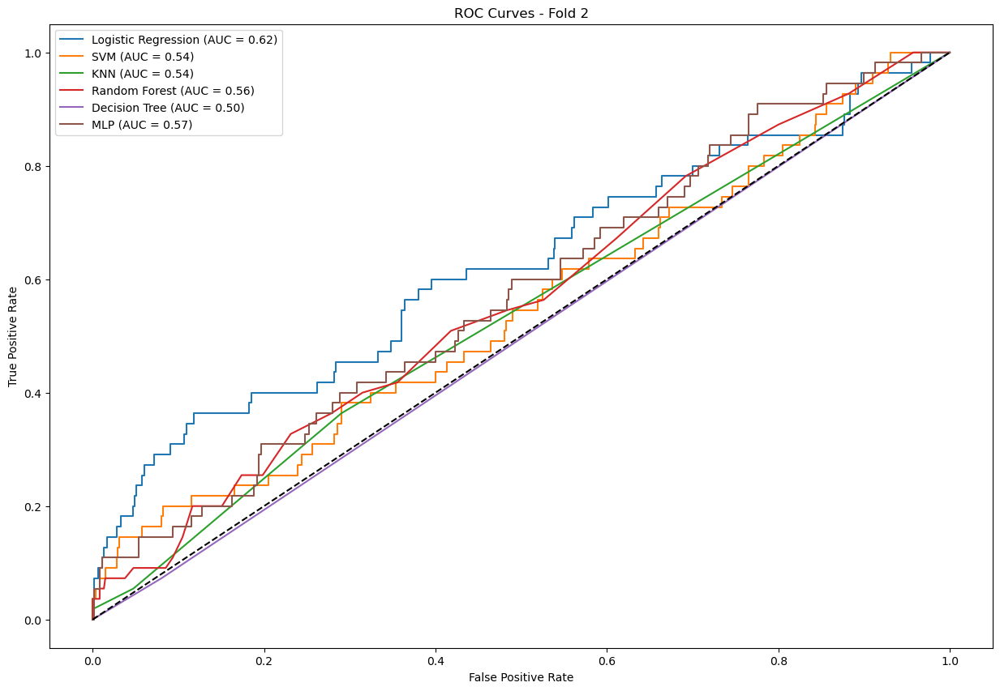

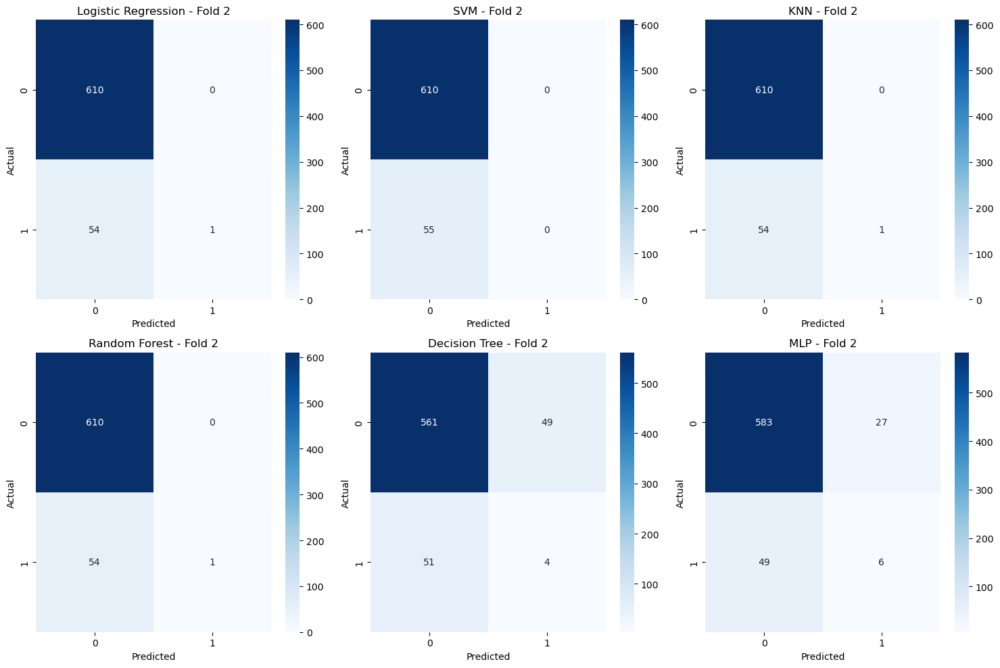

Fold 3
Model: Logistic Regression
Metrics for Logistic Regression - Fold 3:
  AUC: 0.72
  Accuracy: 0.91
  Precision: 0.20
  Recall: 0.04
  F1 Score: 0.06


Model: SVM
Metrics for SVM - Fold 3:
  AUC: 0.66
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 3:
  AUC: 0.61
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Random Forest
Metrics for Random Forest - Fold 3:
  AUC: 0.64
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Decision Tree
Metrics for Decision Tree - Fold 3:
  AUC: 0.55
  Accuracy: 0.83
  Precision: 0.15
  Recall: 0.21
  F1 Score: 0.18


Model: MLP
Metrics for MLP - Fold 3:
  AUC: 0.64
  Accuracy: 0.89
  Precision: 0.28
  Recall: 0.23
  F1 Score: 0.25






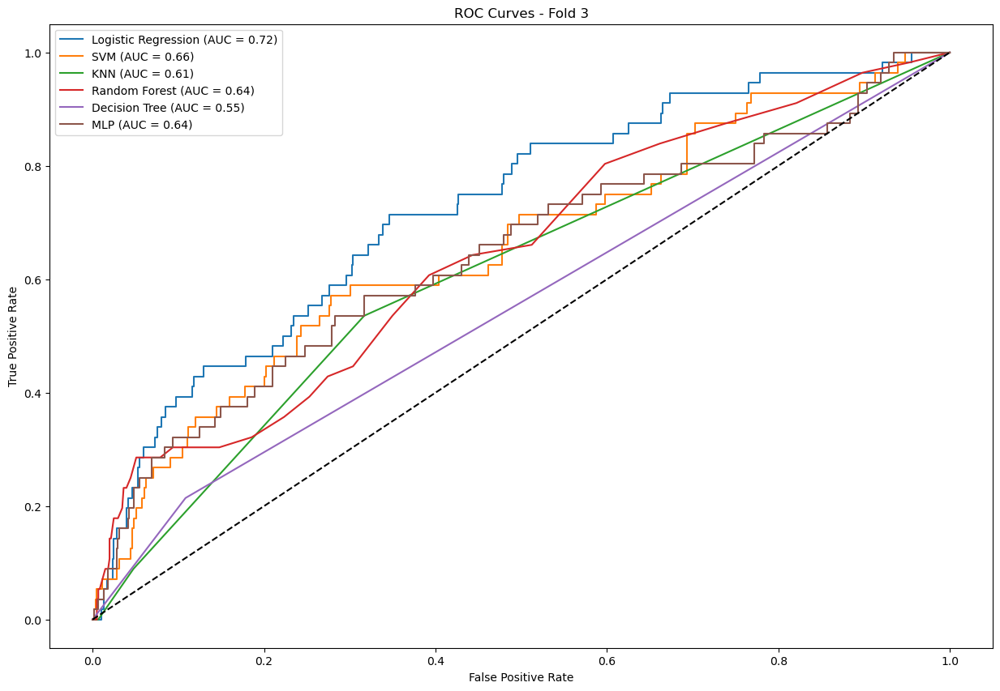

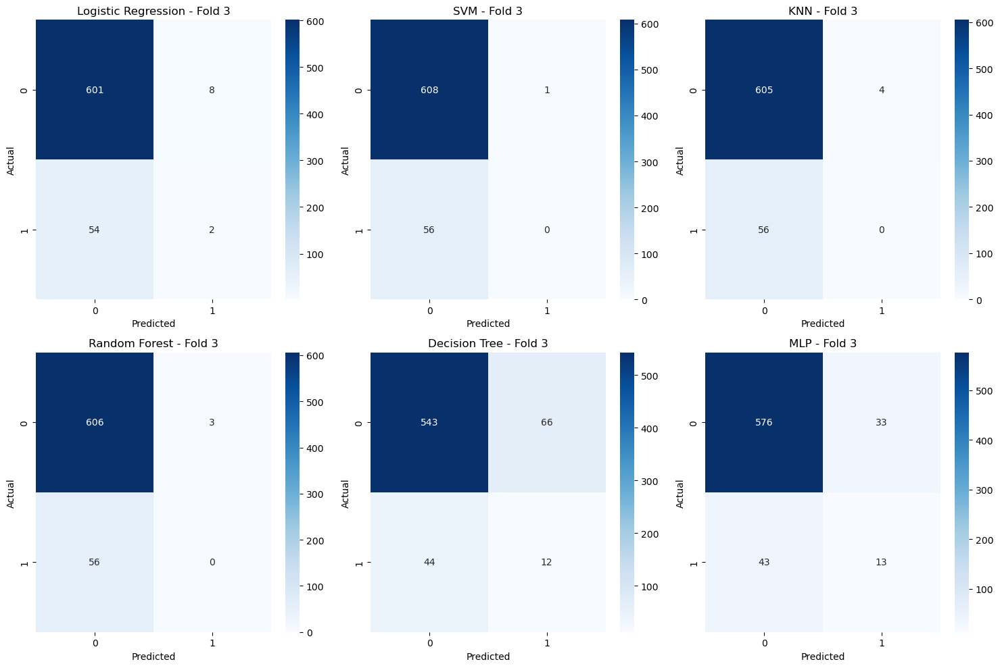

Fold 4
Model: Logistic Regression
Metrics for Logistic Regression - Fold 4:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.56
  Recall: 0.09
  F1 Score: 0.15




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 4:
  AUC: 0.71
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 4:
  AUC: 0.55
  Accuracy: 0.91
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.03


Model: Random Forest
Metrics for Random Forest - Fold 4:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 0.67
  Recall: 0.11
  F1 Score: 0.18


Model: Decision Tree
Metrics for Decision Tree - Fold 4:
  AUC: 0.52
  Accuracy: 0.85
  Precision: 0.12
  Recall: 0.12
  F1 Score: 0.12


Model: MLP
Metrics for MLP - Fold 4:
  AUC: 0.65
  Accuracy: 0.88
  Precision: 0.27
  Recall: 0.21
  F1 Score: 0.24






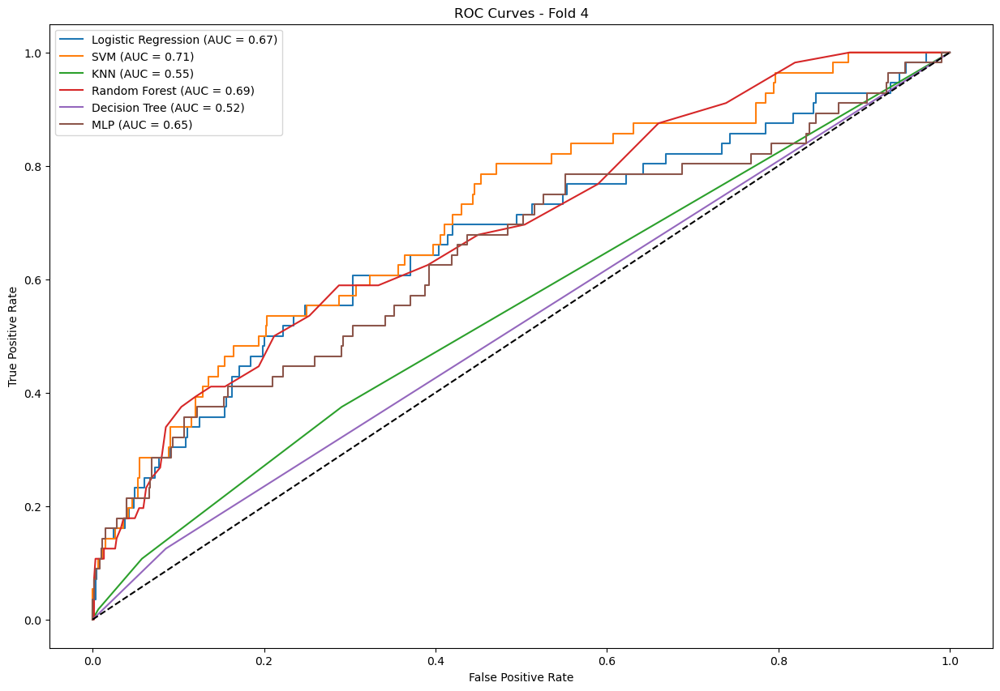

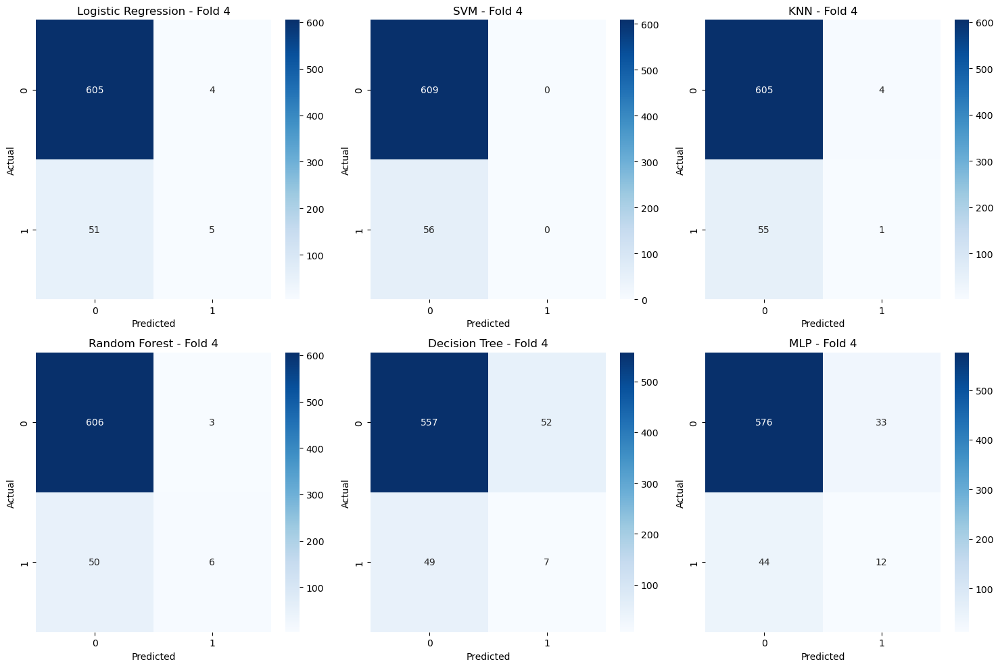

Fold 5
Model: Logistic Regression
Metrics for Logistic Regression - Fold 5:
  AUC: 0.71
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 5:
  AUC: 0.68
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 5:
  AUC: 0.60
  Accuracy: 0.91
  Precision: 0.25
  Recall: 0.02
  F1 Score: 0.03


Model: Random Forest
Metrics for Random Forest - Fold 5:
  AUC: 0.69
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Decision Tree
Metrics for Decision Tree - Fold 5:
  AUC: 0.56
  Accuracy: 0.85
  Precision: 0.17
  Recall: 0.21
  F1 Score: 0.19


Model: MLP
Metrics for MLP - Fold 5:
  AUC: 0.63
  Accuracy: 0.89
  Precision: 0.23
  Recall: 0.14
  F1 Score: 0.18






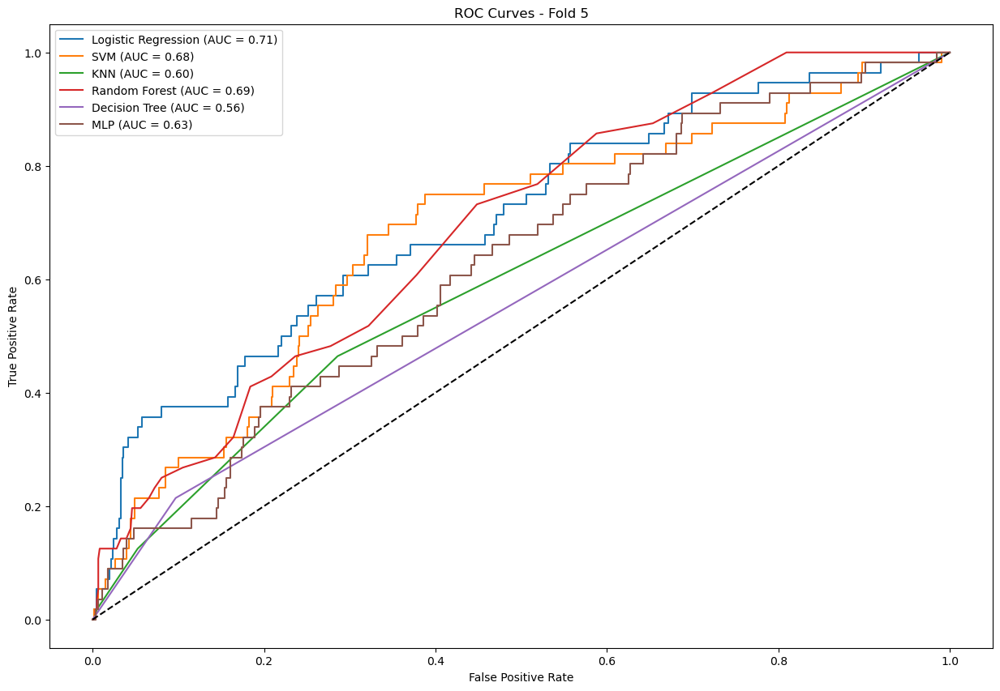

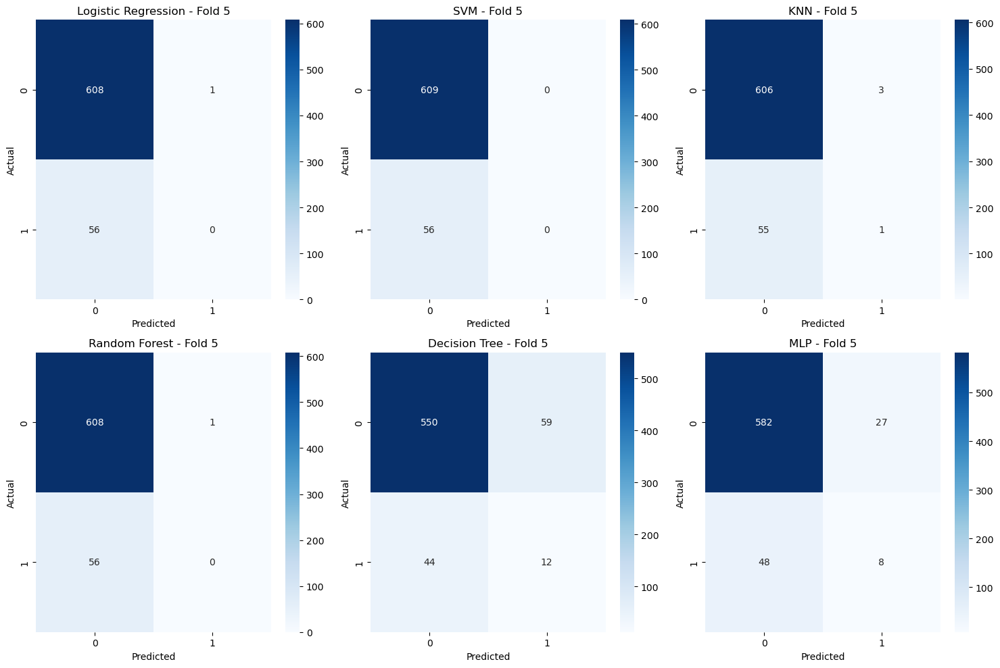

Fold 6
Model: Logistic Regression
Metrics for Logistic Regression - Fold 6:
  AUC: 0.71
  Accuracy: 0.92
  Precision: 0.60
  Recall: 0.05
  F1 Score: 0.10




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 6:
  AUC: 0.68
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 6:
  AUC: 0.59
  Accuracy: 0.92
  Precision: 0.50
  Recall: 0.02
  F1 Score: 0.03


Model: Random Forest
Metrics for Random Forest - Fold 6:
  AUC: 0.73
  Accuracy: 0.91
  Precision: 0.25
  Recall: 0.02
  F1 Score: 0.03


Model: Decision Tree
Metrics for Decision Tree - Fold 6:
  AUC: 0.57
  Accuracy: 0.85
  Precision: 0.19
  Recall: 0.23
  F1 Score: 0.21


Model: MLP
Metrics for MLP - Fold 6:
  AUC: 0.63
  Accuracy: 0.87
  Precision: 0.19
  Recall: 0.16
  F1 Score: 0.17






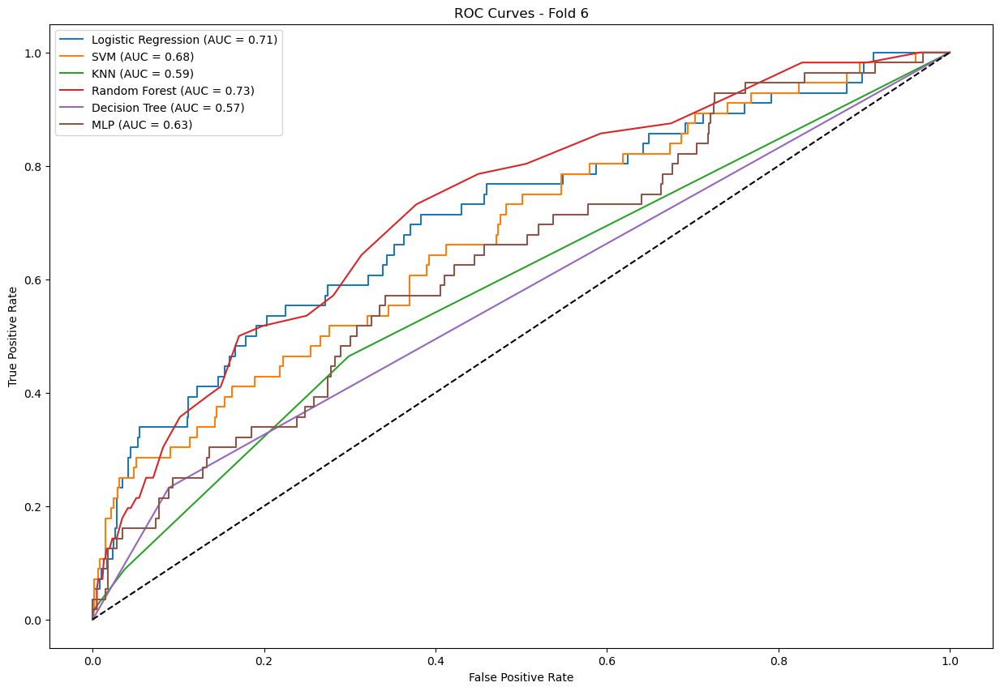

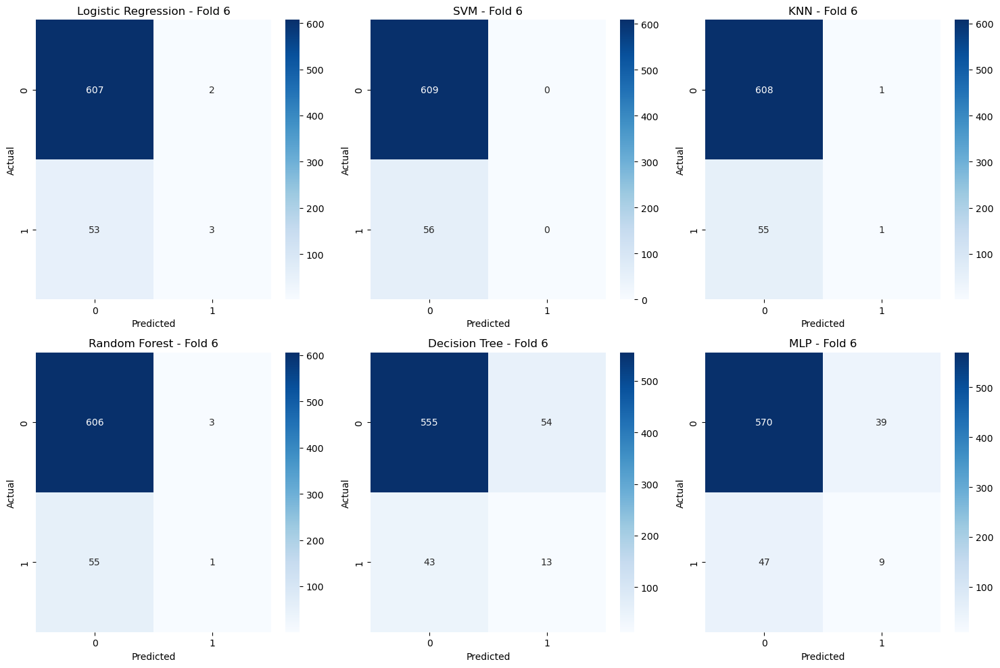

Fold 7
Model: Logistic Regression
Metrics for Logistic Regression - Fold 7:
  AUC: 0.67
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 7:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 7:
  AUC: 0.59
  Accuracy: 0.91
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: Random Forest
Metrics for Random Forest - Fold 7:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Decision Tree
Metrics for Decision Tree - Fold 7:
  AUC: 0.54
  Accuracy: 0.84
  Precision: 0.15
  Recall: 0.18
  F1 Score: 0.16


Model: MLP
Metrics for MLP - Fold 7:
  AUC: 0.59
  Accuracy: 0.89
  Precision: 0.17
  Recall: 0.09
  F1 Score: 0.12






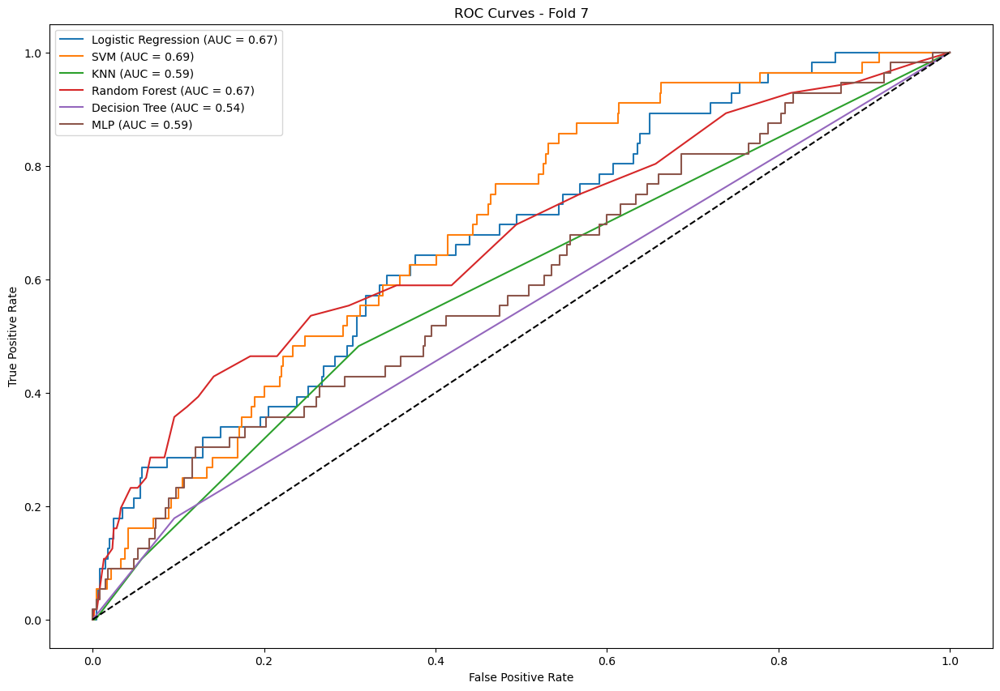

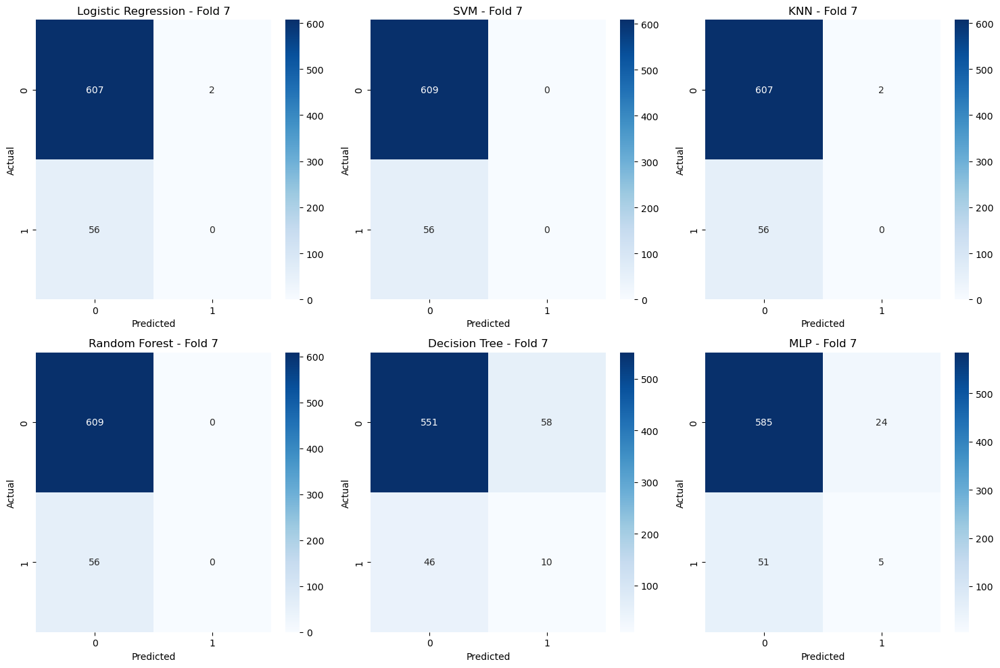

Fold 8
Model: Logistic Regression
Metrics for Logistic Regression - Fold 8:
  AUC: 0.71
  Accuracy: 0.92
  Precision: 0.80
  Recall: 0.07
  F1 Score: 0.13




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 8:
  AUC: 0.71
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 8:
  AUC: 0.60
  Accuracy: 0.91
  Precision: 0.20
  Recall: 0.02
  F1 Score: 0.03


Model: Random Forest
Metrics for Random Forest - Fold 8:
  AUC: 0.71
  Accuracy: 0.91
  Precision: 0.33
  Recall: 0.02
  F1 Score: 0.03


Model: Decision Tree
Metrics for Decision Tree - Fold 8:
  AUC: 0.56
  Accuracy: 0.85
  Precision: 0.18
  Recall: 0.21
  F1 Score: 0.19


Model: MLP
Metrics for MLP - Fold 8:
  AUC: 0.67
  Accuracy: 0.89
  Precision: 0.27
  Recall: 0.21
  F1 Score: 0.24






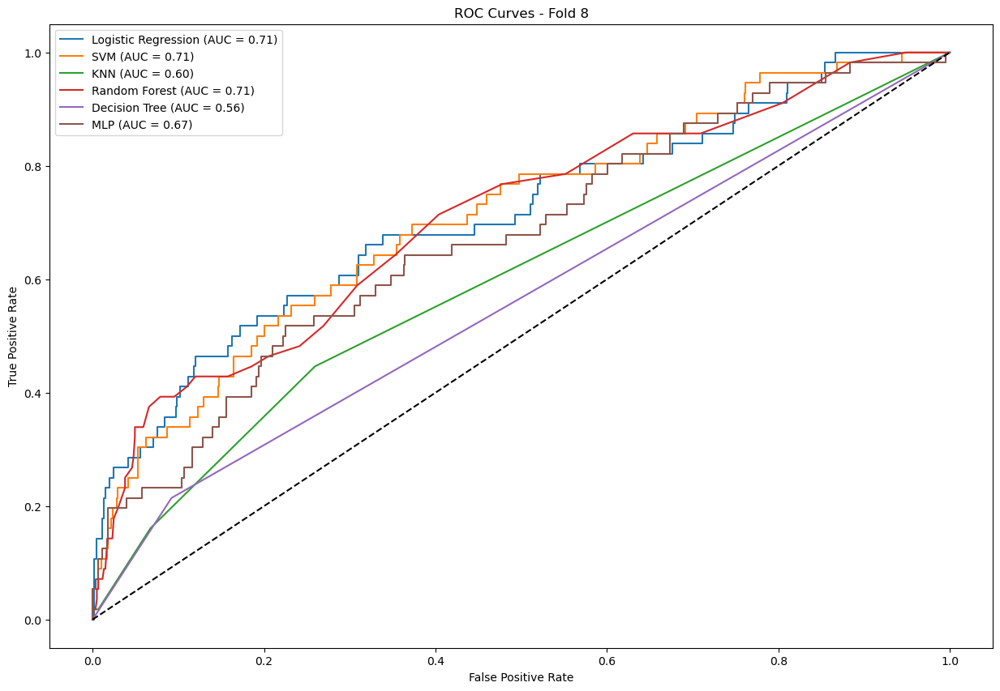

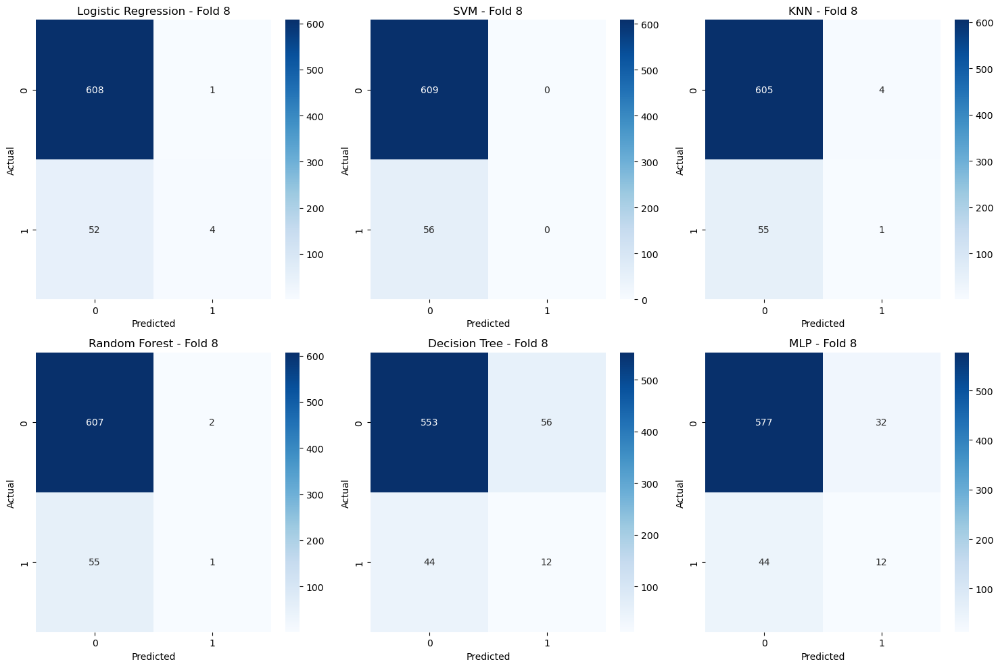

Fold 9
Model: Logistic Regression
Metrics for Logistic Regression - Fold 9:
  AUC: 0.69
  Accuracy: 0.92
  Precision: 0.75
  Recall: 0.05
  F1 Score: 0.10




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: SVM
Metrics for SVM - Fold 9:
  AUC: 0.63
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 9:
  AUC: 0.59
  Accuracy: 0.92
  Precision: 0.50
  Recall: 0.02
  F1 Score: 0.04




C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: Random Forest
Metrics for Random Forest - Fold 9:
  AUC: 0.68
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: Decision Tree
Metrics for Decision Tree - Fold 9:
  AUC: 0.49
  Accuracy: 0.85
  Precision: 0.06
  Recall: 0.05
  F1 Score: 0.06


Model: MLP
Metrics for MLP - Fold 9:
  AUC: 0.59
  Accuracy: 0.90
  Precision: 0.30
  Recall: 0.15
  F1 Score: 0.20






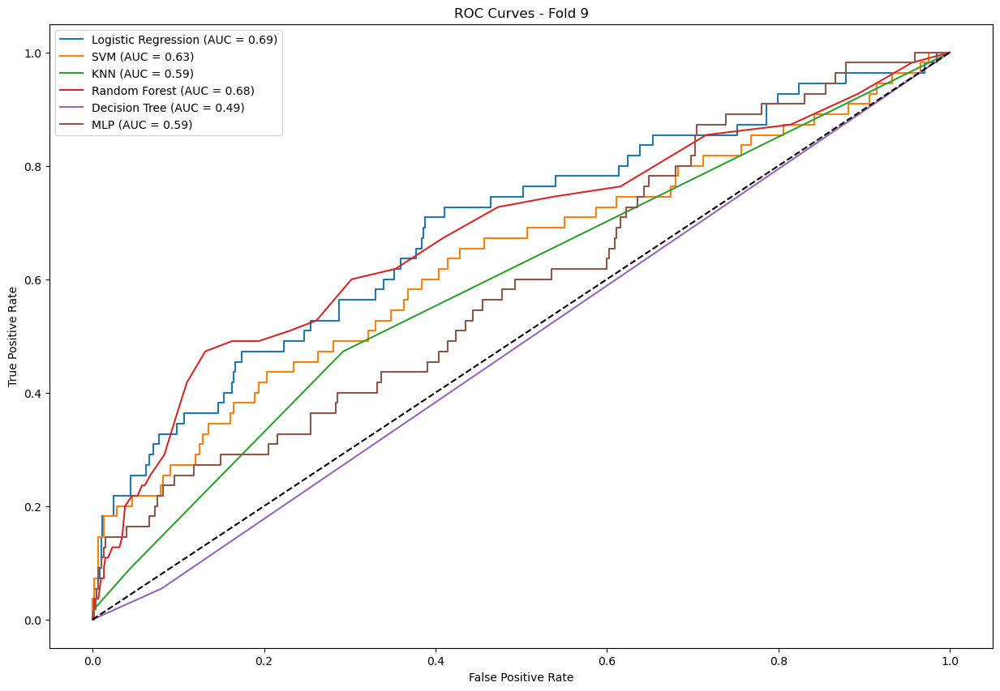

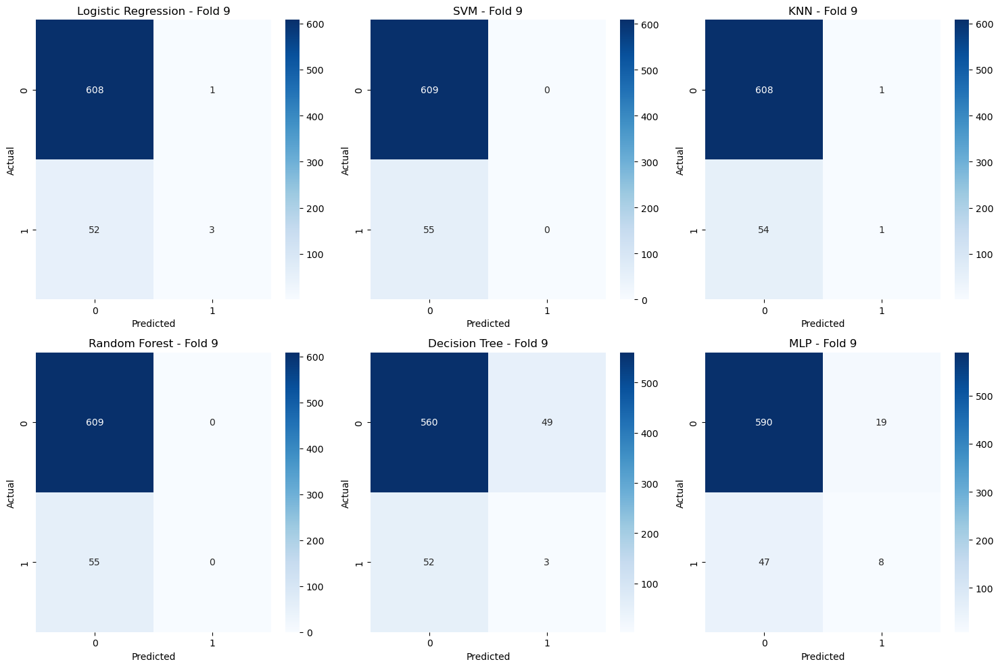

Fold 10
Model: Logistic Regression
Metrics for Logistic Regression - Fold 10:
  AUC: 0.65
  Accuracy: 0.91
  Precision: 0.36
  Recall: 0.07
  F1 Score: 0.12


Model: SVM
Metrics for SVM - Fold 10:
  AUC: 0.58
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Model: KNN
Metrics for KNN - Fold 10:
  AUC: 0.59
  Accuracy: 0.91
  Precision: 0.20
  Recall: 0.04
  F1 Score: 0.06


Model: Random Forest
Metrics for Random Forest - Fold 10:
  AUC: 0.63
  Accuracy: 0.92
  Precision: 0.50
  Recall: 0.04
  F1 Score: 0.07


Model: Decision Tree
Metrics for Decision Tree - Fold 10:
  AUC: 0.54
  Accuracy: 0.84
  Precision: 0.14
  Recall: 0.18
  F1 Score: 0.16


Model: MLP
Metrics for MLP - Fold 10:
  AUC: 0.64
  Accuracy: 0.88
  Precision: 0.17
  Recall: 0.13
  F1 Score: 0.15






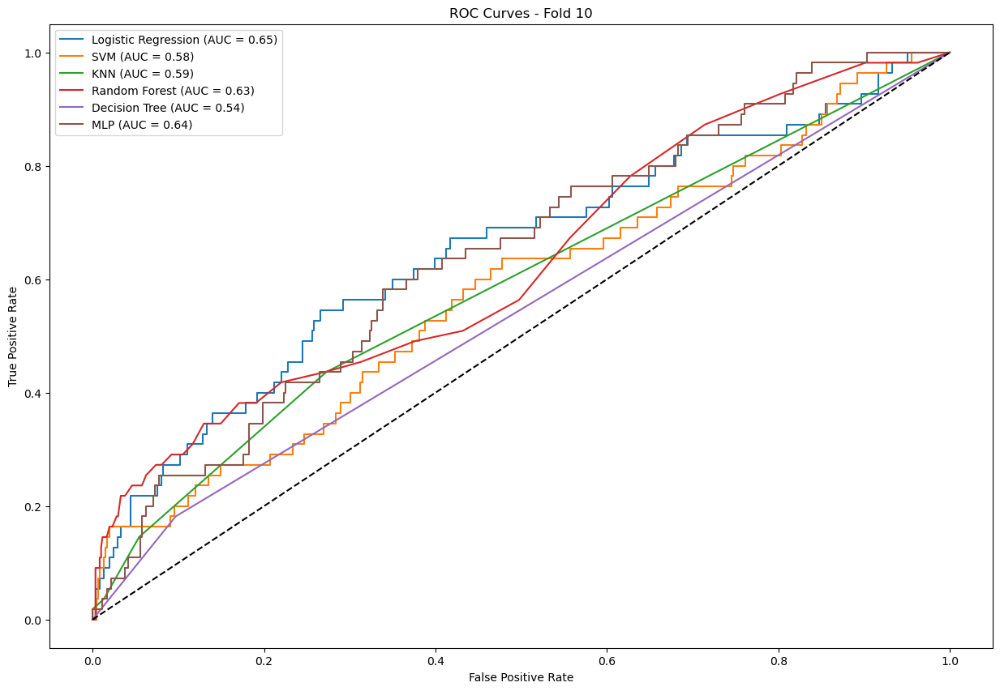

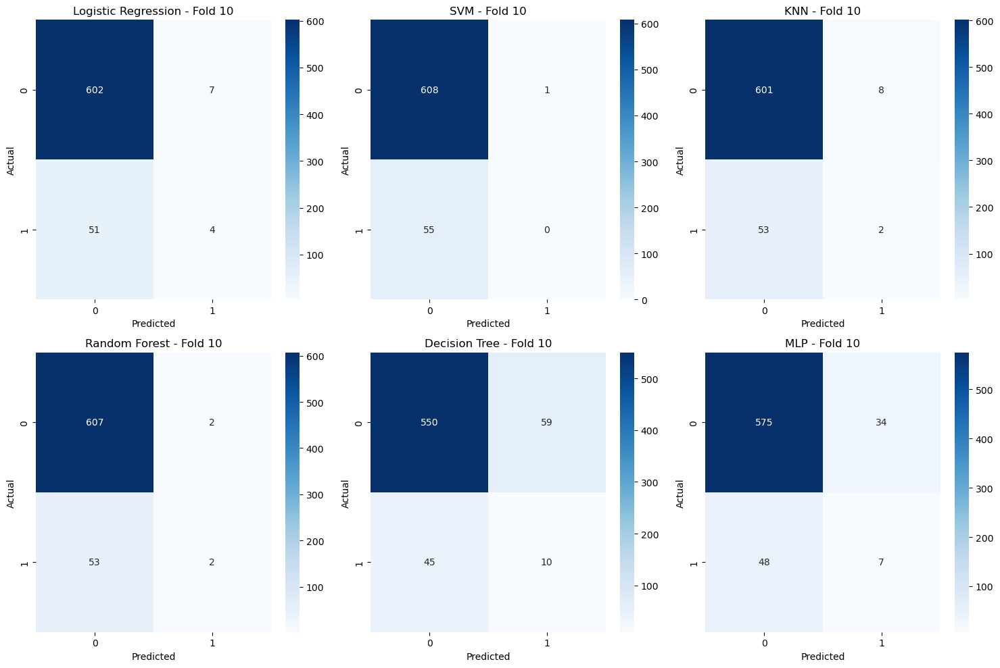

In [44]:
# Re-doing the entire process, with Stratified K-Fold Cross Validation instead:
# Assuming X_train_new and y_train_new are your data
stratified_kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Initialize tuples to store metrics, ROC curves, and confusion matrices
stratified_metrics = {(name, fold): {'roc_auc': None, 'accuracy': None, 'precision': None, 'recall': None, 'f1': None} 
           for name in models.keys() for fold in range(1, stratified_kf.get_n_splits() + 1)}

stratified_roc_curves = {(name, fold): {'fpr': None, 'tpr': None, 'roc_auc': None} 
              for name in models.keys() for fold in range(1, stratified_kf.get_n_splits() + 1)}

stratified_conf_matrices = {(name, fold): None for name in models.keys() for fold in range(1, stratified_kf.get_n_splits() + 1)}

# Perform stratified k-fold cross-validation
for fold, (train_index, val_index) in enumerate(stratified_kf.split(X_train_new, y_train_new), 1):
    print(f"Fold {fold}")
    X_train_fold, X_val_fold = X_train_new.iloc[train_index], X_train_new.iloc[val_index]
    y_train_fold, y_val_fold = y_train_new[train_index], y_train_new[val_index]

    plt.figure(figsize=(15, 10))
    
    for name, model in models.items():
        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)
        y_prob = model.predict_proba(X_val_fold)[:, 1]

        # Calculate metrics
        roc_auc = roc_auc_score(y_val_fold, y_prob)
        accuracy = accuracy_score(y_val_fold, y_pred)
        precision = precision_score(y_val_fold, y_pred)
        recall = recall_score(y_val_fold, y_pred)
        f1 = f1_score(y_val_fold, y_pred)

        # Store metrics
        stratified_metrics[(name, fold)] = {'roc_auc': roc_auc, 'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1}

        # Calculate ROC curve
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob)
        stratified_roc_curves[(name, fold)] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

        # Calculate and store confusion matrix
        stratified_conf_matrices[(name, fold)] = confusion_matrix(y_val_fold, y_pred)

        # Print metrics for each model and fold:
        print(f"Model: {name}")
        print(f"Metrics for {name} - Fold {fold}:")
        print(f"  AUC: {roc_auc:.2f}")
        print(f"  Accuracy: {accuracy:.2f}")
        print(f"  Precision: {precision:.2f}")
        print(f"  Recall: {recall:.2f}")
        print(f"  F1 Score: {f1:.2f}")
        print('\n')

        # Plot ROC curve
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    print('\n')

    # Finalize ROC curve plot
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves - Fold {fold}')
    plt.legend(loc='best')
    plt.show()

    # Plot confusion matrices
    num_models = len(models)
    num_cols = int(np.ceil(num_models / 2))
    fig, axes = plt.subplots(nrows=2, ncols=num_cols, figsize=(15, 10))
    axes = axes.flatten()

    for i, name in enumerate(models.keys()):
        matrix = stratified_conf_matrices[(name, fold)]
        if matrix is not None:
            sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', ax=axes[i])
            axes[i].set_title(f'{name} - Fold {fold}')
            axes[i].set_xlabel('Predicted')
            axes[i].set_ylabel('Actual')
    
    plt.tight_layout()
    plt.show()

# Part Four: Model Evaluation

### Metrics Data:

In [45]:
# Convert metrics to a DataFrame
data = []
for (name, fold), metric in metrics.items():
    data.append({
        'Fold': fold,
        'Model': name,
        'AUC': metric['roc_auc'],
        'Accuracy': metric['accuracy'],
        'Precision': metric['precision'],
        'Recall': metric['recall'],
        'F1 Score': metric['f1']
    })

df_metrics = pd.DataFrame(data)

# Print the DataFrame
df_metrics.head(60)

,Fold,Model,AUC,Accuracy,Precision,Recall,F1 Score
0,1,Logistic Regression,0.671837,0.915789,0.000000,0.000000,0.000000
1,2,Logistic Regression,0.710561,0.915789,0.666667,0.068966,0.125000
2,3,Logistic Regression,0.668234,0.930827,0.166667,0.023810,0.041667
3,4,Logistic Regression,0.686639,0.908271,0.333333,0.016667,0.031746
4,5,Logistic Regression,0.715286,0.912782,0.800000,0.065574,0.121212
5,6,Logistic Regression,0.715742,0.926316,0.636364,0.134615,0.222222
6,7,Logistic Regression,0.714912,0.909774,0.200000,0.017544,0.032258
7,8,Logistic Regression,0.655681,0.924812,0.666667,0.039216,0.074074
8,9,Logistic Regression,0.708097,0.911145,1.000000,0.048387,0.092308
9,10,Logistic Regression,0.695059,0.902108,0.333333,0.031746,0.057971


### Stratified Metrics Data:

In [46]:
# Convert stratified metrics to a DataFrame
stratified_data = []
for (name, fold), metric in stratified_metrics.items():
    stratified_data.append({
        'Fold': fold,
        'Model': name,
        'AUC': metric['roc_auc'],
        'Accuracy': metric['accuracy'],
        'Precision': metric['precision'],
        'Recall': metric['recall'],
        'F1 Score': metric['f1']
    })

df_stratified_metrics = pd.DataFrame(stratified_data)

# Print the DataFrame
df_stratified_metrics.head(60)

,Fold,Model,AUC,Accuracy,Precision,Recall,F1 Score
0,1,Logistic Regression,0.703696,0.918797,0.666667,0.036364,0.068966
1,2,Logistic Regression,0.621848,0.918797,1.000000,0.018182,0.035714
2,3,Logistic Regression,0.724842,0.906767,0.200000,0.035714,0.060606
3,4,Logistic Regression,0.670097,0.917293,0.555556,0.089286,0.153846
4,5,Logistic Regression,0.705313,0.914286,0.000000,0.000000,0.000000
5,6,Logistic Regression,0.708392,0.917293,0.600000,0.053571,0.098361
6,7,Logistic Regression,0.669980,0.912782,0.000000,0.000000,0.000000
7,8,Logistic Regression,0.711911,0.920301,0.800000,0.071429,0.131148
8,9,Logistic Regression,0.689088,0.920181,0.750000,0.054545,0.101695
9,10,Logistic Regression,0.649858,0.912651,0.363636,0.072727,0.121212


### Finding the best model:

In [47]:
# Find the model with the highest AUC for each fold
best_models_per_fold = df_metrics.loc[df_metrics.groupby('Fold')['AUC'].idxmax()]
best_models_per_fold.set_index('Fold', inplace=True)
best_models_per_fold.loc[:,["Model", "AUC"]]

,Model,AUC
Fold,,
1,Random Forest,0.721756
2,Logistic Regression,0.710561
3,Logistic Regression,0.668234
4,Logistic Regression,0.686639
5,Logistic Regression,0.715286
6,Logistic Regression,0.715742
7,Logistic Regression,0.714912
8,Random Forest,0.658172
9,Logistic Regression,0.708097


In [48]:
# Find the model with the highest accuracy for each fold
most_accurate_models_per_fold = df_metrics.loc[df_metrics.groupby('Fold')['Accuracy'].idxmax()]
most_accurate_models_per_fold.set_index('Fold', inplace=True)
most_accurate_models_per_fold.loc[:,["Model", "Accuracy"]]

,Model,Accuracy
Fold,,
1,SVM,0.923308
2,Logistic Regression,0.915789
3,SVM,0.936842
4,Random Forest,0.911278
5,Logistic Regression,0.912782
6,Logistic Regression,0.926316
7,Random Forest,0.915789
8,Logistic Regression,0.924812
9,Logistic Regression,0.911145


In [49]:
print(most_accurate_models_per_fold["Model"] != best_models_per_fold["Model"])

Fold
1      True
2     False
3      True
4      True
5     False
6     False
7      True
8      True
9     False
10     True
Name: Model, dtype: bool


In [50]:
# Find the model with the highest AUC for each stratified fold
best_stratified_models_per_fold = df_stratified_metrics.loc[df_stratified_metrics.groupby('Fold')['AUC'].idxmax()]
best_stratified_models_per_fold.set_index('Fold', inplace=True)
best_stratified_models_per_fold.loc[:,["Model", "AUC"]]

,Model,AUC
Fold,,
1,Logistic Regression,0.703696
2,Logistic Regression,0.621848
3,Logistic Regression,0.724842
4,SVM,0.712204
5,Logistic Regression,0.705313
6,Random Forest,0.726352
7,SVM,0.687368
8,Logistic Regression,0.711911
9,Logistic Regression,0.689088


In [51]:
# Find the model with the highest accuracy for each stratified fold
most_accurate_stratified_models_per_fold = df_stratified_metrics.loc[df_stratified_metrics.groupby('Fold')['Accuracy'].idxmax()]
most_accurate_stratified_models_per_fold.set_index('Fold', inplace=True)
most_accurate_stratified_models_per_fold.loc[:,["Model", "Accuracy"]]

,Model,Accuracy
Fold,,
1,Logistic Regression,0.918797
2,Logistic Regression,0.918797
3,SVM,0.914286
4,Random Forest,0.920301
5,SVM,0.915789
6,Logistic Regression,0.917293
7,SVM,0.915789
8,Logistic Regression,0.920301
9,Logistic Regression,0.920181


In [52]:
# Checking whether the best (in terms of AUC) models per stratified fold mismatch with the most accurate 
# (best in terms of accuracy) models per stratified fold
print(most_accurate_stratified_models_per_fold["Model"] != best_stratified_models_per_fold["Model"])

Fold
1     False
2     False
3      True
4      True
5      True
6      True
7     False
8     False
9     False
10     True
Name: Model, dtype: bool


In [53]:
# Checking whether the best (in terms of AUC) models per fold mismatch with the best
# (in terms of AUC) models per stratified fold
print(best_models_per_fold["Model"] != best_stratified_models_per_fold["Model"])

Fold
1      True
2     False
3     False
4      True
5     False
6      True
7      True
8      True
9     False
10    False
Name: Model, dtype: bool


In [54]:
# Checking whether the most accurate (best in terms of accuracy) models per stratified fold mismatch with the
# most accurate (best in terms of accuracy) models per fold
print(most_accurate_models_per_fold["Model"] != most_accurate_stratified_models_per_fold["Model"])

Fold
1      True
2     False
3     False
4     False
5      True
6     False
7      True
8     False
9     False
10     True
Name: Model, dtype: bool


#### But what is "best model"? Let's measure it with AUC & accuracy!

Putting aside for a moment the requirement of choosing a model best on the best AUC on the validation set. **For us**, the metrics that matter the most are the **AUC** (since it's a good representation of how close can a model be to perfect classification, since a classifier is perfect if and only if its AUC = 1. Even if the AUC > 0.9 for example, it's a good sign that the model does a good job classifying the datapoints), and **accuracy** (since it takes into account all the correct classifications - both positive & negative, compared to all the classifications generally. Unlike precision / sensitivity / specificity which take only positive classifications / positives in general / negatives in general, accuracy takes all into account and that's good for imbalanced data like ours which is full of negatives, but we also want to look at positive classifications & positives in general, even if they belong to the minority group, we want to see if the models can predict positives properly as well).
Therefore, we took into consideration AUC & accuracy, and for each fold, looked at which model produces the best results.

**Keep in mind:** the model with the best / highest accuracy in a specific fold isn't necessarily the model with the best / highest AUC in that same fold. Sometimes, they're the same, and in this case, in each such equality, almost surely, the model that does the best job is logistic regression. We can see it has the best AUC & accuracy (each of them) in a sizable portion of the folds (normal & stratified), sometimes, it's even a majority, and some of the matches between best & most accurate models align. As for the rest, Random Forest has the best AUC of the rest of the folds, while SVM has the best accuracy in the rest of folds (normal & stratified), sometimes, in some of the CV methods, it may have the best AUC as well.
We can also see that both after making K-Fold CV & stratified K-Fold CV, there's a random pattern of mismatch between the most accurate & best model (in each type of K-Fold we trained at). Which means - in both cross validation methods, the general pattern among all K folds - the best model in terms of AUC didn't necessarily match the most accurate model (best in terms of accuracy), and the mismatch between the 2 seemed random. However, the best models trained on K-Fold CV and on stratified K-Fold CV, usually matched both in terms of AUC & accuracy.

## Plotting the ROC of the averages:

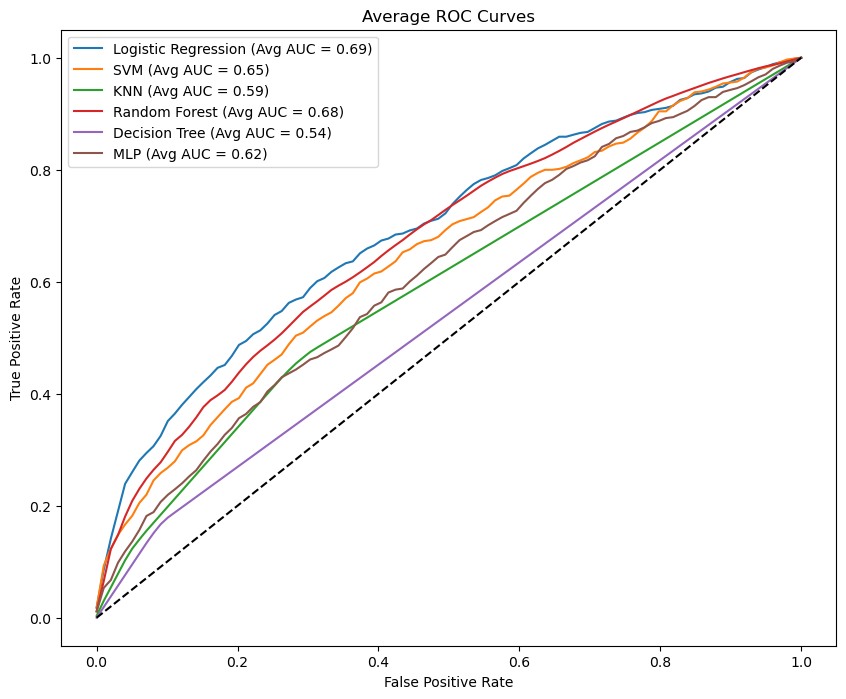

Average Metrics for Logistic Regression:
  roc_auc: 0.69
  accuracy: 0.92
  precision: 0.48
  recall: 0.04
  f1: 0.08


Average Metrics for SVM:
  roc_auc: 0.65
  accuracy: 0.92
  precision: 0.00
  recall: 0.00
  f1: 0.00


Average Metrics for KNN:
  roc_auc: 0.59
  accuracy: 0.91
  precision: 0.24
  recall: 0.02
  f1: 0.04


Average Metrics for Random Forest:
  roc_auc: 0.68
  accuracy: 0.92
  precision: 0.48
  recall: 0.02
  f1: 0.04


Average Metrics for Decision Tree:
  roc_auc: 0.54
  accuracy: 0.85
  precision: 0.15
  recall: 0.17
  f1: 0.16


Average Metrics for MLP:
  roc_auc: 0.62
  accuracy: 0.88
  precision: 0.20
  recall: 0.15
  f1: 0.17




In [55]:
# Calculate and plot average ROC curve
plt.figure(figsize=(10, 8))
average_roc_auc = {name: [] for name in models.keys()}
average_fpr = {name: [] for name in models.keys()}
average_tpr = {name: [] for name in models.keys()}

for name in models.keys():
    mean_fpr = np.linspace(0, 1, 100)
    mean_tpr = np.zeros_like(mean_fpr)
    
    for fold in range(1, kf.get_n_splits() + 1):
        fpr = roc_curves[(name, fold)]['fpr']
        tpr = roc_curves[(name, fold)]['tpr']
        roc_auc = roc_curves[(name, fold)]['roc_auc']
        
        mean_tpr += np.interp(mean_fpr, fpr, tpr)
        average_roc_auc[name].append(roc_auc)
    
    mean_tpr /= kf.get_n_splits()
    mean_tpr[-1] = 1.0
    mean_auc = np.mean(average_roc_auc[name])
    
    plt.plot(mean_fpr, mean_tpr, label=f'{name} (Avg AUC = {mean_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Average ROC Curves')
plt.legend(loc='best')
plt.show()

# Print average metrics for each model
for name in models.keys():
    avg_metrics = {metric: np.mean([metrics[(name, fold)][metric] for fold in range(1, kf.get_n_splits() + 1) if metrics[(name, fold)][metric] is not None]) 
                   for metric in ['roc_auc', 'accuracy', 'precision', 'recall', 'f1']}
    print(f'Average Metrics for {name}:')
    for metric, value in avg_metrics.items():
        print(f'  {metric}: {value:.2f}')
    print('\n')  # Adding a newline for better readability

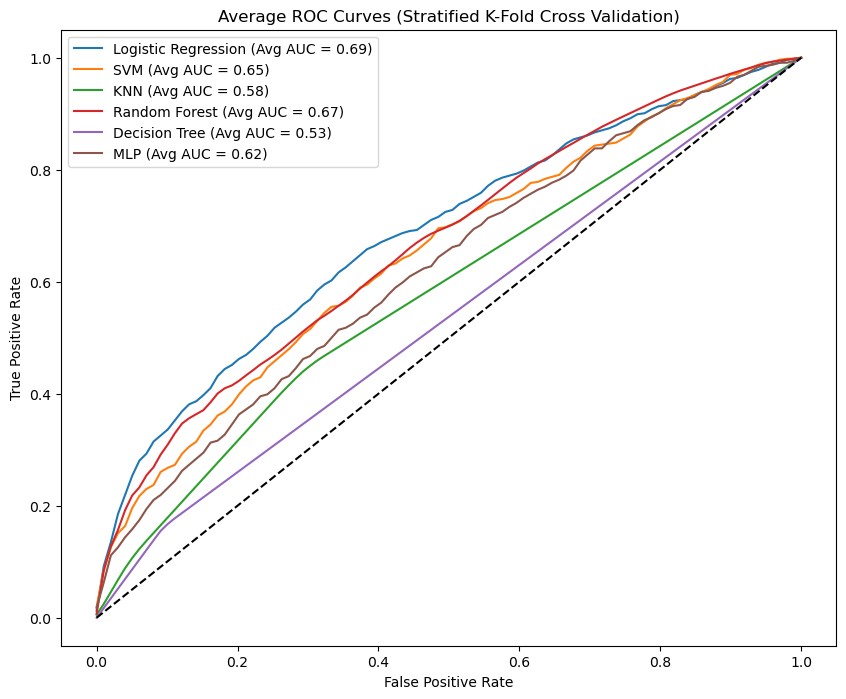

Average Metrics for Logistic Regression:
  roc_auc: 0.69
  accuracy: 0.92
  precision: 0.49
  recall: 0.04
  f1: 0.08


Average Metrics for SVM:
  roc_auc: 0.65
  accuracy: 0.92
  precision: 0.00
  recall: 0.00
  f1: 0.00


Average Metrics for KNN:
  roc_auc: 0.58
  accuracy: 0.91
  precision: 0.29
  recall: 0.01
  f1: 0.03


Average Metrics for Random Forest:
  roc_auc: 0.67
  accuracy: 0.92
  precision: 0.31
  recall: 0.02
  f1: 0.04


Average Metrics for Decision Tree:
  roc_auc: 0.53
  accuracy: 0.85
  precision: 0.13
  recall: 0.16
  f1: 0.14


Average Metrics for MLP:
  roc_auc: 0.62
  accuracy: 0.88
  precision: 0.22
  recall: 0.15
  f1: 0.18




In [56]:
# Calculate and plot average ROC curve (stratified K-Fold):
plt.figure(figsize=(10, 8))
average_roc_auc_stratified = {name: [] for name in models.keys()}
average_fpr_stratified = {name: [] for name in models.keys()}
average_tpr_stratified = {name: [] for name in models.keys()}

for name in models.keys():
    mean_fpr_stratified = np.linspace(0, 1, 100)
    mean_tpr_stratified = np.zeros_like(mean_fpr_stratified)
    
    for fold in range(1, stratified_kf.get_n_splits() + 1):
        fpr_stratified = stratified_roc_curves[(name, fold)]['fpr']
        tpr_stratified = stratified_roc_curves[(name, fold)]['tpr']
        roc_auc_stratified = stratified_roc_curves[(name, fold)]['roc_auc']
        
        mean_tpr_stratified += np.interp(mean_fpr_stratified, fpr_stratified, tpr_stratified)
        average_roc_auc_stratified[name].append(roc_auc_stratified)
    
    mean_tpr_stratified /= stratified_kf.get_n_splits()
    mean_tpr_stratified[-1] = 1.0
    mean_auc_stratified = np.mean(average_roc_auc_stratified[name])
    
    plt.plot(mean_fpr_stratified, mean_tpr_stratified, label=f'{name} (Avg AUC = {mean_auc_stratified:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Average ROC Curves (Stratified K-Fold Cross Validation)')
plt.legend(loc='best')
plt.show()

# Print average metrics for each model
for name in models.keys():
    avg_metrics_stratified = {metric: np.mean([stratified_metrics[(name, fold)][metric] for fold in range(1, stratified_kf.get_n_splits() + 1) if stratified_metrics[(name, fold)][metric] is not None]) 
                   for metric in ['roc_auc', 'accuracy', 'precision', 'recall', 'f1']}
    print(f'Average Metrics for {name}:')
    for metric, value in avg_metrics_stratified.items():
        print(f'  {metric}: {value:.2f}')
    print('\n')  # Adding a newline for better readability

## The Best Model on Average:

In [57]:
avg_metrics = df_metrics.groupby('Model').agg({
    'AUC': 'mean',
    'Accuracy': 'mean',
    'Recall': 'mean'
}).reset_index()
avg_metrics

,Model,AUC,Accuracy,Recall
0,Decision Tree,0.539400,0.847319,0.169776
1,KNN,0.594493,0.913054,0.019098
2,Logistic Regression,0.694205,0.915761,0.044652
3,MLP,0.615753,0.878758,0.147009
4,Random Forest,0.676507,0.916363,0.022212
5,SVM,0.649195,0.916062,0.000000


In [58]:
avg_stratified_metrics = df_stratified_metrics.groupby('Model').agg({
    'AUC': 'mean',
    'Accuracy': 'mean',
    'Recall': 'mean'
}).reset_index()
avg_stratified_metrics

,Model,AUC,Accuracy,Recall
0,Decision Tree,0.533868,0.847021,0.157857
1,KNN,0.580270,0.913056,0.014416
2,Logistic Regression,0.685502,0.915915,0.043182
3,MLP,0.624534,0.884177,0.154448
4,Random Forest,0.667017,0.915765,0.023377
5,SVM,0.649801,0.916065,0.000000


In [59]:
# Checking the difference in metrics between the models on the original K-Fold CV, and the ones on the stratified K-Fold CV:
print(avg_metrics.loc[:, ["AUC", "Accuracy", "Recall"]] >= avg_stratified_metrics.loc[:, ["AUC", "Accuracy", "Recall"]])

     AUC  Accuracy  Recall
0   True      True    True
1   True     False    True
2   True     False    True
3  False     False   False
4   True      True   False
5  False     False    True


We can conclude that there are very minor differences in the average metrics in both the K-Fold CV and the Stratified K-Fold CV. The average AUCs & accuracies are very similar to one another accross all models (there may be an occasional difference between corresponding avg metrics of the same models trained on a different type of K-Fold CV). However, after running both Cross Validations multiple times, there seems to be a general trend in which most models' AUC is higher in K-Fold CV (than the stratified method of CV), the same can be said about the recall, as for the accuracy, we noticed that the opposite trend occurs there -  in which there seems to be a general trend in which most models' accuracy is higher in stratified K-Fold CV (K-Fold CV).

In [60]:
most_accurate_model_on_avg = avg_metrics.loc[avg_metrics['Accuracy'].idxmax()]
print(most_accurate_model_on_avg)
most_accurate_model_on_avg.loc[["Model", "Accuracy"]]

Model       Random Forest
AUC              0.676507
Accuracy         0.916363
Recall           0.022212
Name: 4, dtype: object


Model       Random Forest
Accuracy         0.916363
Name: 4, dtype: object

In [61]:
most_accurate_model_on_stratified_avg = avg_stratified_metrics.loc[avg_stratified_metrics['Accuracy'].idxmax()]
print(most_accurate_model_on_stratified_avg)
most_accurate_model_on_stratified_avg.loc[["Model", "Accuracy"]]

Model            SVM
AUC         0.649801
Accuracy    0.916065
Recall           0.0
Name: 5, dtype: object


Model            SVM
Accuracy    0.916065
Name: 5, dtype: object

In [62]:
best_model_on_avg = avg_metrics.loc[avg_metrics['AUC'].idxmax()]
print(best_model_on_avg)
best_model_on_avg.loc[["Model", "AUC"]]

Model       Logistic Regression
AUC                    0.694205
Accuracy               0.915761
Recall                 0.044652
Name: 2, dtype: object


Model    Logistic Regression
AUC                 0.694205
Name: 2, dtype: object

In [63]:
best_model_on_stratified_avg = avg_stratified_metrics.loc[avg_stratified_metrics['AUC'].idxmax()]
print(best_model_on_stratified_avg)
best_model_on_stratified_avg.loc[["Model", "AUC"]]

Model       Logistic Regression
AUC                    0.685502
Accuracy               0.915915
Recall                 0.043182
Name: 2, dtype: object


Model    Logistic Regression
AUC                 0.685502
Name: 2, dtype: object

**Conclusions:**

Without loss of generality (בה"כ - WOLOG) - we shall refer to the resulting metrics from the K-Fold Cross Validation:
The ROC curves for different models provide valuable insights into their performance on the dataset:

- **Logistic Regression**: This model shows the highest average AUC (around 0.67-0.7, in this iteration while running the code - 0.69), indicating that it is the most effective on average in distinguishing between the two classes. Its average accuracy is also very high - 0.91. This suggests that logistic regression is a strong candidate for this classification problem.
  
- **Random Forest**: With an average AUC of around 0.65-0.7 (in this iteration while running the code - 0.67), as well as an average accuracy of 0.91, the random forest model also performs well, closely following logistic regression. The ensemble nature of random forest helps in capturing complex patterns in the data.

- **SVM (Support Vector Machine)**: The SVM model has a moderate performance with an average AUC of around 0.65 (in this iteration while running the code - 0.64), as well as a very high average accuracy of 0.91. This indicates that it performs better than a random guess but is less effective compared to logistic regression and random forest, because of the lower average AUC.

- **KNN (K-Nearest Neighbors)**: This model has an average AUC of around 0.55-0.6 (in this iteration while running the code - 0.58). While it shows some capability in class distinction, it is not as effective as the top-performing models.

- **MLP (Multi-Layer Perceptron)**: The MLP model has an average AUC of 0.55-0.6 (sometimes it's a bit higher than 0.6, but not far higher), as well as an average accuracy of 0.87 (in this iteration while running the code - 0.88), indicating its performance is similar to KNN but lower than SVM, random forest, and logistic regression. It also delivered the highest average recall (along with Decision Tree), of about 0.14 (in this iteration while running the code - 0.14, while the rest of the models' recall was less than 0.1). Neural networks may need more tuning and data to perform optimally.

- **Decision Tree**: This model has the lowest average AUC (around 0.53) as well as the lowest average accuracy (around 0.85, in this iteration while running the code - 0.84), indicating that it is the least effective in distinguishing between the classes among the models evaluated. Single decision trees are prone to overfitting and may not generalize well.

Overall, **logistic regression** and **random forest** stand out as the best-performing models based on the average AUC metric. The ROC curves suggest that these models should be considered for final deployment (but not necessarily - since we choose the best perfoming model in terms of AUC on the validation set, and not based on the training set), with logistic regression being slightly preferable due to its simplicity and strong performance.

## Grid Search:

In [64]:
# Define parameter grids for each model:
param_grids = {
    'Logistic Regression': {
        'penalty': ['l1', 'l2'],
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['liblinear']
    },
    'SVM': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale']  # Removed 'auto' and narrowed down to 'scale'
    },
    'Random Forest': {
        'n_estimators': [50, 100],
        'max_features': ['auto', 'sqrt'],  # Removed 'log2'
        'max_depth': [10, 20],  # Removed None and reduced depth options
        'criterion': ['gini', 'entropy']
    },
    'Decision Tree': {
        'criterion': ['gini', 'entropy'],
        'splitter': ['best', 'random'],
        'max_depth': [10, 20],  # Removed None and reduced depth options
        'max_features': ['auto', 'sqrt']  # Removed 'log2'
    }
}

### In case the Grid Search will be too computationally expensive, here are some handy deafult parameters:
param_grids = {
    'Logistic Regression': {
        'penalty': ['l1', 'l2'],
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['liblinear']
    },
    'SVM': {
        'C': [1.0],
        'kernel': ['rbf'],
        'gamma': ['scale']
    },
    'Random Forest': {
        'n_estimators': [100],
        'max_features': ['auto'],
        'max_depth': [20],
        'criterion': ['gini']
    },
    'Decision Tree': {
        'criterion': ['gini'],
        'splitter': ['best'],
        'max_depth': [20],
        'max_features': ['auto']
    }
}

#### Disclaimer - dropping 2 models (KNN & MLP):

Based of the metrics of the averages on the K-Fold & Stratified K-Fold Cross Validation, the average AUCs & average accuracies of KNN & MLP are not the highest among the 6 models. We also know from class their incredible computational complexity. Therefore, performing grid search using these models may be computationally expensive & very time consuming. As a result, we decided to drop these 2 models from the list of candidates for our model of choice for the rest of the project. That means we'll perform grid search, train & test only the remaining 4 models on the validation set.

In [65]:
# Define models for validation so that the Grid Search will be less computationally expensive:
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'SVM': SVC(probability=True)
}

In [66]:
# Function to perform grid search and plot ROC curves
def perform_grid_search_and_plot_roc(X_train, y_train, X_val, y_val):
    results = []
    val_conf_matrices = {}
    best_model_instances = {}
    plt.figure(figsize=(10, 8))
    
    for model_name, model in models.items():
        print(f"Performing Grid Search for {model_name}")
        grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], scoring='roc_auc', cv=5, n_jobs=-1)
        grid_search.fit(X_train, y_train)
        
        best_params = grid_search.best_params_
        best_model = grid_search.best_estimator_
        best_model_instances[model_name] = best_model
        y_pred = best_model.predict(X_val)
        y_prob = best_model.predict_proba(X_val)[:, 1] if hasattr(best_model, "predict_proba") else y_pred
        
        accuracy, precision, recall, f1, roc_auc = evaluate_model(y_val, y_pred, y_prob)
        val_conf_matrices[model_name] = confusion_matrix(y_val, y_pred)
        
        print(f"Metrics for Model: {model_name}:")
        print(f"  AUC: {roc_auc:.2f}")
        print(f"  Accuracy: {accuracy:.2f}")
        print(f"  Precision: {precision:.2f}")
        print(f"  Recall: {recall:.2f}")
        print(f"  F1 Score: {f1:.2f}")
        print('\n')
        
        fpr, tpr, _ = roc_curve(y_val, y_prob)
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
        
        results.append({
            'model': model_name,
            'best_params': best_params,
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'roc_auc': roc_auc
        })
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves')
    plt.legend(loc='best')
    plt.show()
    
    num_models = len(models)
    num_cols = int(np.ceil(num_models / 2))
    fig, axes = plt.subplots(nrows=2, ncols=num_cols, figsize=(15, 10))
    axes = axes.flatten()

    for i, name in enumerate(models.keys()):
        matrix = val_conf_matrices[name]
        if matrix is not None:
            sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', ax=axes[i])
            axes[i].set_title(f'{name} - Validation Set')
            axes[i].set_xlabel('Predicted')
            axes[i].set_ylabel('Actual')
    
    plt.tight_layout()
    plt.show()
    
    return results, best_model_instances

Performing Grid Search for Logistic Regression


C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Metrics for Model: Logistic Regression:
  AUC: 0.67
  Accuracy: 0.92
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00


Performing Grid Search for Random Forest


C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
40 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
13 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\user\anaconda3\lib\site-packages\sklea

Metrics for Model: Random Forest:
  AUC: 0.66
  Accuracy: 0.92
  Precision: 0.80
  Recall: 0.02
  F1 Score: 0.04


Performing Grid Search for Decision Tree
Metrics for Model: Decision Tree:
  AUC: 0.57
  Accuracy: 0.92
  Precision: 0.52
  Recall: 0.06
  F1 Score: 0.11


Performing Grid Search for SVM


C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
40 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\user\anaconda3\lib\site-packages\sklea

Metrics for Model: SVM:
  AUC: 0.64
  Accuracy: 0.92
  Precision: 1.00
  Recall: 0.01
  F1 Score: 0.02




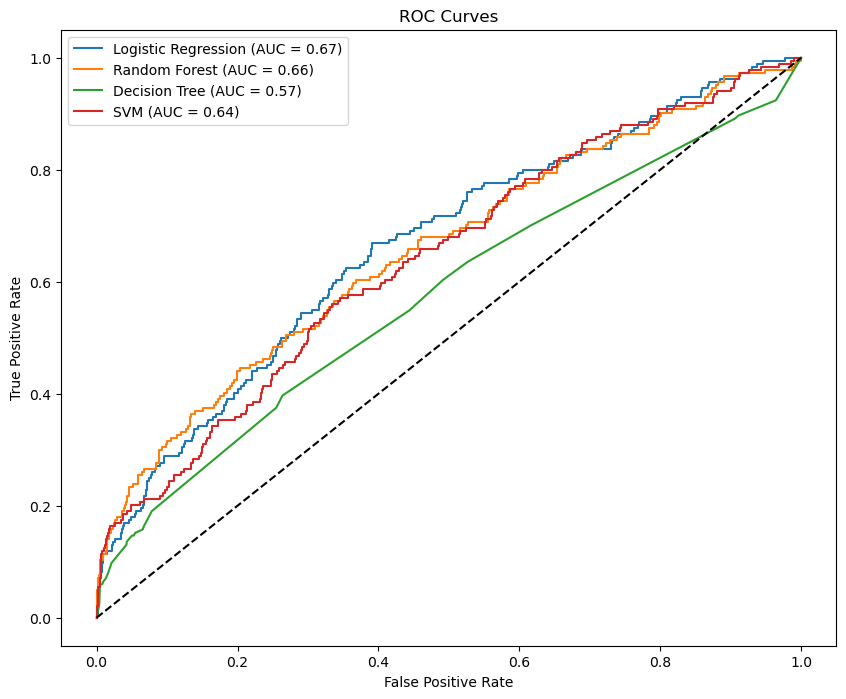

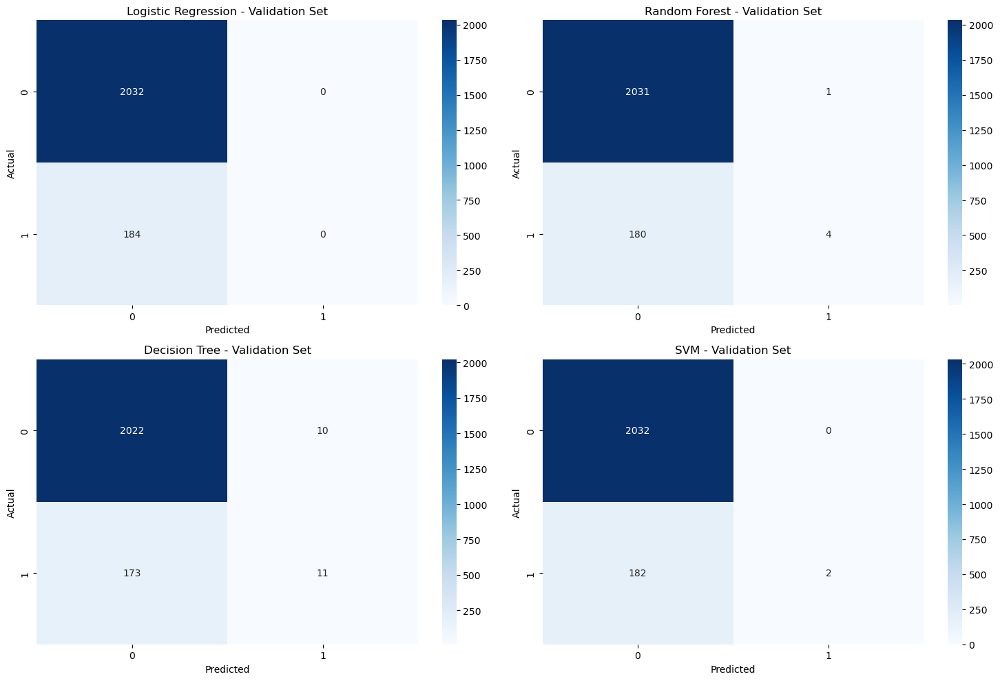

In [67]:
# Perform grid search and get results
results, best_model_instances = perform_grid_search_and_plot_roc(X_train_new, y_train_new, X_val, y_val)
results_df = pd.DataFrame(results)

In [68]:
# Find the best model based on the highest AUC
best_model_info = max(results, key=lambda x: x['roc_auc'])
results_df.rename(columns={'model': "Model", 'roc_auc': 'AUC', "accuracy": "Accuracy", "f1": "F1 Score", "precision": "Precision", "recall": "Recall" }, inplace=True)
best_model_f = best_model_instances[best_model_info['model']]

results_df.head(4)

,Model,best_params,Accuracy,Precision,Recall,F1 Score,AUC
0,Logistic Regression,"{'C': 0.1, 'penalty': 'l2', 'solver': 'libline...",0.916968,0.00000,0.000000,0.000000,0.665480
1,Random Forest,"{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.918321,0.80000,0.021739,0.042328,0.656654
2,Decision Tree,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.917419,0.52381,0.059783,0.107317,0.574887
3,SVM,"{'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}",0.917870,1.00000,0.010870,0.021505,0.640826


In [69]:
# Printing the best model (in terms of AUC):
best_model = results_df.loc[results_df['AUC'].idxmax()]
print(best_model)

Model                                        Logistic Regression
best_params    {'C': 0.1, 'penalty': 'l2', 'solver': 'libline...
Accuracy                                                0.916968
Precision                                                    0.0
Recall                                                       0.0
F1 Score                                                     0.0
AUC                                                      0.66548
Name: 0, dtype: object


**Conclusions - Chosen Model:**
- **Logistic Regression** After the model's great performance accross all 10-Fold CV training datasets (as well as the stratified ones), Logistic Regression performed as good on the new validation data it was exposed to, and delivered a similarly good performance in terms of AUC, as it was trained on the entire training set & tested on the validation set, with the highest AUC among the 4 models - of 0.66. It still delivered an incredible accuracy of 0.91 - proving the number of TPs and TNs (relative to all the validation set datapoints) is very close to the number of validation set datapoints - which means the number of correct classifications it did (both positives & negatives) is very high.
- **Random Forest:** Not too far behind, the 2nd best classifier in terms of AUC - Random Forest - with an AUC of around 0.65-0.66 (at least for the iteration which we ran now). It performed best in terms of accuracy but not by a wide margin over the other models - with an accuracy of 0.91 as well as the others, about as high as Logistic Regression's. Both accuracies are amazing - 0.91+.
- **SVM:** SVM's performance hasn't been too bad, with an AUC of 0.64, not too far from the 2 models mentioned above. But with a similarly high accuracy as the 2 models mentioned before - around 0.91 (and 0.91 for this iteration as well).
- **Decision Tree:** With an AUC of about 0.55-0.6 (0.57 for this iteration), it delivered the worst AUC which is the 2nd best, and its accuracy is also very high, indicating it classifies correctly most positives & negatives altogether.
Accross all models, the vast majority of datapoints are True Negatives (TN). All the models barely classified any datapoint as positive, Decision Tree classified a little bit more points as positive, while Logistic Regression didn't do it at all.

Overall, the performances & general trends of model metrics on the new validation set, seem similar to the corresponding model metrics while trained on K-Fold Cross Validation (& Stratified). It proves that the models weren't overfitted, since they delivered a similarly good AUC & accuracy in this current phase, to the average corresponding AUC & accuracy back then in the K-Fold CV. It also proves we chose a good K = 10 in the K-Fold CV. Since a K too low there will result in biased models, where the training metrics are vastly different from the corresponding metrics on the validation data. And furthermore, running the K-Fold CV multiple times, the metrics there haven't changed much, which means - low variance.

To conclude, we performed Grid Search in order to find the best combination of hyperparameters for each model, trained on the entire new training set & tested on the validation set. The best combination of hyperparameters was defined as the one which maximizes the AUC of the training set, because our goal is to maximize AUC, and then validate the AUC maximization on the validation set. And since Logistic Regression performed best with:
- **L2 penalty** - The penalty function is proportional to the sum of the squared model coefficients. That "incentivizes" these coefficients to shrink, get closer to 0 but not exactly 0. It's being done in order to prevent overfitting & improve generalization on unseen data.
- **C = 0.1** - a positive value which determines regularization strength. The smaller the C -> the stronger the regularization & vice versa. In our case, it's pretty strong. (Since the lambda we learned about in class as the ridge regression coefficient - is 1/C. Therefore - smaller C <-> bigger lambda & vice-versa. Therefore lambda = 1/0.1 = 10). That means the model hyperparameters "incentivize" smaller coefficients in order to prevent overfitting. The model’s coefficients are penalized heavily, encouraging them to be smaller, thus improving generalization on unseen data.
- **LibLinear solver** - optimizes the performance of L2 & C on logistic regression.

Logistic Regression delivered the best AUC on the validation set, we'll stick with it through the rest of the project from now. This all means our estimation after the K-Fold Cross Validation was correct. The model which performed best there in terms of average AUC gave us a good estimate of the model which performed best on the unknown validation data.

In [70]:
# Getting the best parameters from Logistic Regression:
best_params_series = best_model["best_params"]
print(f"Best Model: {best_model['Model']}")
print(f"Best penalty: {best_params_series['penalty']}")
print(f"Best C: {best_params_series['C']}")
print(f"Best solver: {best_params_series['solver']}")

Best Model: Logistic Regression
Best penalty: l2
Best C: 0.1
Best solver: liblinear


In [71]:
best_model_f

LogisticRegression(C=0.1, solver='liblinear')

C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


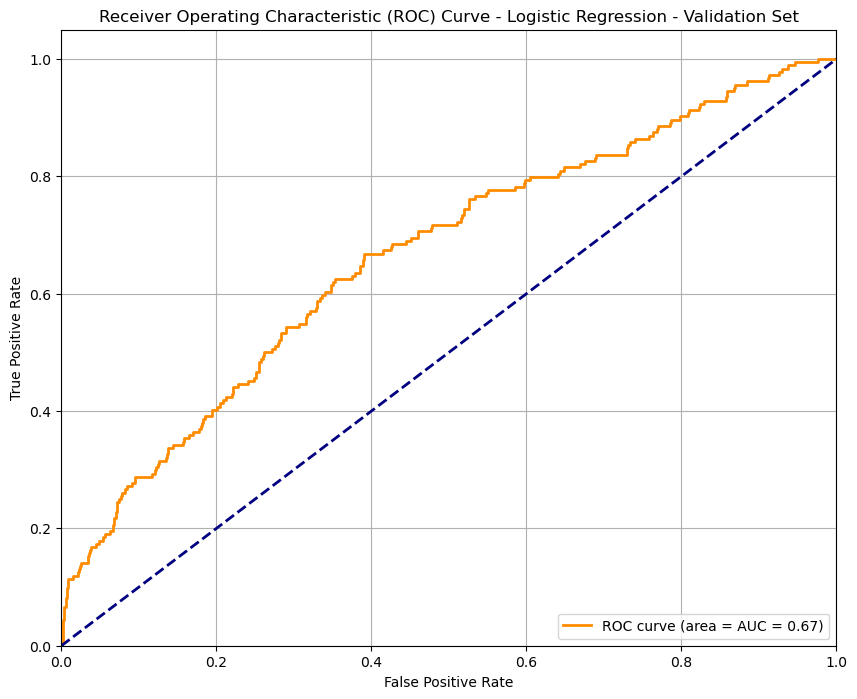

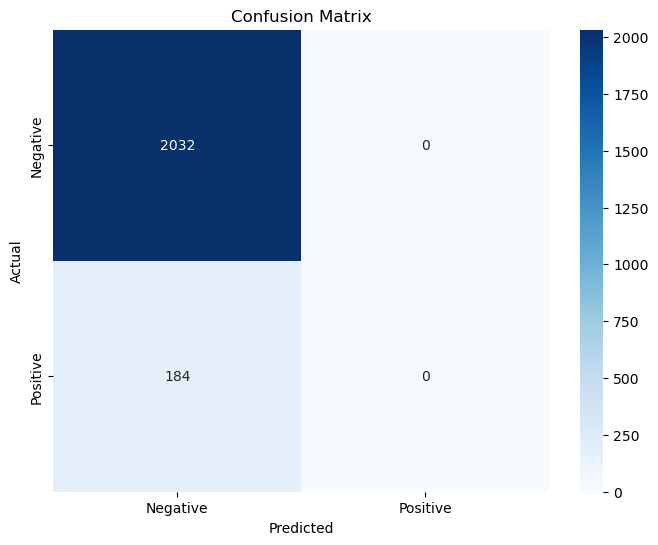

AUC Score on Validation Set: 0.67
Accuracy on Validation Set: 0.92
Precision on Validation Set: 0.00
Recall on Validation Set: 0.00
F1 Score on Validation Set: 0.00


In [72]:
# Predict on the validation set using the best model
y_prob = best_model_f.predict_proba(X_val)[:, 1]
y_pred = best_model_f.predict(X_val)

# Calculate and print final metrics
roc_auc = roc_auc_score(y_val, y_prob)
accuracy = accuracy_score(y_val, y_pred)
precision = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_val, y_prob)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Receiver Operating Characteristic (ROC) Curve - {best_model_info["model"]} - Validation Set')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Print confusion matrix
conf_matrix = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(f"AUC Score on Validation Set: {roc_auc:.2f}")
print(f"Accuracy on Validation Set: {accuracy:.2f}")
print(f"Precision on Validation Set: {precision:.2f}")
print(f"Recall on Validation Set: {recall:.2f}")
print(f"F1 Score on Validation Set: {f1:.2f}")

The AUC & accuracy are similarly good as the ones in the K-Fold CV (0.67 & 0.92 respectively), which means the model we chose - Logistic Regression, is a relatively good classifier, also for the new validation set it has never seen before. It's worth mentioning - the model didn't classify any datapoints as positive from the validation set.

## Training on all the Data (Train + Validation):

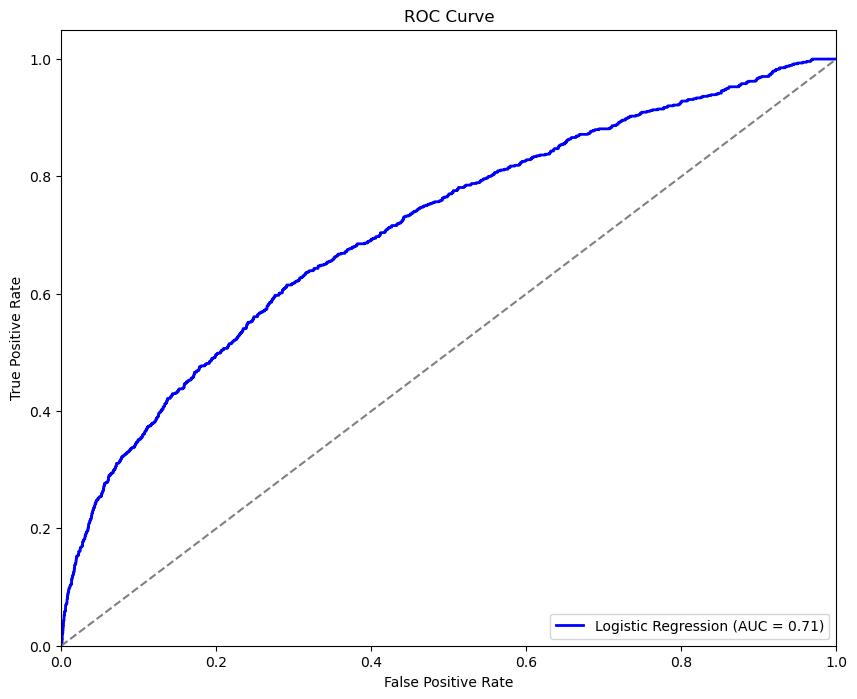

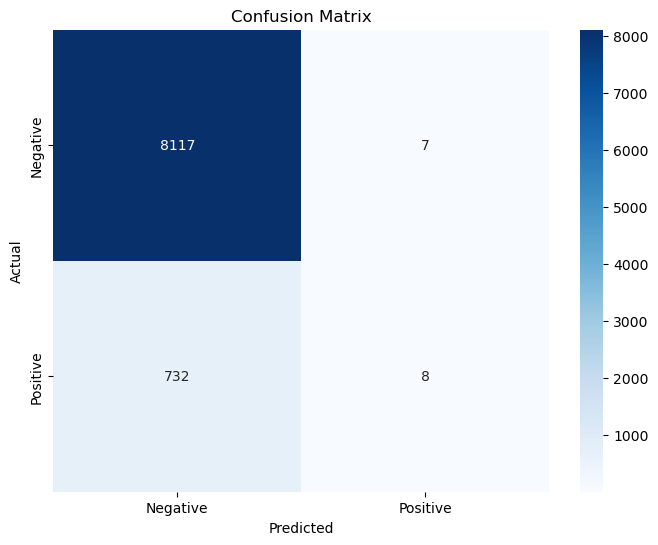

Accuracy: 0.92
Precision: 0.53
Recall: 0.01
F1 Score: 0.02
AUC: 0.71


In [73]:
# Initialize Logistic Regression with the best parameters:
best_model = LogisticRegression(penalty=best_params_series['penalty'], C=best_params_series['C'], solver=best_params_series['solver'])
best_model.fit(X_selected, y)

# Predict on the test set
y_pred_prob = best_model.predict_proba(X_selected)[:, 1]
y_pred = best_model.predict(X_selected)

# Calculate ROC curve and AUC
fpr, tpr, _ = roc_curve(y, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Logistic Regression (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Print confusion matrix
conf_matrix = confusion_matrix(y, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Print evaluation metrics
accuracy = accuracy_score(y, y_pred)
precision = precision_score(y, y_pred)
recall = recall_score(y, y_pred)
f1 = f1_score(y, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"AUC: {roc_auc:.2f}")

We got even better results than solely on the validation set! In terms of both accuracy - 0.92 >= 0.92, and AUC - around 0.7 (0.71) > around 0.7 (0.66). All results are not much higher than ever before - both in the 10-Fold CV (& stratified) phase, and both in the hyperparameter tuning phase.

We can see that despite having a decent AUC (0.7+!) and very good accuracy (0.9+!), Logistic Regression has a very low recall (around 0.1!), which means there are way more False Negatives than True Positives as a result of its classification. So in terms of classifications of positives - it does so poorly. Yet we can see it's precision is around 50% because there are as many False Positives as True Positives. And it'd also probably mean it classifies negatives incredibly well and it compensates for the misclassifications of positives. But we should keep in mind that this is done while training the model on much more datapoints than before.

# Part Five: Making Predictions

### Prepering test data set

In [74]:
test_df = pd.read_csv('test_telecom_marketing_data.csv')

In [75]:
# Adjusting the test df so that its columns will go through the same transformations as the training df:
# Transform 'eve' to 'Evening' in the 'preferred_call_time' column
test_df['preferred_call_time'] = test_df['preferred_call_time'].replace('eve', 'Evening')
# Transform 'evening' to 'Evening' in the 'preferred_call_time' column
test_df['preferred_call_time'] = test_df['preferred_call_time'].replace('evening', 'Evening') # (otherwise we'd see "evening" & "Evening")
# Transform 'morning' to 'Morning' in the 'preferred_call_time' column
test_df['preferred_call_time'] = test_df['preferred_call_time'].replace('morning', 'Morning')
# Transform 'Night ' to 'Night' in the 'preferred_call_time' column
test_df['preferred_call_time'] = test_df['preferred_call_time'].replace('Night ', 'Night')
# Transform 'No' to 'no' in the 'has_device_payment_plan' column
test_df['has_device_payment_plan'] = test_df['has_device_payment_plan'].replace('No', 'no')

In [76]:
test_df[(test_df["current_campaign_contacts"] != test_df["current_campaign_contacts.1"])]

,customer_id,customer_age,job_type,marital_status,education_level,has_internet_service,has_device_payment_plan,preferred_contact_method,day_of_week,Month,preferred_call_time,current_campaign_contacts,current_campaign_contacts.1,previous_campaign_contacts,previous_campaign_outcome,A,B,C,D
1907,146019,32.0,self-employed,married,NaN,NaN,no,call,4.0,feb,Evening,2,NaN,1,failure,no,322.0,NaN,4.245014


In [77]:
def replace_null_values(df, primary_col, secondary_col):
    """
    Replaces NaN values in `primary_col` with non-NaN values from `secondary_col`
    where the two columns have differing values.

    Args:
    df (pd.DataFrame): The input DataFrame.
    primary_col (str): The name of the primary column (e.g., 'current_campaign_contacts').
    secondary_col (str): The name of the secondary column (e.g., 'current_campaign_contacts.1').

    Returns:
    pd.DataFrame: DataFrame with NaN values replaced in the primary column.
    """
    # Check where the values in the two columns are not equal
    condition = df[primary_col] != df[secondary_col]

    # Replace NaN values in the primary column with values from the secondary column
    df.loc[condition & df[primary_col].isnull(), primary_col] = df.loc[condition, secondary_col]
    
    return df

# Usage example
test_df = replace_null_values(test_df, "current_campaign_contacts", "current_campaign_contacts.1")


In [78]:
test_df[(test_df["current_campaign_contacts"] != test_df["current_campaign_contacts.1"])]

,customer_id,customer_age,job_type,marital_status,education_level,has_internet_service,has_device_payment_plan,preferred_contact_method,day_of_week,Month,preferred_call_time,current_campaign_contacts,current_campaign_contacts.1,previous_campaign_contacts,previous_campaign_outcome,A,B,C,D
1907,146019,32.0,self-employed,married,NaN,NaN,no,call,4.0,feb,Evening,2,NaN,1,failure,no,322.0,NaN,4.245014


In [79]:
# Combine the two columns
test_df.drop(columns=['current_campaign_contacts.1'], inplace=True)

In [80]:
# Remove outliers for each feature
for feature in numerical_features:
    test_df = remove_outliers(test_df, feature)


In [81]:
test_df.rename(columns={'day_of_week': 'day_in_month'}, inplace=True)

In [82]:
# Dropping the `previous_campaign_outcome` column
test_df.drop(columns=['previous_campaign_outcome'], inplace=True)

In [83]:
# Normalize the features based on their distribution
scaler = StandardScaler()
robust_scaler = RobustScaler()
normal_features = []
test_df_encoded = test_df.copy()
for feature in numerical_features:
    if feature in normal_features:  # If the distribution is normal
        test_df_encoded[feature] = scaler.fit_transform(test_df[[feature]])
    else:  # If the distribution is not normal
        test_df_encoded[feature] = robust_scaler.fit_transform(test_df[[feature]])

# Display the cleaned and processed DataFrame
df_encoded.head()


,customer_age,current_campaign_contacts,previous_campaign_contacts,B,C,D,job_type_blue-collar,job_type_entrepreneur,job_type_housemaid,job_type_management,...,day_in_month_23.0,day_in_month_24.0,day_in_month_25.0,day_in_month_26.0,day_in_month_27.0,day_in_month_28.0,day_in_month_29.0,day_in_month_30.0,day_in_month_31.0,subscribed_to_new_plan
0,0.1875,1.0,0.0,2.538439,-1.300609,-1.149287,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,-0.4375,1.0,0.0,0.700259,-0.894517,0.324415,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,-0.4375,1.5,0.0,-0.066801,-0.183725,-0.791449,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,-0.6875,-0.5,0.0,-0.404261,0.043651,1.087425,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
6,0.3125,-0.5,0.0,-0.090988,-1.082168,-1.071703,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [84]:
for col in categorical_features:
    test_df[col].fillna(modes_dict[col], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_7484\3612466431.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test_df[col].fillna(modes_dict[col], inplace=True)


In [85]:
imputer = KNNImputer(n_neighbors=best_k)
test_df[numerical_features] = imputer.fit_transform(test_df[numerical_features])

# Ensure no NaNs remain after imputation
if test_df[numerical_features].isnull().sum().sum() > 0:
    print("There are still NaN values in the numerical columns after KNN imputation.")
else:
    print("No NaNs remaining in the numerical columns after KNN imputation.")
if test_df[categorical_features].isnull().sum().sum() > 0:
    print("There are still NaN values in the categorical columns after KNN imputation.")
else:
    print("No NaNs remaining in the categorical columns after KNN imputation.")


No NaNs remaining in the numerical columns after KNN imputation.
No NaNs remaining in the categorical columns after KNN imputation.


In [86]:
# Encode categorical variables
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_cat_test = encoder.fit_transform(test_df[categorical_features])
encoded_cat_test_df = pd.DataFrame(encoded_cat_test, columns=encoder.get_feature_names_out(categorical_features))


In [87]:
# Ensure indices match between test_df and encoded_cat_test_df
encoded_cat_test_df.index = test_df.index

# Concatenate the original DataFrame without categorical columns and the encoded DataFrame
test_df_encoded = pd.concat([test_df.drop(columns=categorical_features), encoded_cat_test_df], axis=1)


In [88]:
# Ensure the test data has the selected features
missing_columns = set(selected_features) - set(test_df_encoded.columns)
for col in missing_columns:
    test_df_encoded[col] = 0  # Add missing columns with default value 0

X_test_final = test_df_encoded[selected_features]


### Make The Predictions

In [89]:
# Making predictions using each model
predictions_dict = {}
for model_name, model in best_model_instances.items():
    if (model_name == "Logistic Regression"):
            print(f"Making predictions with {model_name}")
            try:
                predictions_dict[model_name] = model.predict_proba(X_test_final)[:, 1]
            except NotFittedError as e:
                print(f"Model {model_name} is not fitted yet. Error: {e}")

# Save predictions to CSV
submission = pd.DataFrame({'customer_id': test_df['customer_id']})
for model_name, predictions in predictions_dict.items():
    submission[model_name] = predictions

submission.to_csv('Submission_group_001.csv', index=False)
print("Predictions saved to Submission_group_001.csv")


Making predictions with Logistic Regression
Predictions saved to predictions_all_models.csv


# Elapsed time

In [90]:
# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time

# Print the elapsed time in a readable format
print(f"Elapsed time: {elapsed_time/60:.2f} minutes")

Elapsed time: 56.01 minutes
